In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from PIL import Image
from shapely.geometry import Point
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import plotly.express as px
import numpy as np

In [ ]:
from google.colab import drive

# load Google Drive
drive.mount('/content/drive')

# read static location csv
staLocation = pd.read_csv('/content/drive/My Drive/data/StaticSensorLocations.csv')

Mounted at /content/drive


In [ ]:
staLocation['Location'] = staLocation.apply(lambda row: Point((row['Long'], row['Lat'])), axis=1)

In [ ]:
# set up the size of grid
lat_grid_size = 0.001  # above 110 m on the equator
lon_grid_size = 0.001  # above 110 m on the equator

In [ ]:
staLocation['Lat_grid'] = ((staLocation['Lat'] // lat_grid_size) * lat_grid_size).round(3)
staLocation['Long_grid'] = ((staLocation['Long'] // lon_grid_size) * lon_grid_size).round(3)

In [ ]:
staLocation['grid_Location'] = staLocation.apply(lambda row: Point((row['Long_grid'], row['Lat_grid'])), axis=1)

In [ ]:
staLocation

,Sensor-id,Lat,Long,Location,Lat_grid,Long_grid,grid_Location
0,12,0.20764,-119.81556,POINT (-119.81556 0.20764),0.207,-119.816,POINT (-119.816 0.207)
1,15,0.16849,-119.79033,POINT (-119.79033 0.16849),0.168,-119.791,POINT (-119.791 0.168)
2,13,0.15979,-119.80715,POINT (-119.80715 0.15979),0.159,-119.808,POINT (-119.808 0.159)
3,11,0.04147,-119.82861,POINT (-119.82861 0.04147),0.041,-119.829,POINT (-119.829 0.041)
4,6,0.12180,-119.90430,POINT (-119.9043 0.1218),0.121,-119.905,POINT (-119.905 0.121)
5,1,0.15689,-119.95940,POINT (-119.9594 0.15689),0.156,-119.960,POINT (-119.96 0.156)
6,9,0.18299,-119.85558,POINT (-119.85558 0.18299),0.182,-119.856,POINT (-119.856 0.182)
7,14,0.12180,-119.79265,POINT (-119.79265 0.1218),0.121,-119.793,POINT (-119.793 0.121)
8,4,0.15109,-119.90952,POINT (-119.90952 0.15109),0.151,-119.910,POINT (-119.91 0.151)


In [ ]:
staReadings = pd.read_csv('/content/drive/My Drive/data/StaticSensorReadings.csv')
staReadings

,Timestamp,Sensor-id,Value,Units
0,2020-04-06 00:00:00,15,11.926,cpm
1,2020-04-06 00:00:00,6,14.816,cpm
2,2020-04-06 00:00:00,1,17.055,cpm
3,2020-04-06 00:00:00,12,16.787,cpm
4,2020-04-06 00:00:00,13,15.009,cpm
...,...,...,...,...
743995,2020-04-10 23:59:45,15,10.670,cpm
743996,2020-04-10 23:59:45,4,17.754,cpm
743997,2020-04-10 23:59:45,11,16.331,cpm
743998,2020-04-10 23:59:45,9,16.203,cpm


In [ ]:
# Merge static Location and static readings
staticDF = pd.merge(staLocation, staReadings, on='Sensor-id', how='inner')

In [ ]:
mobileDF = pd.read_csv('/content/drive/My Drive/data/MobileSensorReadings.csv')

In [ ]:
# remove mobileDF['Timestamp'] != '2020-04-06 00:00:00' since they all 0 in Value
mobileDF = mobileDF[mobileDF['Timestamp'] != '2020-04-06 00:00:00']

In [ ]:
mobileDF['Timestamp'] = pd.to_datetime(mobileDF['Timestamp'], format='%Y-%m-%d %H:%M:%S')

In [ ]:
mobileDF.columns

Index(['Timestamp', 'Sensor-id', 'Long', 'Lat', 'Value', 'Units', ' User-id'], dtype='object')

In [ ]:
less_than_zero = mobileDF[mobileDF['Value'] < 0]
less_than_zero

,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id


In [ ]:
zeros = mobileDF[mobileDF['Value'] == 0]
zeros

,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id
54,2020-04-06 00:00:05,50,-119.904010,0.186180,0.0,cpm,MySensor
139,2020-04-06 00:00:10,50,-119.904010,0.186180,0.0,cpm,MySensor
172,2020-04-06 00:00:15,50,-119.904010,0.186180,0.0,cpm,MySensor
237,2020-04-06 00:00:20,50,-119.904010,0.186180,0.0,cpm,MySensor
50969,2020-04-06 01:30:00,19,-119.904880,0.149640,0.0,cpm,CitizenScientist
...,...,...,...,...,...,...,...
3314350,2020-04-10 23:56:10,13,-119.841773,0.145333,0.0,cpm,HSS
3315062,2020-04-10 23:58:05,16,-119.900281,0.095533,0.0,cpm,CitizenScientist
3315105,2020-04-10 23:58:10,37,-119.896902,0.153410,0.0,cpm,Bob
3315174,2020-04-10 23:58:20,13,-119.841773,0.145333,0.0,cpm,HSS


In [ ]:
zeros.to_csv('/content/drive/My Drive/data/zeros.csv')

In [ ]:
sensor_ids = sorted(zeros['Sensor-id'].unique())
print(sensor_ids)

[3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 25, 28, 30, 31, 32, 37, 43, 50]


Sensor-id
25    3154
16    1721
13     608
37     570
43     385
19     186
10     147
4      143
12     111
3      104
7       80
11      70
15      69
31      64
9       54
18      35
8       30
5       27
14      12
30       7
50       4
28       2
32       1
Name: count, dtype: int64


Text(0, 0.5, 'Counts')

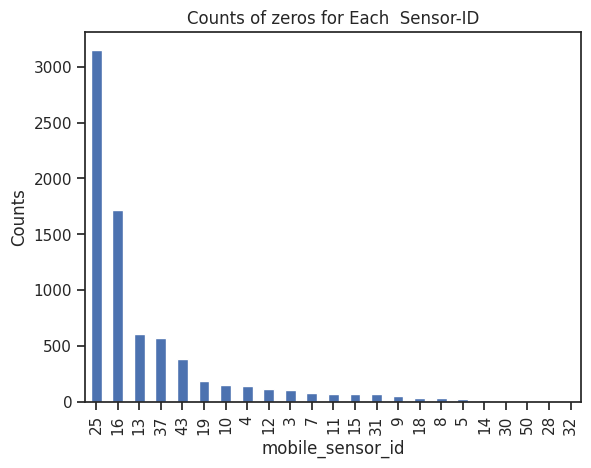

In [ ]:
# count number of zero for each sensors
sensor_counts = zeros['Sensor-id'].value_counts()

print(sensor_counts)

sensor_counts.plot(kind='bar')

plt.title('Counts of zeros for Each  Sensor-ID')
plt.xlabel('mobile_sensor_id')
plt.ylabel('Counts')

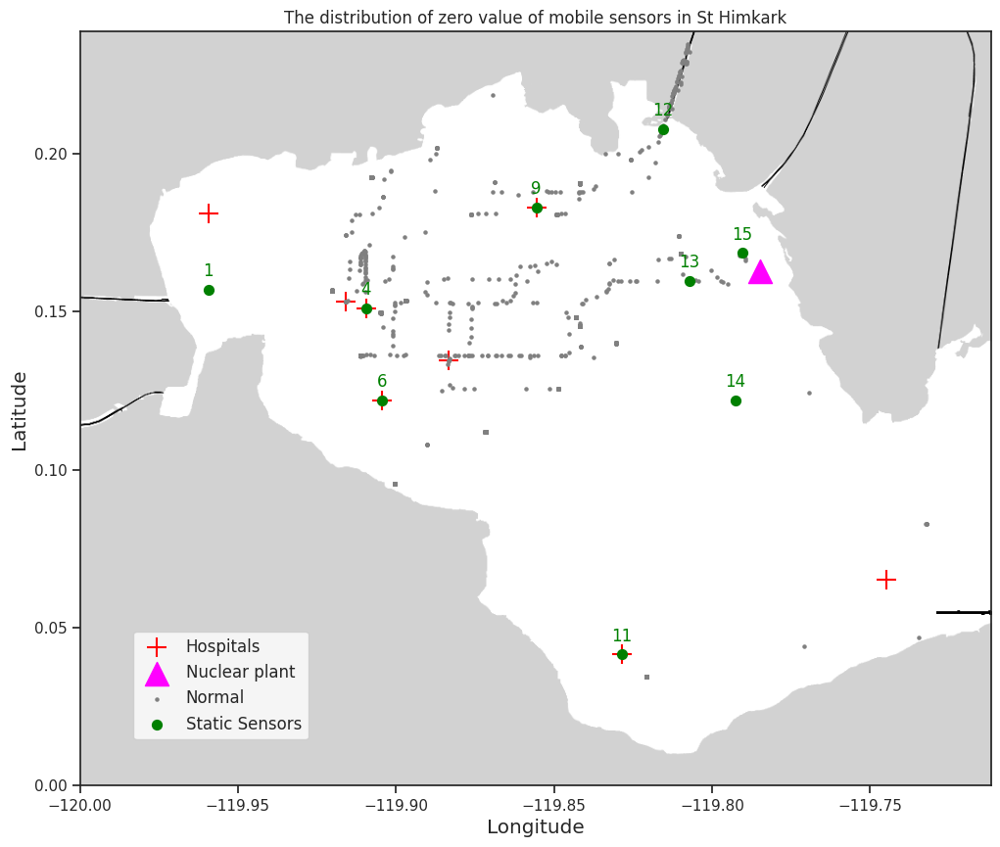

In [ ]:
# Plot the Zero value on map
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
gdf_static_sensors = gpd.GeoDataFrame(staLocation, geometry='Location')

gdf_mobile_std_large = gpd.GeoDataFrame(zeros,
    geometry=gpd.points_from_xy(zeros['Long'], zeros['Lat'])
)

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')
gdf_mobile_std_large.plot(ax=ax, color='grey', marker='o', markersize=5, label='Normal')
gdf_static_sensors.plot(ax=ax, color='green', marker='o', markersize=50, label='Static Sensors')

# Annotate static sensors
for idx, row in gdf_static_sensors.iterrows():
    ax.annotate(row['Sensor-id'],
                (row['Location'].x, row['Location'].y),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center', fontsize=12,
                color='green')

# Add labels or other annotations as needed
ax.set_title('The distribution of zero value of mobile sensors in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()


2.Use data analytics to represent and analyze uncertainty in the measurement of radiation across the city.

Compare uncertainty of the static sensors to the mobile sensors. What anomalies can you see? Are there sensors that are too uncertain to trust?
Which regions of the city have greater uncertainty of radiation measurement? Use data analytics to explain your rationale.
What effects do you see in the sensor readings after the earthquake and other major events? What effect do these events have on uncertainty?

In [ ]:
# Calculate statistics for static sensors
static_stats = staticDF.groupby('Sensor-id')['Value'].agg(['mean', 'std']).reset_index()
print("Static Sensor Statistics:\n", static_stats)


Static Sensor Statistics:
    Sensor-id       mean        std
0          1  15.125550   9.086119
1          4  15.152775  12.348373
2          6  15.176221  10.087696
3          9  17.103277  13.532463
4         11  15.835089  13.924014
5         12  17.770966  12.882658
6         13  15.502448  12.057826
7         14  15.122809  10.378712
8         15  14.964108  10.998997


Text(0, 0.5, 'Standard Deviation')

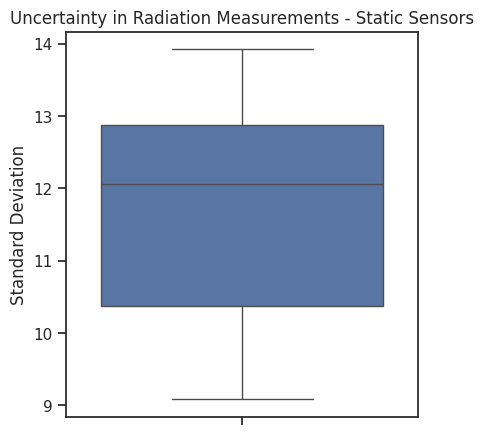

In [ ]:
# Visualization: Boxplot comparing static  uncertainty
plt.figure(figsize=(10, 5))

# Static Sensors
plt.subplot(1, 2, 1)
sns.boxplot(data=static_stats, y='std')
plt.title('Uncertainty in Radiation Measurements - Static Sensors')
plt.ylabel('Standard Deviation')



2.2 Identify Anomalies and Trustworthy Sensors

    Static Sensors:
        Calculate Z-scores for each static sensor’s readings to flag anomalies.
        Visualize or list sensors with the highest Z-scores (those significantly deviating from the mean).

    Mobile Sensors:
        First, Identify grid cells where the standard deviation is unusually high.
        Second, identify the sensor which cause the unuausal in the unuaually high grid.

In [ ]:
from scipy.stats import zscore

# Static Sensors: Calculate Z-scores
staticDF['Z-Score'] = staticDF.groupby('Sensor-id')['Value'].transform(zscore)
static_anomalies = staticDF[staticDF['Z-Score'].abs() > 3]

# Display anomalies
static_anomalies



,Sensor-id,Lat,Long,Location,Lat_grid,Long_grid,grid_Location,Timestamp,Value,Units,Z-Score
37333,12,0.20764,-119.81556,POINT (-119.81556 0.20764),0.207,-119.816,POINT (-119.816 0.207),2020-04-08 03:51:05,843.266,cpm,64.078375
46695,12,0.20764,-119.81556,POINT (-119.81556 0.20764),0.207,-119.816,POINT (-119.816 0.207),2020-04-08 16:51:15,743.573,cpm,56.339787
46704,12,0.20764,-119.81556,POINT (-119.81556 0.20764),0.207,-119.816,POINT (-119.816 0.207),2020-04-08 16:52:00,61.526,cpm,3.396449
46705,12,0.20764,-119.81556,POINT (-119.81556 0.20764),0.207,-119.816,POINT (-119.816 0.207),2020-04-08 16:52:05,66.655,cpm,3.794583
46706,12,0.20764,-119.81556,POINT (-119.81556 0.20764),0.207,-119.816,POINT (-119.816 0.207),2020-04-08 16:52:10,79.822,cpm,4.816661
...,...,...,...,...,...,...,...,...,...,...,...
741771,4,0.15109,-119.90952,POINT (-119.90952 0.15109),0.151,-119.910,POINT (-119.91 0.151),2020-04-10 20:54:05,200.936,cpm,15.045245
741772,4,0.15109,-119.90952,POINT (-119.90952 0.15109),0.151,-119.910,POINT (-119.91 0.151),2020-04-10 20:54:10,192.666,cpm,14.375518
741773,4,0.15109,-119.90952,POINT (-119.90952 0.15109),0.151,-119.910,POINT (-119.91 0.151),2020-04-10 20:54:15,100.857,cpm,6.940568
741774,4,0.15109,-119.90952,POINT (-119.90952 0.15109),0.151,-119.910,POINT (-119.91 0.151),2020-04-10 20:54:20,61.462,cpm,3.750251


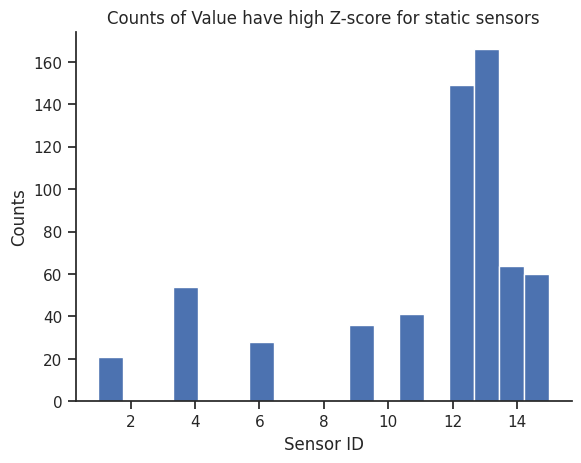

In [ ]:
from matplotlib import pyplot as plt
static_anomalies['Sensor-id'].plot(kind='hist', bins=18, title='Counts of Value have high Z-score for static sensors')
plt.xlabel('Sensor ID')
plt.ylabel('Counts')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:


# Step 1: Calculate the standard deviation for each static sensor
std_dev_by_sensor = staticDF.groupby('Sensor-id')['Value'].std().reset_index()
std_dev_by_sensor.columns = ['Sensor-id', 'std_dev']

# Step 2: Calculate Q1 (25th percentile) and Q3 (75th percentile) of the standard deviations
Q1 = std_dev_by_sensor['std_dev'].quantile(0.25)
Q3 = std_dev_by_sensor['std_dev'].quantile(0.75)
IQR = Q3 - Q1

# Step 3: Define outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Step 4: Identify sensors with unusual variability
unusual_sensors = std_dev_by_sensor[(std_dev_by_sensor['std_dev'] < lower_bound) |
                                    (std_dev_by_sensor['std_dev'] > upper_bound)]

# Display the results
print("Unusual Variability in Static Sensors:")
print(unusual_sensors)


Unusual Variability in Static Sensors:
Empty DataFrame
Columns: [Sensor-id, std_dev]
Index: []


In [ ]:
from sklearn.ensemble import IsolationForest
import pandas as pd

# Step 1: Aggregate the data by Sensor-id and calculate statistics
# Calculate the mean and standard deviation for each static sensor
sensor_stats = staticDF.groupby('Sensor-id')['Value'].agg(['mean', 'std']).reset_index()

# Step 2: Apply Isolation Forest
# Train the Isolation Forest model
iso_forest = IsolationForest(contamination=0.1, random_state=42)
sensor_stats['anomaly'] = iso_forest.fit_predict(sensor_stats[['mean', 'std']])

# Step 3: Identify and display anomalies
anomalies = sensor_stats[sensor_stats['anomaly'] == -1]  # -1 indicates anomaly

# Display the anomalies
print("Anomalous Sensors Detected by Isolation Forest:")
print(anomalies)


Anomalous Sensors Detected by Isolation Forest:
   Sensor-id       mean        std  anomaly
5         12  17.770966  12.882658       -1


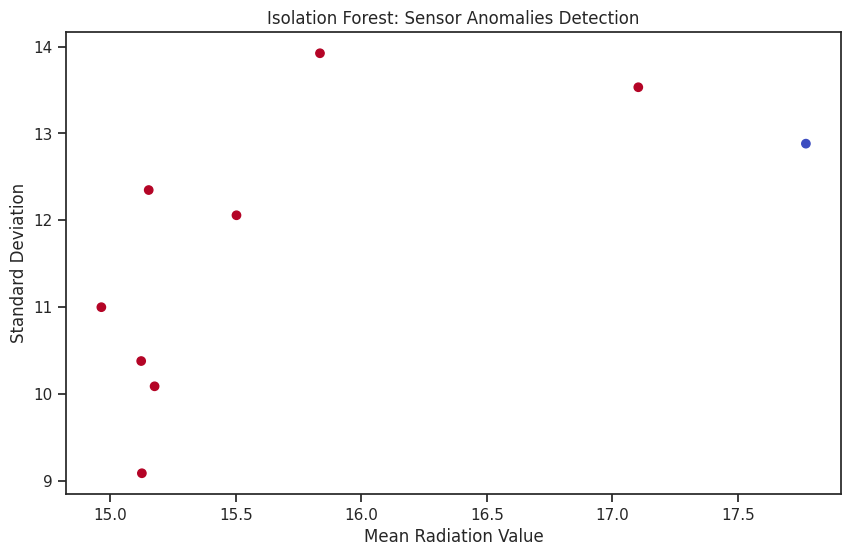

In [ ]:
import matplotlib.pyplot as plt

# Scatter plot to visualize the anomalies
plt.figure(figsize=(10, 6))
plt.scatter(sensor_stats['mean'], sensor_stats['std'], c=sensor_stats['anomaly'], cmap='coolwarm')
plt.xlabel('Mean Radiation Value')
plt.ylabel('Standard Deviation')
plt.title('Isolation Forest: Sensor Anomalies Detection')
plt.show()

In [ ]:
from sklearn.cluster import DBSCAN
import pandas as pd

# Step 1: Aggregate the data by Sensor-id and calculate statistics
# Calculate the mean and standard deviation for each static sensor
sensor_stats = staticDF.groupby('Sensor-id')['Value'].agg(['mean', 'std']).reset_index()

# Step 2: Apply DBSCAN
# Train the DBSCAN model
dbscan = DBSCAN(eps=1, min_samples=3)
sensor_stats['cluster'] = dbscan.fit_predict(sensor_stats[['mean', 'std']])

# Step 3: Identify and display anomalies
anomalies = sensor_stats[sensor_stats['cluster'] == -1]

# Display the anomalies
print("Anomalous Sensors Detected by DBSCAN:")
print(anomalies)


Anomalous Sensors Detected by DBSCAN:
   Sensor-id       mean        std  cluster
0          1  15.125550   9.086119       -1
1          4  15.152775  12.348373       -1
3          9  17.103277  13.532463       -1
4         11  15.835089  13.924014       -1
5         12  17.770966  12.882658       -1
6         13  15.502448  12.057826       -1


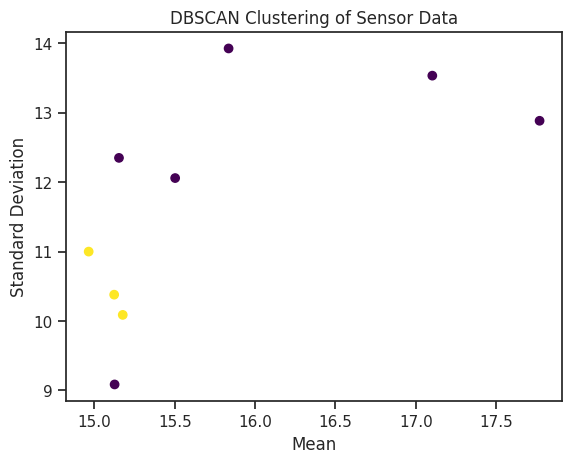

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(sensor_stats['mean'], sensor_stats['std'], c=sensor_stats['cluster'], cmap='viridis')
plt.xlabel('Mean')
plt.ylabel('Standard Deviation')
plt.title('DBSCAN Clustering of Sensor Data')
plt.show()


### Mobile sensors

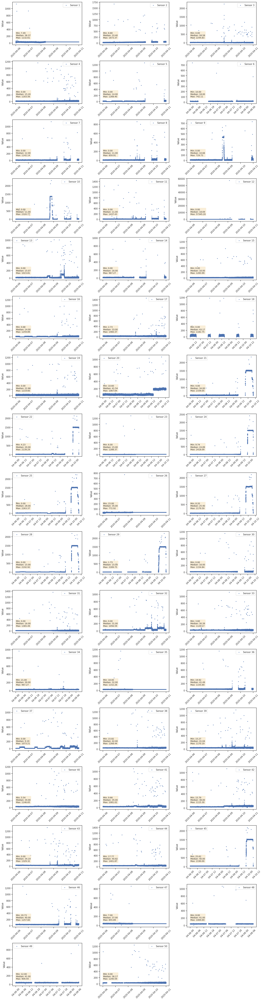

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(mobileDF['Sensor-id'].unique())

nrows = (len(sensor_ids) + 1) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = mobileDF[mobileDF['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Calculate statistics for static sensors
mobile_stats_by_sensor = mobileDF.groupby('Sensor-id')['Value'].agg(['mean', 'std']).reset_index()
print("Mobile Sensor Statistics:\n", mobile_stats_by_sensor)

Mobile Sensor Statistics:
     Sensor-id        mean         std
0           1   32.867827    7.892617
1           2   34.992438   17.941701
2           3   19.897415   20.551135
3           4   16.051301   16.046763
4           5   12.983964   13.898937
5           6   17.844160    7.345671
6           7   12.665787   11.593888
7           8   12.085639   10.700803
8           9   24.531329   72.626269
9          10   58.363256  237.102802
10         11   12.607863   16.619556
11         12   20.080571  246.009013
12         13   19.688750   23.846109
13         14   16.109263   10.038055
14         15   16.655391   12.113358
15         16   13.253977   13.340666
16         17   33.356272   13.630878
17         18   43.022862   20.397199
18         19   23.560309   16.147292
19         20   57.339992   49.990592
20         21  156.591158  399.516509
21         22  117.283669  364.580150
22         23   13.995456    7.785816
23         24  114.475993  352.530329
24         25  137.9652

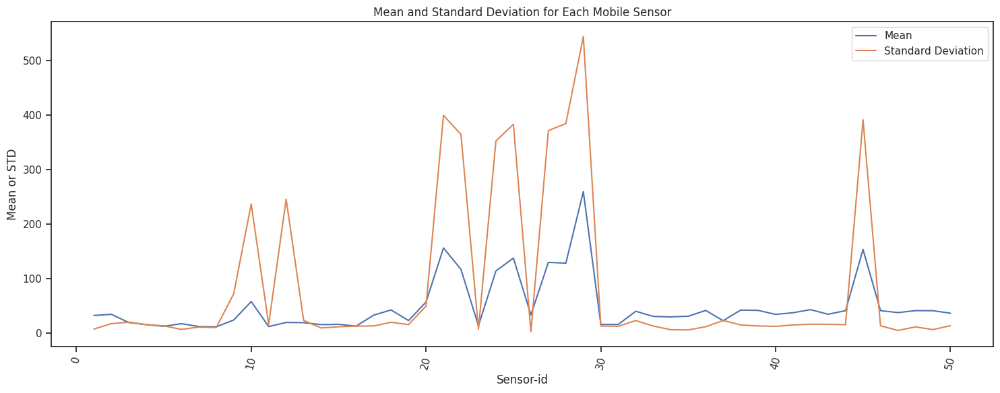

In [ ]:
# Plot mean and std for each mobile sensor
fig, ax = plt.subplots(figsize=(15, 6))

ax.plot(mobile_stats_by_sensor['Sensor-id'], mobile_stats_by_sensor['mean'], label='Mean')
ax.plot(mobile_stats_by_sensor['Sensor-id'], mobile_stats_by_sensor['std'], label='Standard Deviation')

ax.set_xlabel('Sensor-id')
ax.set_ylabel('Mean or STD')
ax.set_title('Mean and Standard Deviation for Each Mobile Sensor')
plt.xticks(rotation=75)
ax.legend()
plt.tight_layout()
plt.show()


In [ ]:
# Static Sensors: Calculate Z-scores
mobileDF['Z-Score'] = mobileDF.groupby('Sensor-id')['Value'].transform(zscore)
mobile_anomalies_by_sensor = mobileDF[mobileDF['Z-Score'].abs() > 3]

# Display anomalies
mobile_anomalies_by_sensor

,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,Z-Score
254,2020-04-06 00:00:25,26,-119.862250,0.055680,23.000000,cpm,CitizenScientist,-3.281084
315,2020-04-06 00:00:30,26,-119.862250,0.055680,23.000000,cpm,CitizenScientist,-3.281084
394,2020-04-06 00:00:40,26,-119.862250,0.055680,21.000000,cpm,CitizenScientist,-3.877795
588,2020-04-06 00:01:00,26,-119.862250,0.055680,23.000000,cpm,CitizenScientist,-3.281084
979,2020-04-06 00:01:40,26,-119.862250,0.055680,22.000000,cpm,CitizenScientist,-3.579439
...,...,...,...,...,...,...,...,...
3289635,2020-04-10 22:50:10,41,-119.883546,0.121761,445.308390,cpm,CitizenScientist,26.216019
3291128,2020-04-10 22:54:15,42,-119.818514,0.121926,790.757883,cpm,AlwaysGlowing,44.305901
3292711,2020-04-10 22:58:25,50,-119.904060,0.186037,629.541536,cpm,MySensor,41.942400
3295115,2020-04-10 23:04:45,2,-119.967096,0.174064,89.266846,cpm,TestUnit,3.025064


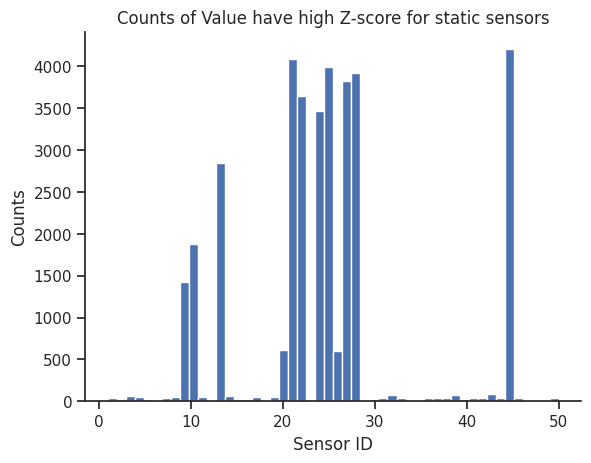

In [ ]:
mobile_anomalies_by_sensor['Sensor-id'].plot(kind='hist', bins=50, title='Counts of Value have high Z-score for static sensors')
plt.xlabel('Sensor ID')
plt.ylabel('Counts')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:

# Calculate counts of each sensor ID
sensor_counts = mobile_anomalies_by_sensor['Sensor-id'].value_counts()

# Filter sensor IDs with counts greater than 100
sensor_ids_above_100 = sensor_counts[sensor_counts > 100].index.tolist()

# Print the result
print("Sensor IDs with counts greater than 100:", sensor_ids_above_100)


Sensor IDs with counts greater than 100: [45, 21, 25, 28, 27, 22, 24, 13, 10, 9, 20, 26]


In [ ]:
# set up the size of grid
lat_grid_size = 0.001  # above 0.11 km on the equator
lon_grid_size = 0.001  # above 0.11 km on the equator

In [ ]:

# Calculate statistics for mobile sensors

mobileDF_grid = mobileDF.copy()
# add new column of grid
mobileDF_grid['Lat_grid'] = ((mobileDF_grid['Lat'] // lat_grid_size) * lat_grid_size).round(3)
mobileDF_grid['Long_grid'] = ((mobileDF_grid['Long'] // lon_grid_size) * lon_grid_size).round(3)

# Group by grid cells
mobileDF_grid['grid_mean'] = mobileDF_grid.groupby(['Lat_grid', 'Long_grid'])['Value'].transform('mean')
mobileDF_grid['grid_std'] = mobileDF_grid.groupby(['Lat_grid', 'Long_grid'])['Value'].transform('std')

mobileDF_grid


,Timestamp,Sensor-id,Long,Lat,Value,Units,User-id,Z-Score,Lat_grid,Long_grid,grid_mean,grid_std
50,2020-04-06 00:00:05,41,-119.883420,0.121800,33.000000,cpm,CitizenScientist,-0.315653,0.121,-119.884,35.558944,12.847716
51,2020-04-06 00:00:05,27,-119.805700,0.017110,16.000000,cpm,CitizenScientist,-0.307197,0.017,-119.806,24.859654,10.251916
52,2020-04-06 00:00:05,45,-119.831220,0.062350,40.000000,cpm,CitizenScientist,-0.290730,0.062,-119.832,39.291392,7.562902
53,2020-04-06 00:00:05,17,-119.925180,0.117450,27.000000,cpm,HiMarkHS,-0.466317,0.117,-119.926,33.659488,13.715191
54,2020-04-06 00:00:05,50,-119.904010,0.186180,0.000000,cpm,MySensor,-2.619435,0.186,-119.905,37.386518,15.561903
...,...,...,...,...,...,...,...,...,...,...,...,...
3315706,2020-04-10 23:59:45,44,-119.890380,0.166068,42.280195,cpm,TaxiDriver,0.035761,0.166,-119.891,40.661290,14.492663
3315707,2020-04-10 23:59:45,8,-119.837600,0.175669,16.628476,cpm,MySensor,0.424536,0.175,-119.838,16.727167,8.871846
3315708,2020-04-10 23:59:45,41,-119.883546,0.121761,32.440810,cpm,CitizenScientist,-0.351637,0.121,-119.884,35.558944,12.847716
3315709,2020-04-10 23:59:45,14,-119.841615,0.138788,21.707422,cpm,AS-3,0.557699,0.138,-119.842,15.899599,9.587914


In [ ]:
mobile_grid_stats = mobileDF_grid[['Lat_grid', 'Long_grid', 'grid_mean', 'grid_std']].copy()
mobile_grid_stats = mobile_grid_stats.drop_duplicates()
mobile_grid_stats.reset_index(drop=True, inplace=True)
mobile_grid_stats


,Lat_grid,Long_grid,grid_mean,grid_std
0,0.121,-119.884,35.558944,12.847716
1,0.017,-119.806,24.859654,10.251916
2,0.062,-119.832,39.291392,7.562902
3,0.117,-119.926,33.659488,13.715191
4,0.186,-119.905,37.386518,15.561903
...,...,...,...,...
8319,0.198,-119.894,0.613948,NaN
8320,0.199,-119.894,14.232270,6.711370
8321,0.199,-119.893,14.930157,6.108176
8322,0.199,-119.892,8.689439,5.632303


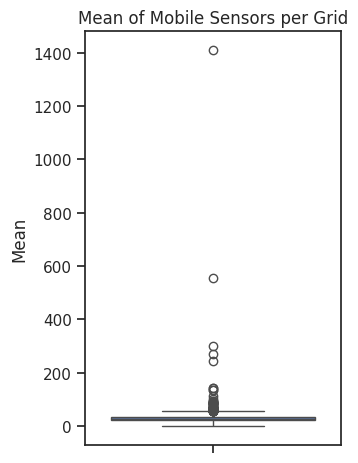

In [ ]:
# Mobile Sensors
plt.subplot(1, 2, 2)
sns.boxplot(data=mobile_grid_stats, y='grid_mean')
plt.title('Mean of Mobile Sensors per Grid')
plt.ylabel('Mean')

plt.tight_layout()
plt.show()

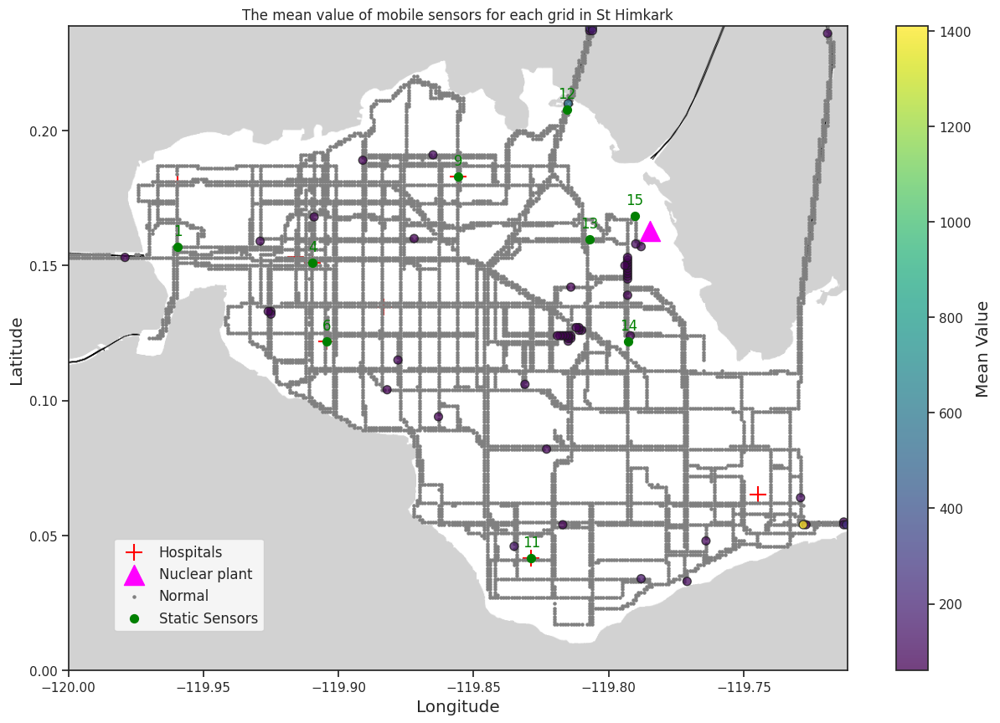

In [ ]:
# Plot the mean on map
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]
mean_threshold = 60 # Filter the DataFrame based on the 'std' value
mobile_grid_stats_safe = mobile_grid_stats[mobile_grid_stats['grid_mean'] < mean_threshold]
mobile_grid_stats_high = mobile_grid_stats[mobile_grid_stats['grid_mean'] >= mean_threshold]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
gdf_static_sensors = gpd.GeoDataFrame(staLocation, geometry='Location')
gdf_mobile_std_small = gpd.GeoDataFrame(
    mobile_grid_stats_safe,
    geometry=gpd.points_from_xy(mobile_grid_stats_safe['Long_grid'], mobile_grid_stats_safe['Lat_grid'])
)

gdf_mobile_std_large = gpd.GeoDataFrame(
    mobile_grid_stats_high,
    geometry=gpd.points_from_xy(mobile_grid_stats_high['Long_grid'], mobile_grid_stats_high['Lat_grid'])
)

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')
gdf_mobile_std_small.plot(ax=ax, color='grey', marker='o', markersize=5, label='Normal')
scatter = ax.scatter(
    gdf_mobile_std_large.geometry.x,  # Longitude values
    gdf_mobile_std_large.geometry.y,  # Latitude values
    c=gdf_mobile_std_large['grid_mean'],    # Color by std values
    cmap='viridis',               # Colormap
    s=50,                        # Marker size
    edgecolor='k',                # Marker edge color
    alpha=0.75,
)

gdf_static_sensors.plot(ax=ax, color='green', marker='o', markersize=50, label='Static Sensors')

# Annotate static sensors
for idx, row in gdf_static_sensors.iterrows():
    ax.annotate(row['Sensor-id'],
                (row['Location'].x, row['Location'].y),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center', fontsize=12,
                color='green')


# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Mean Value', fontsize='large')

# Add labels or other annotations as needed
ax.set_title('The mean value of mobile sensors for each grid in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

In [ ]:
mobile_grid_stats_high

,Lat_grid,Long_grid,grid_mean,grid_std
881,0.159,-119.929,83.593448,215.535076
1133,0.104,-119.882,64.169846,127.423293
1189,0.115,-119.878,84.985000,204.425048
1290,0.094,-119.863,64.658193,136.337867
1914,0.153,-119.979,62.964545,106.398192
2364,0.189,-119.891,69.836643,140.952314
2903,0.048,-119.764,91.244769,249.504748
3016,0.124,-119.792,64.353905,174.130629
3138,0.145,-119.793,82.804949,127.072041
3140,0.146,-119.793,62.857064,23.032394


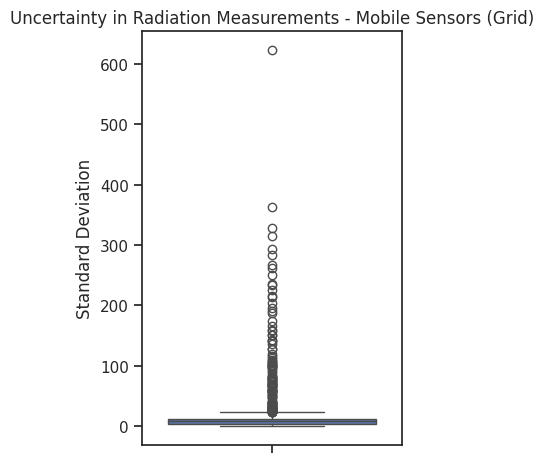

In [ ]:
# Mobile Sensors
plt.subplot(1, 2, 2)
sns.boxplot(data=mobile_grid_stats, y='grid_std')
plt.title('Uncertainty in Radiation Measurements - Mobile Sensors (Grid)')
plt.ylabel('Standard Deviation')

plt.tight_layout()
plt.show()

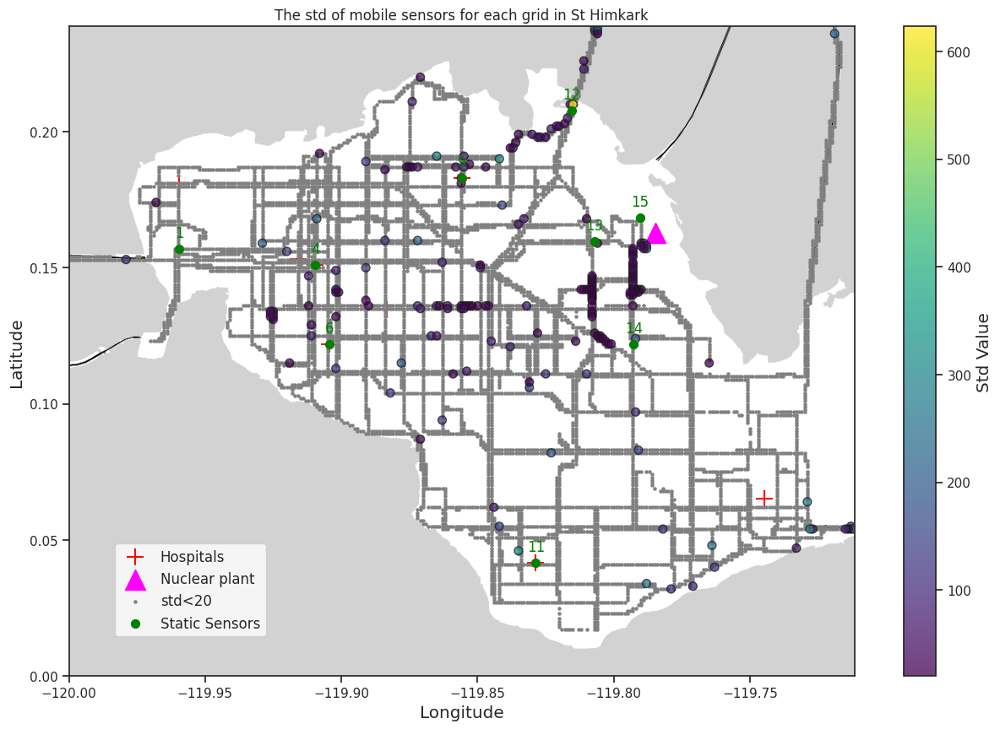

In [ ]:
# Plot std on the map
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Define the threshold for filtering
std_threshold = 20 # Filter the DataFrame based on the 'std' value
mobile_grid_stats_less = mobile_grid_stats[mobile_grid_stats['grid_std'] < std_threshold]
mobile_grid_stats_more = mobile_grid_stats[mobile_grid_stats['grid_std'] >= std_threshold]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
gdf_static_sensors = gpd.GeoDataFrame(staLocation, geometry='Location')

# Create GeoDataFrame for filtered data
gdf_mobile_std_less = gpd.GeoDataFrame(
    mobile_grid_stats_less,
    geometry=gpd.points_from_xy(mobile_grid_stats_less['Long_grid'], mobile_grid_stats_less['Lat_grid'])
)

gdf_mobile_std_more = gpd.GeoDataFrame(
    mobile_grid_stats_more,
    geometry=gpd.points_from_xy(mobile_grid_stats_more['Long_grid'], mobile_grid_stats_more['Lat_grid'])
)

# Plotting a heatmap for uncertainty in mobile sensors

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

# Plotting the mobile sensors with color based on 'mean' values
gdf_mobile_std_less.plot(ax=ax, color='grey', marker='o', markersize=5, label='std<20')
scatter = ax.scatter(
    gdf_mobile_std_more.geometry.x,  # Longitude values
    gdf_mobile_std_more.geometry.y,  # Latitude values
    c=gdf_mobile_std_more['grid_std'],    # Color by std values
    cmap='viridis',               # Colormap
    s=50,                        # Marker size
    edgecolor='k',                # Marker edge color
    alpha=0.75,                   # Marker transparency

)


gdf_static_sensors.plot(ax=ax, color='green', marker='o', markersize=50, label='Static Sensors')

# Annotate static sensors
for idx, row in gdf_static_sensors.iterrows():
    ax.annotate(row['Sensor-id'],
                (row['Location'].x, row['Location'].y),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center', fontsize=12,
                color='green')


# Add colorbar
cbar = plt.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Std Value', fontsize='large')

# Add labels or other annotations as needed
ax.set_title('The std of mobile sensors for each grid in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

In [ ]:
mobile_grid_stats_more

,Lat_grid,Long_grid,grid_mean,grid_std
11,0.192,-119.908,19.471744,21.670734
45,0.190,-119.842,21.057117,327.390794
176,0.121,-119.838,51.965321,82.021232
181,0.111,-119.825,43.754907,97.216019
184,0.125,-119.911,44.863772,77.321855
...,...,...,...,...
7854,0.047,-119.733,34.409370,51.918002
7958,0.032,-119.779,40.449774,94.948842
7974,0.040,-119.763,42.704007,115.435041
8009,0.034,-119.788,142.586771,261.382745


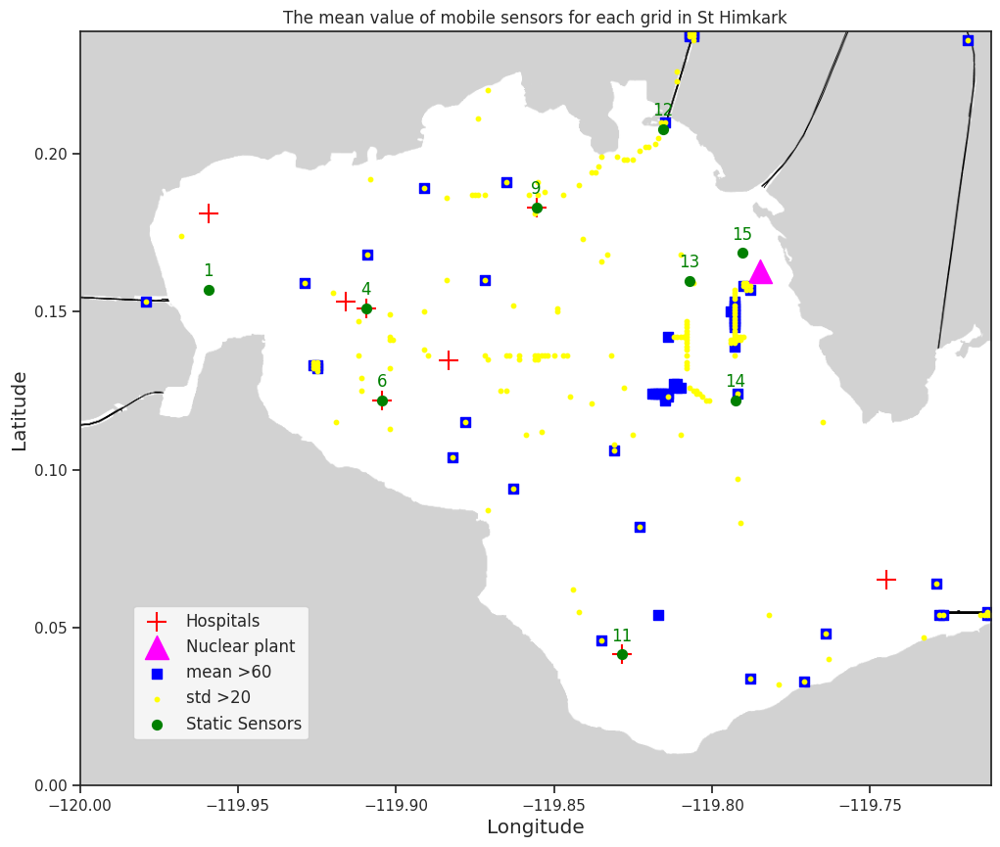

In [ ]:
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Create a GeoDataFrame with the data points

# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]
# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
gdf_static_sensors = gpd.GeoDataFrame(staLocation, geometry='Location')

gdf_mobile_std_large = gpd.GeoDataFrame(
    mobile_grid_stats_high,
    geometry=gpd.points_from_xy(mobile_grid_stats_high['Long_grid'], mobile_grid_stats_high['Lat_grid'])
)

gdf_mobile_std_more = gpd.GeoDataFrame(
    mobile_grid_stats_more,
    geometry=gpd.points_from_xy(mobile_grid_stats_more['Long_grid'], mobile_grid_stats_more['Lat_grid'])
)

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

# Plot the GeoDataFrame
gdf_mobile_std_large.plot(ax=ax, color='blue', marker='s', markersize=50, label='mean >60')
gdf_mobile_std_more.plot(ax=ax, color='yellow', marker='o', markersize=10, label='std >20')
gdf_static_sensors.plot(ax=ax, color='green', marker='o', markersize=50, label='Static Sensors')

# Annotate static sensors
for idx, row in gdf_static_sensors.iterrows():
    ax.annotate(row['Sensor-id'],
                (row['Location'].x, row['Location'].y),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center', fontsize=12,
                color='green')


# Add labels or other annotations as needed
ax.set_title('The mean value of mobile sensors for each grid in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()





In [ ]:
# Z-zone

from scipy.stats import zscore
mobile_grid_stats['Z-Score'] = zscore(mobile_grid_stats['grid_mean'])
mobile_anomalies_Zscore = mobile_grid_stats[mobile_grid_stats['Z-Score'].abs() > 3]
mobile_anomalies_Zscore

,Lat_grid,Long_grid,grid_mean,grid_std,Z-Score
2903,0.048,-119.764,91.244769,249.504748,3.167806
3234,0.157,-119.788,94.241793,165.254359,3.319911
3966,0.210,-119.815,556.998383,623.098776,26.805715
4237,0.132,-119.925,88.171620,101.768027,3.011837
4432,0.238,-119.807,243.238973,158.171210,10.881810
4434,0.238,-119.806,301.654434,362.964181,13.846509
4507,0.236,-119.719,91.503348,213.377805,3.180929
5013,0.033,-119.771,100.463832,76.785599,3.635691
5058,0.237,-119.806,141.907115,187.507736,5.739019
5993,0.046,-119.835,136.574234,314.325827,5.468365


In [ ]:
from sklearn.cluster import DBSCAN

# use 'std' as a feature to detect anomalies
dbscan = DBSCAN(eps=0.5, min_samples=5)
mobile_grid_stats.dropna(subset=['grid_std'], inplace=True)
mobile_grid_stats['cluster'] = dbscan.fit_predict(mobile_grid_stats[['grid_std']])

# label the grid which identify as noise by DBSCAN
mobile_anomalies_DBSCAN = mobile_grid_stats[mobile_grid_stats['cluster'] == -1]

mobile_anomalies_DBSCAN

,Lat_grid,Long_grid,grid_mean,grid_std,Z-Score,cluster
45,0.190,-119.842,21.057117,327.390794,-0.394355,-1
176,0.121,-119.838,51.965321,82.021232,1.174297,-1
181,0.111,-119.825,43.754907,97.216019,0.757602,-1
184,0.125,-119.911,44.863772,77.321855,0.813879,-1
228,0.149,-119.902,31.360900,68.401463,0.128582,-1
...,...,...,...,...,...,...
7854,0.047,-119.733,34.409370,51.918002,0.283298,-1
7958,0.032,-119.779,40.449774,94.948842,0.589860,-1
7974,0.040,-119.763,42.704007,115.435041,0.704267,-1
8009,0.034,-119.788,142.586771,261.382745,5.773513,-1


In [ ]:
Q1 = mobile_grid_stats['grid_std'].quantile(0.25)
Q3 = mobile_grid_stats['grid_std'].quantile(0.75)
IQR = Q3 - Q1
threshold_low = Q1 - 1.5 * IQR
threshold_high = Q3 + 1.5 * IQR

# label the anomalies grid
mobile_anomalies_IQR = mobile_grid_stats[(mobile_grid_stats['grid_std'] < threshold_low) | (mobile_grid_stats['grid_std'] > threshold_high)]
mobile_anomalies_IQR


,Lat_grid,Long_grid,grid_mean,grid_std,Z-Score,cluster
45,0.190,-119.842,21.057117,327.390794,-0.394355,-1
176,0.121,-119.838,51.965321,82.021232,1.174297,-1
181,0.111,-119.825,43.754907,97.216019,0.757602,-1
184,0.125,-119.911,44.863772,77.321855,0.813879,-1
228,0.149,-119.902,31.360900,68.401463,0.128582,-1
...,...,...,...,...,...,...
7854,0.047,-119.733,34.409370,51.918002,0.283298,-1
7958,0.032,-119.779,40.449774,94.948842,0.589860,-1
7974,0.040,-119.763,42.704007,115.435041,0.704267,-1
8009,0.034,-119.788,142.586771,261.382745,5.773513,-1


In [ ]:
from sklearn.ensemble import IsolationForest

# use IsolationForest detect anomalies
iso_forest = IsolationForest(contamination=0.01, random_state=42)
mobile_grid_stats['anomaly_iso'] = iso_forest.fit_predict(mobile_grid_stats[['grid_std']])

# label the grid which identify as noise by IsolationForest
mobile_anomalies_IsoForest = mobile_grid_stats[mobile_grid_stats['anomaly_iso'] == -1]
mobile_anomalies_IsoForest


,Lat_grid,Long_grid,grid_mean,grid_std,Z-Score,cluster,anomaly_iso
45,0.190,-119.842,21.057117,327.390794,-0.394355,-1,-1
176,0.121,-119.838,51.965321,82.021232,1.174297,-1,-1
181,0.111,-119.825,43.754907,97.216019,0.757602,-1,-1
184,0.125,-119.911,44.863772,77.321855,0.813879,-1,-1
228,0.149,-119.902,31.360900,68.401463,0.128582,-1,-1
...,...,...,...,...,...,...,...
7745,0.054,-119.728,1409.845524,283.165503,70.089380,-1,-1
7854,0.047,-119.733,34.409370,51.918002,0.283298,-1,-1
7958,0.032,-119.779,40.449774,94.948842,0.589860,-1,-1
7974,0.040,-119.763,42.704007,115.435041,0.704267,-1,-1


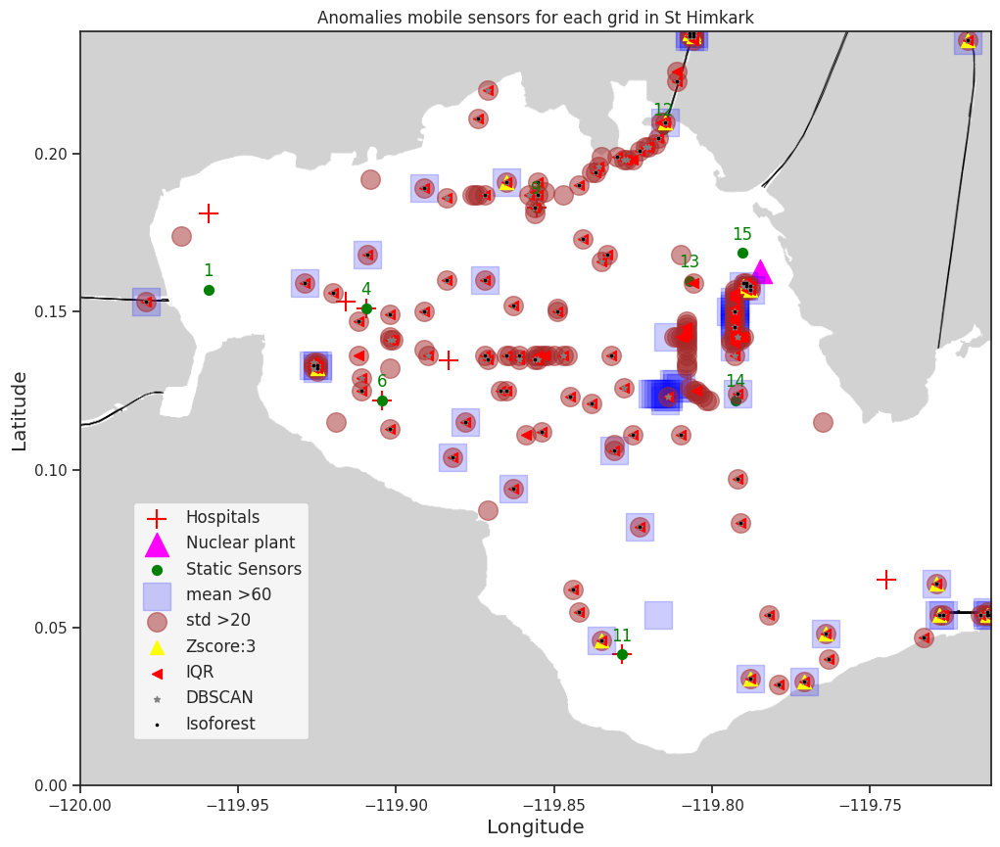

In [ ]:

# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Create a GeoDataFrame with the data points
# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
gdf_static_sensors = gpd.GeoDataFrame(staLocation, geometry='Location')

gdf_mobile_std_large = gpd.GeoDataFrame(mobile_grid_stats_high,geometry=gpd.points_from_xy(mobile_grid_stats_high['Long_grid'], mobile_grid_stats_high['Lat_grid']))

gdf_mobile_std_more = gpd.GeoDataFrame(mobile_grid_stats_more,geometry=gpd.points_from_xy(mobile_grid_stats_more['Long_grid'], mobile_grid_stats_more['Lat_grid']))

gdf_mobile_anomalies_Zscore = gpd.GeoDataFrame(mobile_anomalies_Zscore, geometry=gpd.points_from_xy(mobile_anomalies_Zscore['Long_grid'], mobile_anomalies_Zscore['Lat_grid']))

gdf_mobile_anomalies_IQR = gpd.GeoDataFrame(mobile_anomalies_IQR, geometry=gpd.points_from_xy(mobile_anomalies_IQR['Long_grid'], mobile_anomalies_IQR['Lat_grid']))

gdf_mobile_anomalies_DBSCAN = gpd.GeoDataFrame(mobile_anomalies_DBSCAN, geometry=gpd.points_from_xy(mobile_anomalies_DBSCAN['Long_grid'], mobile_anomalies_DBSCAN['Lat_grid']))

gdf_mobile_anomalies_Isoforest = gpd.GeoDataFrame(mobile_anomalies_IsoForest, geometry=gpd.points_from_xy(mobile_anomalies_IsoForest['Long_grid'], mobile_anomalies_IsoForest['Lat_grid']))


# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame

# Plot the GeoDataFrame
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

gdf_static_sensors.plot(ax=ax, color='green', marker='o', markersize=50, label='Static Sensors')

# Annotate static sensors
for idx, row in gdf_static_sensors.iterrows():
    ax.annotate(row['Sensor-id'],
                (row['Location'].x, row['Location'].y),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center', fontsize=12,
                color='green')


gdf_mobile_std_large.plot(ax=ax, color='blue', marker='s', markersize=400, label='mean >60', alpha = 0.2)
gdf_mobile_std_more.plot(ax=ax, color='brown', marker='o', markersize=200, label='std >20',  alpha = 0.5)
gdf_mobile_anomalies_Zscore.plot(ax=ax, color='yellow', marker='^', markersize=100, label='Zscore:3')
gdf_mobile_anomalies_IQR.plot(ax=ax, color='red', marker='<', markersize=50, label='IQR')
gdf_mobile_anomalies_DBSCAN.plot(ax=ax, color='grey', marker='*', markersize=20, label='DBSCAN')
gdf_mobile_anomalies_Isoforest.plot(ax=ax, color='black', marker='.', markersize=10, label='Isoforest')

# Add labels or other annotations as needed
ax.set_title('Anomalies mobile sensors for each grid in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()


In [ ]:
# merge all the anomalies and delete the duplicates
df1 = mobile_grid_stats_high[['Lat_grid', 'Long_grid', 'grid_mean', 'grid_std']].copy()
df2 = mobile_grid_stats_more[['Lat_grid', 'Long_grid', 'grid_mean', 'grid_std']].copy()
df3 = mobile_anomalies_Zscore[['Lat_grid', 'Long_grid', 'grid_mean', 'grid_std']].copy()
df4 = mobile_anomalies_IQR[['Lat_grid', 'Long_grid', 'grid_mean', 'grid_std']].copy()
df5 = mobile_anomalies_DBSCAN[['Lat_grid', 'Long_grid', 'grid_mean', 'grid_std']].copy()
df6 = mobile_anomalies_IsoForest[['Lat_grid', 'Long_grid', 'grid_mean', 'grid_std']].copy()
merged_df = pd.concat([df1, df2, df3, df4, df5, df6], axis=0, ignore_index=True)

merged_df.drop_duplicates(inplace=True)
merged_df.reset_index(drop=True)


,Lat_grid,Long_grid,grid_mean,grid_std
0,0.159,-119.929,83.593448,215.535076
1,0.104,-119.882,64.169846,127.423293
2,0.115,-119.878,84.985000,204.425048
3,0.094,-119.863,64.658193,136.337867
4,0.153,-119.979,62.964545,106.398192
...,...,...,...,...
203,0.054,-119.714,42.750190,20.996394
204,0.054,-119.715,37.777081,77.888290
205,0.047,-119.733,34.409370,51.918002
206,0.032,-119.779,40.449774,94.948842


In [ ]:
merged_df.to_csv('/content/drive/My Drive/data/mobile_anomalies.csv', index=False)

In [ ]:
mobile_anomalies = pd.read_csv('/content/drive/My Drive/data/mobile_anomalies.csv')

In [ ]:
mobile_sensors = mobileDF_grid[['Timestamp','Sensor-id', 'Lat', 'Long', 'Value','Lat_grid', 'Long_grid']].copy()
mobile_sensors.drop_duplicates(inplace=True)

In [ ]:
merged_df = pd.merge(mobile_anomalies, mobile_sensors, on=['Lat_grid', 'Long_grid'], how='inner')
merged_df.drop_duplicates(inplace=True)
merged_df.reset_index(drop=True)
merged_df
merged_df.to_csv('/content/drive/My Drive/data/mobile_anomalies_with_sensor_id_value.csv', index=False)

In [ ]:
mobile_anomalies_with_sensor = pd.read_csv('/content/drive/My Drive/data/mobile_anomalies_with_sensor_id_value.csv')
mobile_anomalies_with_sensor

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value
0,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:30,38,0.159855,-119.928655,40.000000
1,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:35,38,0.159631,-119.928658,43.000000
2,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:40,38,0.159327,-119.928660,40.000000
3,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:45,38,0.159046,-119.928660,40.000000
4,0.159,-119.929,83.593448,215.535076,2020-04-07 06:56:55,44,0.159907,-119.928652,45.000000
...,...,...,...,...,...,...,...,...,...
250475,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:20,25,0.040834,-119.762342,34.839659
250476,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:30,25,0.040854,-119.762187,30.171192
250477,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:35,25,0.040863,-119.762117,23.474892
250478,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:40,25,0.040872,-119.762050,24.264069


In [ ]:
# Calculate mean per sensor, grid
mobile_anomalies_with_sensor['grid_sensor_mean'] = mobile_anomalies_with_sensor.groupby(['Sensor-id', 'Lat_grid', 'Long_grid'])['Value'].transform('mean')
# Calculate std per sensor, grid
mobile_anomalies_with_sensor['grid_sensor_std'] = mobile_anomalies_with_sensor.groupby(['Sensor-id', 'Lat_grid', 'Long_grid'])['Value'].transform('std')

mobile_anomalies_with_sensor


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std
0,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:30,38,0.159855,-119.928655,40.000000,103.246092,258.812458
1,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:35,38,0.159631,-119.928658,43.000000,103.246092,258.812458
2,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:40,38,0.159327,-119.928660,40.000000,103.246092,258.812458
3,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:45,38,0.159046,-119.928660,40.000000,103.246092,258.812458
4,0.159,-119.929,83.593448,215.535076,2020-04-07 06:56:55,44,0.159907,-119.928652,45.000000,41.750000,2.500000
...,...,...,...,...,...,...,...,...,...,...,...
250475,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:20,25,0.040834,-119.762342,34.839659,24.541038,6.066569
250476,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:30,25,0.040854,-119.762187,30.171192,24.541038,6.066569
250477,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:35,25,0.040863,-119.762117,23.474892,24.541038,6.066569
250478,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:40,25,0.040872,-119.762050,24.264069,24.541038,6.066569


In [ ]:
mobile_anomalies_with_sensor.isna().sum()

,0
Lat_grid,0
Long_grid,0
grid_mean,0
grid_std,2
Timestamp,0
Sensor-id,0
Lat,0
Long,0
Value,0
grid_sensor_mean,0


In [ ]:

mobile_anomalies_with_sensor[mobile_anomalies_with_sensor.isna().any(axis=1)]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std
202,0.147,-119.793,63.271178,26.976855,2020-04-08 16:52:50,22,0.147777,-119.792360,59.914965,59.914965,NaN
27861,0.238,-119.806,301.654434,362.964181,2020-04-06 14:02:35,49,0.238370,-119.805867,45.000000,45.000000,NaN
27862,0.238,-119.806,301.654434,362.964181,2020-04-10 08:17:35,9,0.238372,-119.805874,558.308868,558.308868,NaN
47140,0.064,-119.729,112.448796,266.855811,2020-04-08 11:05:45,14,0.064214,-119.728270,14.727286,14.727286,NaN
47235,0.054,-119.712,268.808697,235.000034,2020-04-08 11:14:20,14,0.054858,-119.711863,12.814719,12.814719,NaN
47244,0.054,-119.712,268.808697,235.000034,2020-04-09 09:59:30,27,0.054759,-119.711868,674.020054,674.020054,NaN
47246,0.054,-119.712,268.808697,235.000034,2020-04-09 10:33:35,25,0.054754,-119.711878,556.096241,556.096241,NaN
47265,0.127,-119.811,60.739197,18.303950,2020-04-10 21:36:45,14,0.127988,-119.810087,33.344469,33.344469,NaN
48978,0.122,-119.815,61.458944,NaN,2020-04-08 16:36:20,44,0.122991,-119.814001,61.458944,61.458944,NaN
93069,0.054,-119.817,60.357962,NaN,2020-04-09 13:26:50,20,0.054938,-119.816187,60.357962,60.357962,NaN


In [ ]:
sensor_anomalies_cleaned = mobile_anomalies_with_sensor.dropna()
sensor_anomalies_cleaned.isna().sum()

,0
Lat_grid,0
Long_grid,0
grid_mean,0
grid_std,0
Timestamp,0
Sensor-id,0
Lat,0
Long,0
Value,0
grid_sensor_mean,0


In [ ]:
# recaculate teh grid_mean, grid_std, grid_sensor_mean, grid_sensor_std after remove the null value

# Recalculate grid_mean and grid_std
sensor_anomalies_cleaned.loc[:,'grid_mean'] = sensor_anomalies_cleaned.groupby(['Lat_grid', 'Long_grid'])['Value'].transform('mean')
sensor_anomalies_cleaned.loc[:,'grid_std'] = sensor_anomalies_cleaned.groupby(['Lat_grid', 'Long_grid'])['Value'].transform('std')

# Recalculate grid_sensor_mean and grid_sensor_std
sensor_anomalies_cleaned.loc[:,'grid_sensor_mean'] = sensor_anomalies_cleaned.groupby(['Sensor-id', 'Lat_grid', 'Long_grid'])['Value'].transform('mean')
sensor_anomalies_cleaned.loc[:,'grid_sensor_std'] = sensor_anomalies_cleaned.groupby(['Sensor-id', 'Lat_grid', 'Long_grid'])['Value'].transform('std')


In [ ]:
sensor_anomalies_cleaned

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std
0,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:30,38,0.159855,-119.928655,40.000000,103.246092,258.812458
1,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:35,38,0.159631,-119.928658,43.000000,103.246092,258.812458
2,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:40,38,0.159327,-119.928660,40.000000,103.246092,258.812458
3,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:45,38,0.159046,-119.928660,40.000000,103.246092,258.812458
4,0.159,-119.929,83.593448,215.535076,2020-04-07 06:56:55,44,0.159907,-119.928652,45.000000,41.750000,2.500000
...,...,...,...,...,...,...,...,...,...,...,...
250475,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:20,25,0.040834,-119.762342,34.839659,24.541038,6.066569
250476,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:30,25,0.040854,-119.762187,30.171192,24.541038,6.066569
250477,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:35,25,0.040863,-119.762117,23.474892,24.541038,6.066569
250478,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:40,25,0.040872,-119.762050,24.264069,24.541038,6.066569


In [ ]:
# add a column grid_number to sensor_anomalies_cleaned, which match to each grid by 'lat_grid' and 'Long_grid'

# Create a unique identifier for each grid
sensor_anomalies_cleaned.loc[:,'grid_number'] = sensor_anomalies_cleaned.groupby(['Lat_grid', 'Long_grid']).ngroup()
sensor_anomalies_cleaned


<ipython-input-11-f0b29e5b5ddc>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensor_anomalies_cleaned.loc[:,'grid_number'] = sensor_anomalies_cleaned.groupby(['Lat_grid', 'Long_grid']).ngroup()


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number
0,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:30,38,0.159855,-119.928655,40.000000,103.246092,258.812458,152
1,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:35,38,0.159631,-119.928658,43.000000,103.246092,258.812458,152
2,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:40,38,0.159327,-119.928660,40.000000,103.246092,258.812458,152
3,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:45,38,0.159046,-119.928660,40.000000,103.246092,258.812458,152
4,0.159,-119.929,83.593448,215.535076,2020-04-07 06:56:55,44,0.159907,-119.928652,45.000000,41.750000,2.500000,152
...,...,...,...,...,...,...,...,...,...,...,...,...
250475,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:20,25,0.040834,-119.762342,34.839659,24.541038,6.066569,3
250476,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:30,25,0.040854,-119.762187,30.171192,24.541038,6.066569,3
250477,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:35,25,0.040863,-119.762117,23.474892,24.541038,6.066569,3
250478,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:40,25,0.040872,-119.762050,24.264069,24.541038,6.066569,3


In [ ]:
b = sensor_anomalies_cleaned['grid_number'].unique()

In [ ]:
print(b.max())

203


In [ ]:
print(f'Total number of anomalies grids are: {len(b)}')


Total number of anomalies grids are: 204


In [ ]:

# Caculate Z-score of each Value compare with the sensor mean
sensor_anomalies_cleaned.loc[:, 'Z_score_sensor'] = (sensor_anomalies_cleaned['Value'] - sensor_anomalies_cleaned['grid_sensor_mean']) / sensor_anomalies_cleaned['grid_sensor_std']

# Caculate Z-score of each Value compare with the sensor mean
sensor_anomalies_cleaned.loc[:, 'Z_score_grid'] = (sensor_anomalies_cleaned['Value'] - sensor_anomalies_cleaned['grid_mean']) / sensor_anomalies_cleaned['grid_std']



<ipython-input-12-edc45bf98b6b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensor_anomalies_cleaned.loc[:, 'Z_score_sensor'] = (sensor_anomalies_cleaned['Value'] - sensor_anomalies_cleaned['grid_sensor_mean']) / sensor_anomalies_cleaned['grid_sensor_std']
<ipython-input-12-edc45bf98b6b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sensor_anomalies_cleaned.loc[:, 'Z_score_grid'] = (sensor_anomalies_cleaned['Value'] - sensor_anomalies_cleaned['grid_mean']) / sensor_anomalies_cleaned['grid_std']


In [ ]:
sensor_anomalies_cleaned

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
0,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:30,38,0.159855,-119.928655,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
1,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:35,38,0.159631,-119.928658,43.000000,103.246092,258.812458,152,-0.232779,-0.188338
2,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:40,38,0.159327,-119.928660,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
3,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:45,38,0.159046,-119.928660,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
4,0.159,-119.929,83.593448,215.535076,2020-04-07 06:56:55,44,0.159907,-119.928652,45.000000,41.750000,2.500000,152,1.300000,-0.179059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250475,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:20,25,0.040834,-119.762342,34.839659,24.541038,6.066569,3,1.697602,-0.068128
250476,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:30,25,0.040854,-119.762187,30.171192,24.541038,6.066569,3,0.928062,-0.108570
250477,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:35,25,0.040863,-119.762117,23.474892,24.541038,6.066569,3,-0.175741,-0.166580
250478,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:40,25,0.040872,-119.762050,24.264069,24.541038,6.066569,3,-0.045655,-0.159743


### filter the row whose grid_std is larger than 20, and check whether it is caused by sigle error read or not

In [ ]:
# filter std larger than 20

selected_std_larger_than_20 = sensor_anomalies_cleaned[sensor_anomalies_cleaned['grid_std'] > 20]
selected_std_larger_than_20


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
0,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:30,38,0.159855,-119.928655,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
1,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:35,38,0.159631,-119.928658,43.000000,103.246092,258.812458,152,-0.232779,-0.188338
2,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:40,38,0.159327,-119.928660,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
3,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:45,38,0.159046,-119.928660,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
4,0.159,-119.929,83.593448,215.535076,2020-04-07 06:56:55,44,0.159907,-119.928652,45.000000,41.750000,2.500000,152,1.300000,-0.179059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250475,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:20,25,0.040834,-119.762342,34.839659,24.541038,6.066569,3,1.697602,-0.068128
250476,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:30,25,0.040854,-119.762187,30.171192,24.541038,6.066569,3,0.928062,-0.108570
250477,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:35,25,0.040863,-119.762117,23.474892,24.541038,6.066569,3,-0.175741,-0.166580
250478,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:40,25,0.040872,-119.762050,24.264069,24.541038,6.066569,3,-0.045655,-0.159743


In [ ]:
selected_df = selected_std_larger_than_20[selected_std_larger_than_20['Z_score_grid'].abs() > 1]
selected_df

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
15,0.159,-119.929,83.593448,215.535076,2020-04-08 06:50:05,38,0.159047,-119.928660,1140.177847,103.246092,258.812458,152,4.006499,4.902146
26,0.104,-119.882,64.169846,127.423293,2020-04-06 06:49:35,25,0.104980,-119.881292,468.638155,173.546052,255.565084,22,1.154665,3.174210
45,0.115,-119.878,84.985000,204.425048,2020-04-07 17:01:00,43,0.115853,-119.877040,903.680499,322.893500,502.982509,31,1.154686,4.004869
70,0.094,-119.863,64.658193,136.337867,2020-04-07 16:14:05,24,0.094050,-119.862540,556.872898,90.609112,188.402811,20,2.474824,3.610257
95,0.153,-119.979,62.964545,106.398192,2020-04-10 08:06:15,2,0.153700,-119.978144,653.543256,84.490555,142.209717,140,4.001504,5.550646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250178,0.054,-119.714,42.750190,20.996394,2020-04-10 08:28:55,21,0.054810,-119.713031,96.754323,50.740149,21.114512,11,2.179268,2.572067
250234,0.054,-119.715,37.777081,77.888290,2020-04-10 08:22:35,27,0.054810,-119.714784,609.390002,111.093078,219.828123,10,2.266757,7.338881
250325,0.047,-119.733,34.409370,51.918002,2020-04-09 09:34:40,28,0.047260,-119.732840,598.232126,44.957173,134.074660,5,4.126618,10.859870
250380,0.032,-119.779,40.449774,94.948842,2020-04-09 08:22:55,27,0.032443,-119.778726,779.057049,67.818975,177.578846,0,4.005196,7.779002


In [ ]:
# prompt: count the row in selected df per grid

selected_df.groupby('grid_number').size()
lst = []
for grid, count in selected_df.groupby('grid_number').size().items():
  if count == 1:
    lst.append(grid)
print(lst)


[0, 2, 3, 4, 5, 6, 7, 10, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 26, 27, 28, 29, 31, 32, 33, 36, 48, 49, 50, 63, 67, 72, 73, 75, 78, 81, 90, 123, 126, 130, 132, 133, 138, 140, 144, 151, 152, 155, 156, 157, 158, 159, 160, 162, 165, 166, 170, 171, 172, 175, 177, 178, 182, 183, 184, 187, 189, 190, 195, 196, 197, 200]


In [ ]:

# Filter the DataFrame based on grid numbers in lst
filtered_df = selected_df[selected_df['grid_number'].isin(lst)]
filtered_df


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
15,0.159,-119.929,83.593448,215.535076,2020-04-08 06:50:05,38,0.159047,-119.928660,1140.177847,103.246092,258.812458,152,4.006499,4.902146
26,0.104,-119.882,64.169846,127.423293,2020-04-06 06:49:35,25,0.104980,-119.881292,468.638155,173.546052,255.565084,22,1.154665,3.174210
45,0.115,-119.878,84.985000,204.425048,2020-04-07 17:01:00,43,0.115853,-119.877040,903.680499,322.893500,502.982509,31,1.154686,4.004869
70,0.094,-119.863,64.658193,136.337867,2020-04-07 16:14:05,24,0.094050,-119.862540,556.872898,90.609112,188.402811,20,2.474824,3.610257
95,0.153,-119.979,62.964545,106.398192,2020-04-10 08:06:15,2,0.153700,-119.978144,653.543256,84.490555,142.209717,140,4.001504,5.550646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248948,0.187,-119.855,49.446288,87.364977,2020-04-10 22:01:25,9,0.187920,-119.854424,729.730892,106.293524,219.124634,172,2.845127,7.786697
250234,0.054,-119.715,37.777081,77.888290,2020-04-10 08:22:35,27,0.054810,-119.714784,609.390002,111.093078,219.828123,10,2.266757,7.338881
250325,0.047,-119.733,34.409370,51.918002,2020-04-09 09:34:40,28,0.047260,-119.732840,598.232126,44.957173,134.074660,5,4.126618,10.859870
250380,0.032,-119.779,40.449774,94.948842,2020-04-09 08:22:55,27,0.032443,-119.778726,779.057049,67.818975,177.578846,0,4.005196,7.779002


In [ ]:
# Extract the index number to a new lst

lst_index = filtered_df.index.tolist()
print(lst_index)


[15, 26, 45, 70, 95, 105, 119, 149, 167, 27657, 27664, 27669, 27891, 47086, 47089, 47112, 47127, 47146, 47161, 49008, 88873, 186009, 186016, 186118, 186204, 186319, 186433, 186472, 186855, 187082, 187282, 187636, 188694, 205939, 206029, 206162, 206224, 206277, 209542, 209606, 209625, 209742, 210667, 215138, 215215, 215221, 217538, 221430, 221469, 221662, 221966, 222144, 222285, 222968, 224211, 224939, 225200, 232117, 232259, 242874, 242937, 242972, 242984, 243137, 243177, 244745, 248511, 248948, 250234, 250325, 250380, 250452]


In [ ]:
# Filter the DataFrame based on grid numbers in lst from selected_std_larger_than_30
filtered_df_2 = selected_std_larger_than_20[selected_std_larger_than_20['grid_number'].isin(lst)]
filtered_df_2

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
0,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:30,38,0.159855,-119.928655,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
1,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:35,38,0.159631,-119.928658,43.000000,103.246092,258.812458,152,-0.232779,-0.188338
2,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:40,38,0.159327,-119.928660,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
3,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:45,38,0.159046,-119.928660,40.000000,103.246092,258.812458,152,-0.244370,-0.202257
4,0.159,-119.929,83.593448,215.535076,2020-04-07 06:56:55,44,0.159907,-119.928652,45.000000,41.750000,2.500000,152,1.300000,-0.179059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250475,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:20,25,0.040834,-119.762342,34.839659,24.541038,6.066569,3,1.697602,-0.068128
250476,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:30,25,0.040854,-119.762187,30.171192,24.541038,6.066569,3,0.928062,-0.108570
250477,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:35,25,0.040863,-119.762117,23.474892,24.541038,6.066569,3,-0.175741,-0.166580
250478,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:40,25,0.040872,-119.762050,24.264069,24.541038,6.066569,3,-0.045655,-0.159743


In [ ]:

# Remove rows with indices in lst_index
filtered_df_3 = filtered_df_2.drop(lst_index)

# Recalculate grid_std
filtered_df_3['new_grid_std'] = filtered_df_3.groupby(['Lat_grid', 'Long_grid'])['Value'].transform('std')
filtered_df_3['new_grid_mean'] = filtered_df_3.groupby(['Lat_grid', 'Long_grid'])['Value'].transform('mean')

# Check if new_grid_std is less than 30
filtered_df_3[(filtered_df_3['new_grid_std'] < 20) & (filtered_df_3['new_grid_mean'] < 60)]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid,new_grid_std,new_grid_mean
0,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:30,38,0.159855,-119.928655,40.000000,103.246092,258.812458,152,-0.244370,-0.202257,3.866556,41.330072
1,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:35,38,0.159631,-119.928658,43.000000,103.246092,258.812458,152,-0.232779,-0.188338,3.866556,41.330072
2,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:40,38,0.159327,-119.928660,40.000000,103.246092,258.812458,152,-0.244370,-0.202257,3.866556,41.330072
3,0.159,-119.929,83.593448,215.535076,2020-04-06 06:40:45,38,0.159046,-119.928660,40.000000,103.246092,258.812458,152,-0.244370,-0.202257,3.866556,41.330072
4,0.159,-119.929,83.593448,215.535076,2020-04-07 06:56:55,44,0.159907,-119.928652,45.000000,41.750000,2.500000,152,1.300000,-0.179059,3.866556,41.330072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250475,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:20,25,0.040834,-119.762342,34.839659,24.541038,6.066569,3,1.697602,-0.068128,5.545451,26.865740
250476,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:30,25,0.040854,-119.762187,30.171192,24.541038,6.066569,3,0.928062,-0.108570,5.545451,26.865740
250477,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:35,25,0.040863,-119.762117,23.474892,24.541038,6.066569,3,-0.175741,-0.166580,5.545451,26.865740
250478,0.040,-119.763,42.704007,115.435041,2020-04-09 09:24:40,25,0.040872,-119.762050,24.264069,24.541038,6.066569,3,-0.045655,-0.159743,5.545451,26.865740


In [ ]:
# Delete the row with in those grids above since they are considered as normal now.
# Extract the grid_number to lst
lst = filtered_df_3['grid_number'].unique().tolist()
print(len(lst))

# Filter the DataFrame based on grid numbers in lst from sensor_anomalies_cleaned
filtered_df_4 = sensor_anomalies_cleaned[~sensor_anomalies_cleaned['grid_number'].isin(lst)]

# Reset index
filtered_df_4.reset_index(drop=True, inplace=True)

filtered_df_4


72


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
0,0.146,-119.793,62.857064,23.032394,2020-04-06 11:44:30,9,0.146053,-119.792360,16.000000,13.000000,2.449490,125,1.224745,-2.034398
1,0.146,-119.793,62.857064,23.032394,2020-04-06 11:44:35,9,0.146314,-119.792360,14.000000,13.000000,2.449490,125,0.408248,-2.121233
2,0.146,-119.793,62.857064,23.032394,2020-04-06 11:44:40,9,0.146607,-119.792360,11.000000,13.000000,2.449490,125,-0.816497,-2.251484
3,0.146,-119.793,62.857064,23.032394,2020-04-06 11:44:45,9,0.146960,-119.792360,11.000000,13.000000,2.449490,125,-0.816497,-2.251484
4,0.146,-119.793,62.857064,23.032394,2020-04-08 16:52:20,22,0.146043,-119.792360,68.421075,65.799415,2.402383,125,1.091275,0.241573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242220,0.054,-119.714,42.750190,20.996394,2020-04-10 08:28:50,21,0.054810,-119.713314,65.409963,50.740149,21.114512,11,0.694774,1.079222
242221,0.054,-119.714,42.750190,20.996394,2020-04-10 08:28:55,21,0.054810,-119.713031,96.754323,50.740149,21.114512,11,2.179268,2.572067
242222,0.054,-119.714,42.750190,20.996394,2020-04-10 08:30:00,25,0.054810,-119.713906,39.923601,51.404738,15.590081,11,-0.736439,-0.134623
242223,0.054,-119.714,42.750190,20.996394,2020-04-10 08:30:05,25,0.054810,-119.713641,58.350020,51.404738,15.590081,11,0.445494,0.742977


In [ ]:
lst = filtered_df_4['grid_number'].unique().tolist()
print(len(lst))

132


In [ ]:
filtered_df_4_map = filtered_df_4[['Lat_grid', 'Long_grid', 'grid_mean', 'grid_std', 'grid_number']].copy()
filtered_df_4_map.drop_duplicates(inplace=True)
filtered_df_4_map

,Lat_grid,Long_grid,grid_mean,grid_std,grid_number
0,0.146,-119.793,62.857064,23.032394,125
25,0.147,-119.793,63.480941,27.847254,128
41,0.148,-119.793,64.853908,26.062858,129
67,0.149,-119.793,65.820055,27.322011,131
84,0.150,-119.793,76.351323,63.347417,135
...,...,...,...,...,...
240628,0.188,-119.853,33.349039,20.085056,174
240674,0.187,-119.847,40.482306,20.155705,173
240794,0.199,-119.835,30.488923,21.316726,186
240997,0.129,-119.911,38.955594,36.691989,60


In [ ]:
a = filtered_df_4_map['grid_number'].unique()

print(sorted(a))

[1, 8, 9, 11, 12, 13, 24, 25, 30, 34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 68, 69, 70, 71, 74, 76, 77, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 124, 125, 127, 128, 129, 131, 134, 135, 136, 137, 139, 141, 142, 143, 145, 146, 147, 148, 149, 150, 153, 154, 161, 163, 164, 167, 168, 169, 173, 174, 176, 179, 180, 181, 185, 186, 188, 191, 192, 193, 194, 198, 199, 201, 202, 203]


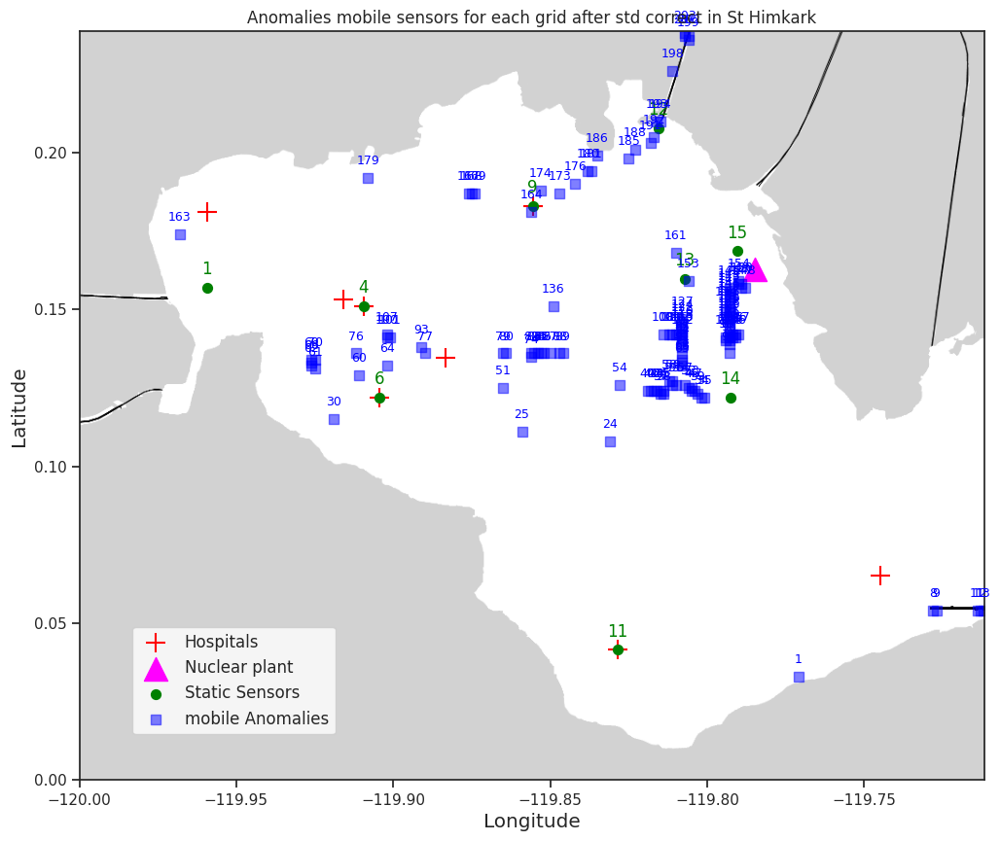

In [ ]:
# Load the image
map_image = Image.open('/content/drive/My Drive/data/StHimarkMapBlank.png')

# defin the lat and long of four corners
lat_min, lat_max = 0, 0.238585
lon_min, lon_max = -120.0, -119.711751

# Create a GeoDataFrame with the data points
# Label the Always Safe Nuclear plant in the map
nuclear_plant_loc = Point(-119.784825, 0.162679)

# label hospitals to overlay on the map
hospitals = [(0.180960, -119.959400),
            (0.153120, -119.915900),
            (0.151090, -119.909520),
            (0.121800, -119.904300),
            (0.134560, -119.883420),
            (0.182990, -119.855580),
            (0.041470, -119.828610),
            (0.065250, -119.744800)]

# Create a GeoDataFrame with the data points
gdf_hospitals = gpd.GeoDataFrame(geometry=[Point(lon, lat) for lat, lon in hospitals])
gdf_nuclear_plant = gpd.GeoDataFrame(geometry=[nuclear_plant_loc])
gdf_static_sensors = gpd.GeoDataFrame(staLocation, geometry='Location')

gdf_mobile_filtered_df_4_map = gpd.GeoDataFrame(filtered_df_4_map,geometry=gpd.points_from_xy(filtered_df_4_map['Long_grid'], filtered_df_4_map['Lat_grid']))

# Set the figure size (width, height) in inches
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the map image
img_extent = [lon_min, lon_max, lat_min, lat_max]
ax.imshow(map_image, extent=img_extent, aspect='auto')

# Plot the GeoDataFrame

# Plot the GeoDataFrame
gdf_hospitals.plot(ax=ax, color='red', marker='+', markersize=200, label='Hospitals')
gdf_nuclear_plant.plot(ax=ax, color = 'magenta', marker = '^', markersize=300, label='Nuclear plant')

gdf_static_sensors.plot(ax=ax, color='green', marker='o', markersize=50, label='Static Sensors')

# Annotate static sensors
for idx, row in gdf_static_sensors.iterrows():
    ax.annotate(row['Sensor-id'],
                (row['Location'].x, row['Location'].y),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center', fontsize=12,
                color='green')


gdf_mobile_filtered_df_4_map.plot(ax=ax, color='blue', marker='s', markersize=50, label='mobile Anomalies', alpha = 0.5)
# Annotate static sensors
for idx, row in gdf_mobile_filtered_df_4_map.iterrows():
    ax.annotate(row['grid_number'],
                (row['Long_grid'], row['Lat_grid']),
                textcoords="offset points",
                xytext=(0, 10),
                ha='center', fontsize=9,
                color='blue')


# Add labels or other annotations as needed
ax.set_title('Anomalies mobile sensors for each grid after std correct in St Himkark')
plt.xlabel('Longitude', fontsize='large')
plt.ylabel('Latitude', fontsize='large')
plt.legend(loc='lower left', fontsize='medium', bbox_to_anchor=(0.05, 0.05))

# Display the plot
plt.show()

In [ ]:
# grid 1 (only have data generated from sensor 20)
df_grid_1 = filtered_df_4[filtered_df_4['grid_number'] == 1]
print(df_grid_1['Sensor-id'].unique())
df_grid_1


[20]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
28078,0.033,-119.771,100.463832,76.785599,2020-04-06 16:31:20,20,0.03338,-119.770973,40.903000,100.463832,76.785599,1,-0.775677,-0.775677
28079,0.033,-119.771,100.463832,76.785599,2020-04-07 07:25:20,20,0.03345,-119.770942,50.411000,100.463832,76.785599,1,-0.651852,-0.651852
28080,0.033,-119.771,100.463832,76.785599,2020-04-07 07:25:25,20,0.03345,-119.770942,54.411000,100.463832,76.785599,1,-0.599759,-0.599759
28081,0.033,-119.771,100.463832,76.785599,2020-04-07 07:25:30,20,0.03345,-119.770942,58.412000,100.463832,76.785599,1,-0.547653,-0.547653
28082,0.033,-119.771,100.463832,76.785599,2020-04-07 07:25:35,20,0.03345,-119.770942,54.412000,100.463832,76.785599,1,-0.599746,-0.599746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46806,0.033,-119.771,100.463832,76.785599,2020-04-10 13:03:00,20,0.03335,-119.770900,193.795608,100.463832,76.785599,1,1.215485,1.215485
46807,0.033,-119.771,100.463832,76.785599,2020-04-10 13:03:25,20,0.03335,-119.770900,199.173272,100.463832,76.785599,1,1.285520,1.285520
46808,0.033,-119.771,100.463832,76.785599,2020-04-10 13:03:30,20,0.03335,-119.770900,188.332585,100.463832,76.785599,1,1.144339,1.144339
46809,0.033,-119.771,100.463832,76.785599,2020-04-10 13:03:35,20,0.03335,-119.770900,210.224898,100.463832,76.785599,1,1.429449,1.429449


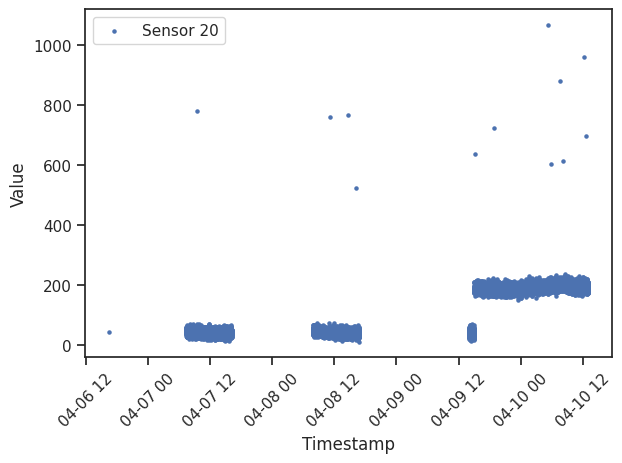

In [ ]:
df_grid_1.loc[:,'Timestamp'] = pd.to_datetime(df_grid_1['Timestamp'])
# Create scatter plot with smaller points
plt.scatter(df_grid_1['Timestamp'], df_grid_1['Value'], label='Sensor 20', marker='o', s=5)
plt.xlabel('Timestamp') # Use plt.xlabel to set x-axis label
plt.ylabel('Value')    # Use plt.ylabel to set y-axis label
plt.legend()
plt.tick_params(axis='x', rotation=45)


plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Store grid 1 in the place need to be attation, and have a contaminate car
grid_1_location = Point(-119.770900, 0.03335)

danger_location ={'Grid_number':[],
                  'Sensor':[],
                  'Location': [],
                  'Time start': [],
                  'Time end': [],
                  'Mean Value':[]}
danger_location['Grid_number'].append(1)
danger_location['Sensor'].append([20])
danger_location['Location'].append(grid_1_location)
danger_location['Time start'].append('2020-04-09 15:01:15')
danger_location['Time end'].append('2020-04-10 13:03:55')
danger_location['Mean Value'].append(200)
danger_location


{'Grid_number': [1],
 'Sensor': [[20]],
 'Location': [<POINT (-119.771 0.033)>],
 'Time start': ['2020-04-09 15:01:15'],
 'Time end': ['2020-04-10 13:03:55'],
 'Mean Value': [200]}

In [ ]:
df_grid_8_9 = filtered_df_4[(filtered_df_4['grid_number'] == 8) | (filtered_df_4['grid_number'] == 9)] # Use bitwise OR operator '|' to combine conditions
lst =df_grid_8_9['Sensor-id'].unique()
print(lst)
df_grid_8_9

[14 29 45 21 25 28 27 22 24]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
48695,0.054,-119.727,68.041089,50.781067,2020-04-08 21:24:35,14,0.054810,-119.726113,18.846090,15.686471,5.085000,9,0.621361,-0.968767
48696,0.054,-119.727,68.041089,50.781067,2020-04-08 21:24:40,14,0.054810,-119.726390,18.978919,15.686471,5.085000,9,0.647482,-0.966151
48697,0.054,-119.727,68.041089,50.781067,2020-04-08 21:24:45,14,0.054810,-119.726672,8.221706,15.686471,5.085000,9,-1.467997,-1.177986
48698,0.054,-119.727,68.041089,50.781067,2020-04-08 21:24:55,14,0.054810,-119.726981,16.699168,15.686471,5.085000,9,0.199154,-1.011045
48699,0.054,-119.727,68.041089,50.781067,2020-04-09 18:07:05,29,0.054810,-119.726103,22.931196,62.587456,54.162302,9,-0.732175,-0.888321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88537,0.054,-119.728,1409.845524,283.165503,2020-04-10 08:25:10,25,0.054810,-119.727690,25.596112,1359.128031,340.535192,8,-3.915989,-4.888482
88538,0.054,-119.728,1409.845524,283.165503,2020-04-10 08:25:15,25,0.054810,-119.727690,23.184558,1359.128031,340.535192,8,-3.923070,-4.896998
88539,0.054,-119.728,1409.845524,283.165503,2020-04-10 08:25:30,25,0.054804,-119.727717,28.099647,1359.128031,340.535192,8,-3.908637,-4.879641
88540,0.054,-119.728,1409.845524,283.165503,2020-04-10 08:25:35,25,0.054808,-119.727527,27.855478,1359.128031,340.535192,8,-3.909354,-4.880503


from matplotlib import pyplot as plt
df_grid_8_9['Long_grid'].plot(kind='hist', bins=20, title='Long_grid')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9['grid_mean'].plot(kind='hist', bins=20, title='grid_mean')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9['grid_std'].plot(kind='hist', bins=20, title='grid_std')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9['Sensor-id'].plot(kind='hist', bins=20, title='Sensor-id')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9.plot(kind='scatter', x='Long_grid', y='grid_mean', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9.plot(kind='scatter', x='grid_mean', y='grid_std', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9.plot(kind='scatter', x='grid_std', y='Sensor-id', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9.plot(kind='scatter', x='Sensor-id', y='Lat', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Timestamp']
  ys = series['Long_grid']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_grid_8_9.sort_values('Timestamp', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Timestamp')
_ = plt.ylabel('Long_grid')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Timestamp']
  ys = series['Sensor-id']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_grid_8_9.sort_values('Timestamp', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Timestamp')
_ = plt.ylabel('Sensor-id')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Timestamp']
  ys = series['Lat']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_grid_8_9.sort_values('Timestamp', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Timestamp')
_ = plt.ylabel('Lat')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Timestamp']
  ys = series['Long']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = df_grid_8_9.sort_values('Timestamp', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Timestamp')
_ = plt.ylabel('Long')

from matplotlib import pyplot as plt
df_grid_8_9['Long_grid'].plot(kind='line', figsize=(8, 4), title='Long_grid')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9['grid_mean'].plot(kind='line', figsize=(8, 4), title='grid_mean')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9['grid_std'].plot(kind='line', figsize=(8, 4), title='grid_std')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
df_grid_8_9['Sensor-id'].plot(kind='line', figsize=(8, 4), title='Sensor-id')
plt.gca().spines[['top', 'right']].set_visible(False)

Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


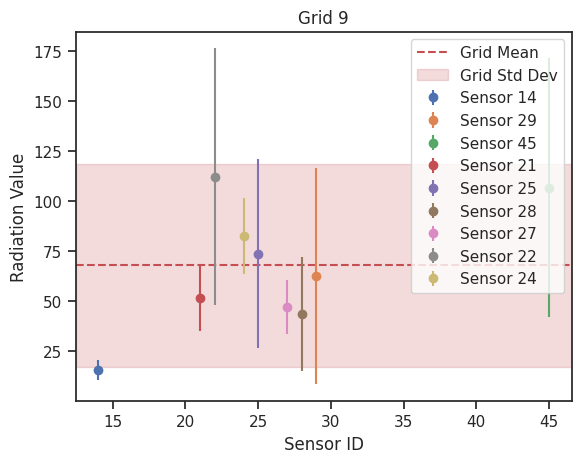

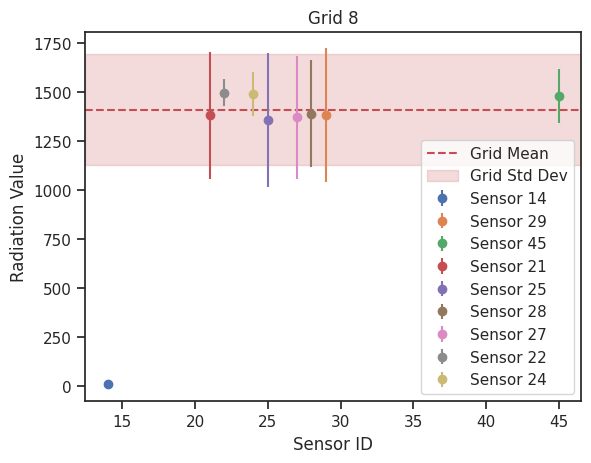

In [ ]:
# for df_grid_8_9, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID
df_grid_8_9.loc[:,'Timestamp'] = pd.to_datetime(df_grid_8_9['Timestamp'])
# Iterate over each unique grid
for grid_number in df_grid_8_9['grid_number'].unique():
  # Filter data for the current grid
  grid_data = df_grid_8_9[df_grid_8_9['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

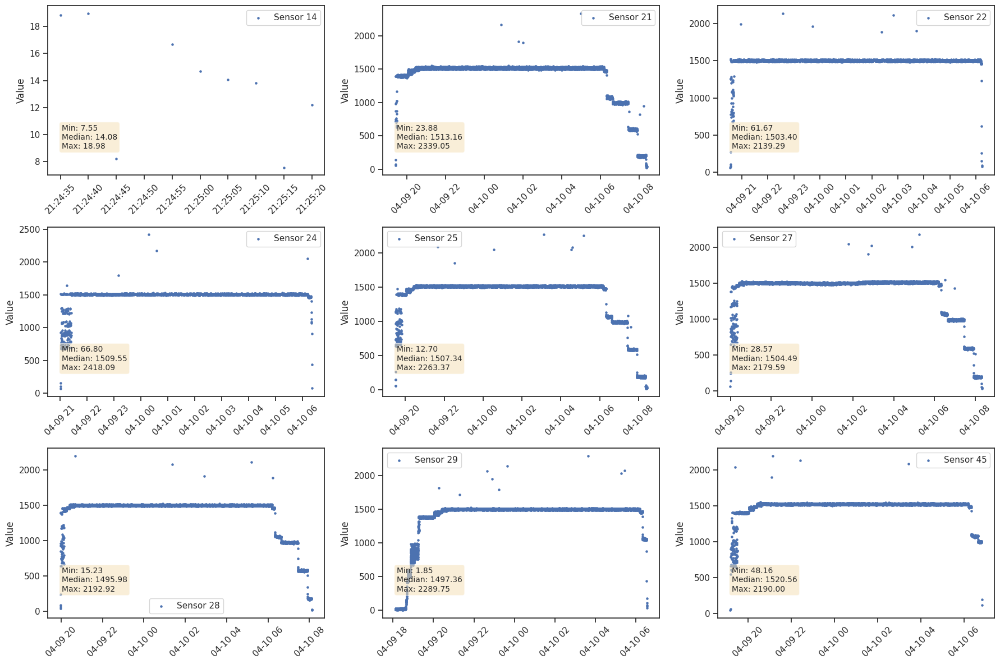

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_8_9['Sensor-id'].unique())

nrows = (len(sensor_ids) + 1) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_8_9[df_grid_8_9['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

On grid 8 and grid 9, there was a car contaminated parked in these areas from 4/9 evening to 4/10 morning, then left this area. And sensor 14 seems not work here.

In [ ]:
grid_8_location = Point(-119.727690, 0.054810)

danger_location['Grid_number'].append(8)
danger_location['Sensor'].append([21, 22, 24, 25, 27, 28, 29])
danger_location['Location'].append(grid_8_location)
danger_location['Time start'].append('2020-04-09 20:00:00')
danger_location['Time end'].append('2020-04-10 07:00:00')
danger_location['Mean Value'].append(1500)
danger_location

{'Grid_number': [1, 8],
 'Sensor': [[20], [21, 22, 24, 25, 27, 28, 29]],
 'Location': [<POINT (-119.771 0.033)>, <POINT (-119.728 0.055)>],
 'Time start': ['2020-04-09 15:01:15', '2020-04-09 20:00:00'],
 'Time end': ['2020-04-10 13:03:55', '2020-04-10 07:00:00'],
 'Mean Value': [200, 1500]}

In [ ]:
df_grid_11_12_13 = filtered_df_4[(filtered_df_4['grid_number'] == 11) | (filtered_df_4['grid_number'] == 12) | (filtered_df_4['grid_number'] == 13)] # Use bitwise OR operator '|' to combine conditions
lst =df_grid_11_12_13['Sensor-id'].unique()
print(lst)
df_grid_11_12_13

[14 30 21 22 45 24 27 28 25 29]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
46860,0.054,-119.713,135.923628,140.117419,2020-04-08 11:14:15,14,0.054943,-119.712084,15.315049,14.782784,0.752737,12,0.707107,-0.860768
46861,0.054,-119.713,135.923628,140.117419,2020-04-08 21:19:45,14,0.054819,-119.712177,14.250518,14.782784,0.752737,12,-0.707107,-0.868365
46862,0.054,-119.713,135.923628,140.117419,2020-04-09 06:57:30,30,0.054929,-119.712085,17.927903,178.299150,226.799192,12,-0.707107,-0.842120
46863,0.054,-119.713,135.923628,140.117419,2020-04-09 07:24:35,21,0.054230,-119.712750,42.281573,110.215778,73.614854,12,-0.922833,-0.668311
46864,0.054,-119.713,135.923628,140.117419,2020-04-09 07:24:40,21,0.054230,-119.712449,49.358677,110.215778,73.614854,12,-0.826696,-0.617803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242220,0.054,-119.714,42.750190,20.996394,2020-04-10 08:28:50,21,0.054810,-119.713314,65.409963,50.740149,21.114512,11,0.694774,1.079222
242221,0.054,-119.714,42.750190,20.996394,2020-04-10 08:28:55,21,0.054810,-119.713031,96.754323,50.740149,21.114512,11,2.179268,2.572067
242222,0.054,-119.714,42.750190,20.996394,2020-04-10 08:30:00,25,0.054810,-119.713906,39.923601,51.404738,15.590081,11,-0.736439,-0.134623
242223,0.054,-119.714,42.750190,20.996394,2020-04-10 08:30:05,25,0.054810,-119.713641,58.350020,51.404738,15.590081,11,0.445494,0.742977


In [ ]:
df_grid_11_12_13.loc[:,'Timestamp'] = pd.to_datetime(df_grid_11_12_13['Timestamp'])
df_grid_11_12_13.dtypes

,0
Lat_grid,float64
Long_grid,float64
grid_mean,float64
grid_std,float64
Timestamp,datetime64[ns]
Sensor-id,int64
Lat,float64
Long,float64
Value,float64
grid_sensor_mean,float64


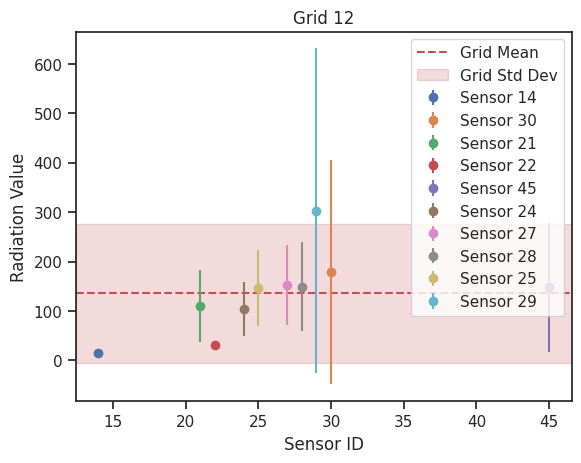

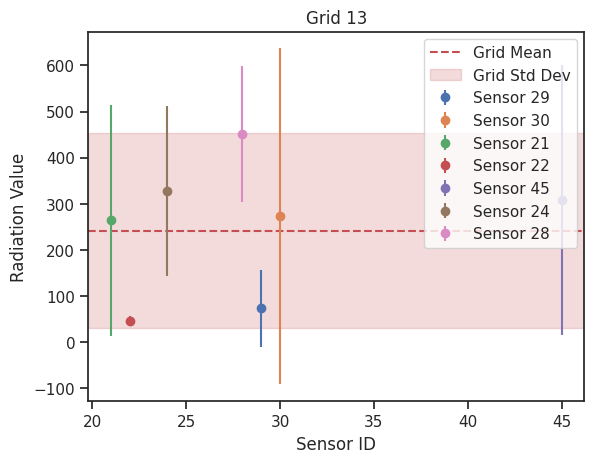

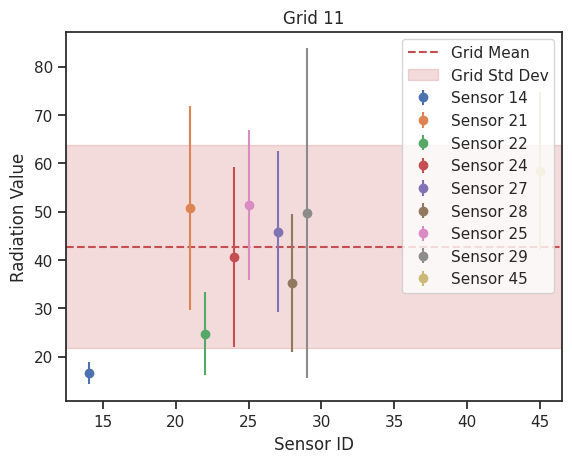

In [ ]:
# for df_grid_11_12_13, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID

# Iterate over each unique grid
for grid_number in df_grid_11_12_13['grid_number'].unique():
  # Filter data for the current grid
  grid_data = df_grid_11_12_13[df_grid_11_12_13['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

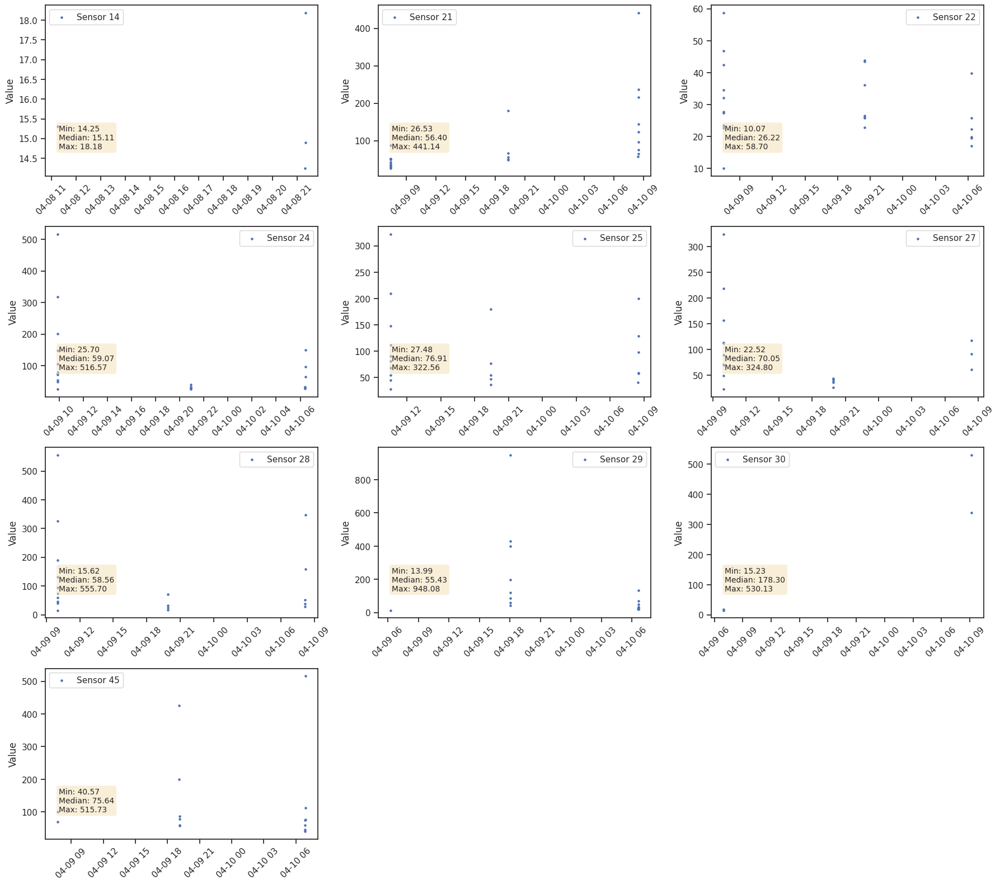

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_11_12_13['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_11_12_13[df_grid_11_12_13['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

It looks like the sensers was moving between 8/9 to 11/12/13 from 4/9 evening to 4/10 morning. The single detected in grid 11/12/13, should from the area from grid 8/9, as they are not so far away, and the value is much lower than 8/9. also the number of record  in 11/12/13 is quite low, seems like the driver was moving during that time. So grid 11/12/13 could considered as safe. And at the same, the static sensor 11 not far from this area also detected noise during this time.

In [ ]:
df_grid_163 = filtered_df_4[filtered_df_4['grid_number'] == 163]
df_grid_163.loc[:,'Timestamp'] = pd.to_datetime(df_grid_163['Timestamp'])
lst =df_grid_163['Sensor-id'].unique()
print(lst)
df_grid_163

[50  2 44]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
204770,0.174,-119.968,54.411739,21.176352,2020-04-06 07:15:15,50,0.174615,-119.967146,30.000000,33.000000,2.645751,163,-1.133893,-1.152783
204771,0.174,-119.968,54.411739,21.176352,2020-04-06 07:15:20,50,0.174409,-119.967199,34.000000,33.000000,2.645751,163,0.377964,-0.963893
204772,0.174,-119.968,54.411739,21.176352,2020-04-06 07:15:25,50,0.174119,-119.967221,35.000000,33.000000,2.645751,163,0.755929,-0.916671
204773,0.174,-119.968,54.411739,21.176352,2020-04-06 07:40:55,2,0.174054,-119.967255,26.935850,54.453077,21.182717,163,-1.299041,-1.297480
204774,0.174,-119.968,54.411739,21.176352,2020-04-06 07:41:00,2,0.174021,-119.967062,18.936200,54.453077,21.182717,163,-1.676691,-1.675243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207793,0.174,-119.968,54.411739,21.176352,2020-04-10 23:59:25,2,0.174064,-119.967096,61.751202,54.453077,21.182717,163,0.344532,0.346588
207794,0.174,-119.968,54.411739,21.176352,2020-04-10 23:59:30,2,0.174064,-119.967096,60.420702,54.453077,21.182717,163,0.281721,0.283758
207795,0.174,-119.968,54.411739,21.176352,2020-04-10 23:59:35,2,0.174064,-119.967096,51.406969,54.453077,21.182717,163,-0.143802,-0.141893
207796,0.174,-119.968,54.411739,21.176352,2020-04-10 23:59:40,2,0.174064,-119.967096,44.931039,54.453077,21.182717,163,-0.449519,-0.447702


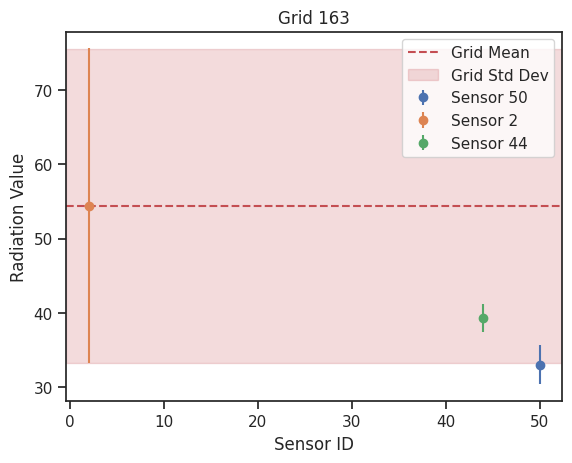

In [ ]:
# for df_grid_163, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID

# Iterate over each unique grid
for grid_number in df_grid_163['grid_number'].unique():
  # Filter data for the current grid
  grid_data = df_grid_163[df_grid_163['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

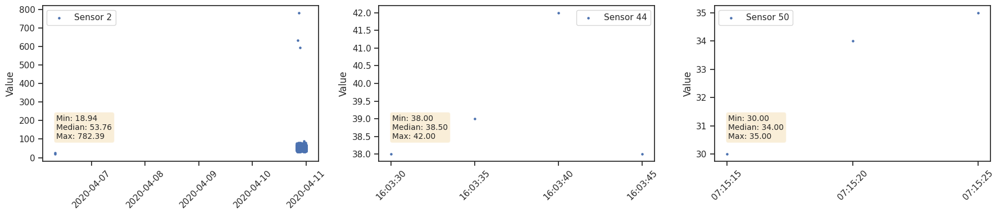

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_163['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_163[df_grid_163['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_163_s2= df_grid_163[df_grid_163['Sensor-id'] ==2].copy()
df_grid_163_s2.loc[:,'Timestamp'] = pd.to_datetime(df_grid_163_s2['Timestamp'])
df_grid_163_s2

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
204773,0.174,-119.968,54.411739,21.176352,2020-04-06 07:40:55,2,0.174054,-119.967255,26.935850,54.453077,21.182717,163,-1.299041,-1.297480
204774,0.174,-119.968,54.411739,21.176352,2020-04-06 07:41:00,2,0.174021,-119.967062,18.936200,54.453077,21.182717,163,-1.676691,-1.675243
204779,0.174,-119.968,54.411739,21.176352,2020-04-10 19:48:15,2,0.174064,-119.967096,64.333506,54.453077,21.182717,163,0.466438,0.468531
204780,0.174,-119.968,54.411739,21.176352,2020-04-10 19:48:20,2,0.174064,-119.967096,47.901345,54.453077,21.182717,163,-0.309296,-0.307437
204781,0.174,-119.968,54.411739,21.176352,2020-04-10 19:48:25,2,0.174064,-119.967096,65.564085,54.453077,21.182717,163,0.524532,0.526642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207793,0.174,-119.968,54.411739,21.176352,2020-04-10 23:59:25,2,0.174064,-119.967096,61.751202,54.453077,21.182717,163,0.344532,0.346588
207794,0.174,-119.968,54.411739,21.176352,2020-04-10 23:59:30,2,0.174064,-119.967096,60.420702,54.453077,21.182717,163,0.281721,0.283758
207795,0.174,-119.968,54.411739,21.176352,2020-04-10 23:59:35,2,0.174064,-119.967096,51.406969,54.453077,21.182717,163,-0.143802,-0.141893
207796,0.174,-119.968,54.411739,21.176352,2020-04-10 23:59:40,2,0.174064,-119.967096,44.931039,54.453077,21.182717,163,-0.449519,-0.447702


grid 163 is safe

In [ ]:
df_grid_179 = filtered_df_4[filtered_df_4['grid_number'] == 179]
df_grid_179 .loc[:,'Timestamp'] = pd.to_datetime(df_grid_179['Timestamp'])
lst =df_grid_179 ['Sensor-id'].unique()
print(lst)
df_grid_179

[3]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
92734,0.192,-119.908,19.471744,21.670734,2020-04-06 00:00:05,3,0.192560,-119.907780,21.000000,19.471744,21.670734,179,0.070522,0.070522
92735,0.192,-119.908,19.471744,21.670734,2020-04-06 00:00:10,3,0.192560,-119.907780,32.000000,19.471744,21.670734,179,0.578119,0.578119
92736,0.192,-119.908,19.471744,21.670734,2020-04-06 00:00:15,3,0.192560,-119.907780,27.000000,19.471744,21.670734,179,0.347393,0.347393
92737,0.192,-119.908,19.471744,21.670734,2020-04-06 00:00:20,3,0.192560,-119.907780,11.000000,19.471744,21.670734,179,-0.390930,-0.390930
92738,0.192,-119.908,19.471744,21.670734,2020-04-06 00:00:25,3,0.192560,-119.907780,27.000000,19.471744,21.670734,179,0.347393,0.347393
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154774,0.192,-119.908,19.471744,21.670734,2020-04-10 23:59:25,3,0.192507,-119.907918,12.311473,19.471744,21.670734,179,-0.330412,-0.330412
154775,0.192,-119.908,19.471744,21.670734,2020-04-10 23:59:30,3,0.192507,-119.907918,17.812177,19.471744,21.670734,179,-0.076581,-0.076581
154776,0.192,-119.908,19.471744,21.670734,2020-04-10 23:59:35,3,0.192507,-119.907918,12.478436,19.471744,21.670734,179,-0.322707,-0.322707
154777,0.192,-119.908,19.471744,21.670734,2020-04-10 23:59:40,3,0.192507,-119.907918,18.349231,19.471744,21.670734,179,-0.051799,-0.051799


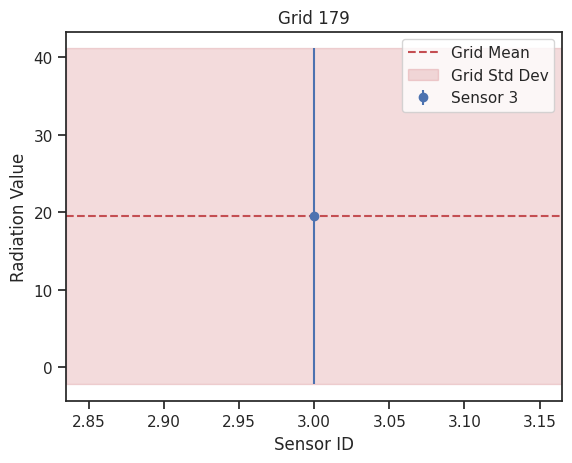

In [ ]:
# for df_grid_179, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID

# Iterate over each unique grid
for grid_number in df_grid_179['grid_number'].unique():
  # Filter data for the current grid
  grid_data = df_grid_179[df_grid_179['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

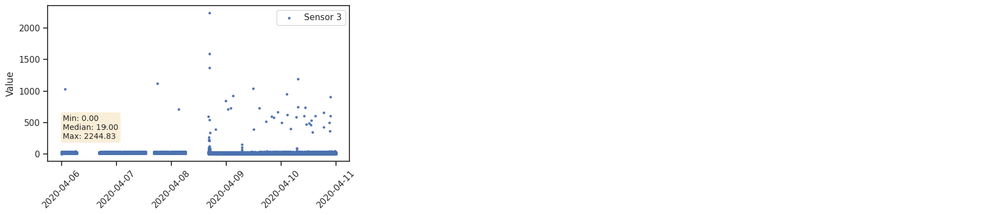

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_179['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_179[df_grid_179['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

Seems like Mobile sensor 3 most time localize in grid 179, the large variation of std, may caused by the nearby single. It safe in grid 179

In [ ]:
df_grid_30 = filtered_df_4[filtered_df_4['grid_number'] == 30]
df_grid_30 .loc[:,'Timestamp'] = pd.to_datetime(df_grid_30['Timestamp'])
lst =df_grid_30 ['Sensor-id'].unique()
print(lst)
df_grid_30

[18 15]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
187499,0.115,-119.919,44.475277,20.389093,2020-04-06 07:02:05,18,0.115472,-119.918092,32.103170,44.482135,20.386458,30,-0.607215,-0.606800
187500,0.115,-119.919,44.475277,20.389093,2020-04-06 07:02:10,18,0.115274,-119.918166,37.532455,44.482135,20.386458,30,-0.340897,-0.340516
187501,0.115,-119.919,44.475277,20.389093,2020-04-06 07:02:15,18,0.115170,-119.918415,34.983172,44.482135,20.386458,30,-0.465945,-0.465548
187502,0.115,-119.919,44.475277,20.389093,2020-04-06 07:02:20,18,0.115170,-119.918415,32.375078,44.482135,20.386458,30,-0.593877,-0.593464
187503,0.115,-119.919,44.475277,20.389093,2020-04-06 07:02:25,18,0.115170,-119.918415,43.166771,44.482135,20.386458,30,-0.064521,-0.064177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204689,0.115,-119.919,44.475277,20.389093,2020-04-10 16:30:05,18,0.115114,-119.918612,56.038875,44.482135,20.386458,30,0.566883,0.567146
204690,0.115,-119.919,44.475277,20.389093,2020-04-10 16:30:10,18,0.115293,-119.918552,41.343132,44.482135,20.386458,30,-0.153975,-0.153619
204691,0.115,-119.919,44.475277,20.389093,2020-04-10 16:30:15,18,0.115584,-119.918523,48.688280,44.482135,20.386458,30,0.206321,0.206630
204692,0.115,-119.919,44.475277,20.389093,2020-04-10 16:30:20,18,0.115663,-119.918333,43.754078,44.482135,20.386458,30,-0.035713,-0.035372


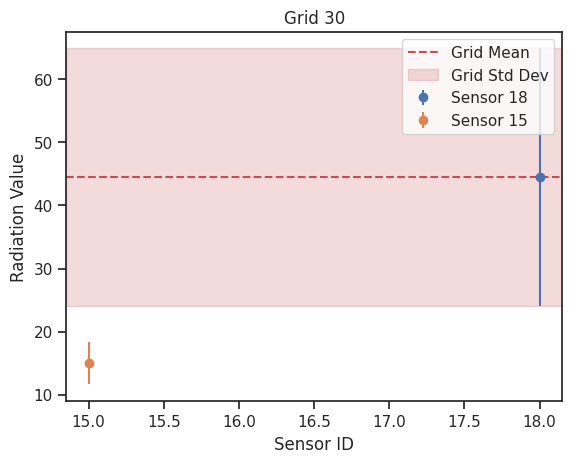

In [ ]:
# for df_grid_30, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID

# Iterate over each unique grid
for grid_number in df_grid_30['grid_number'].unique():
  # Filter data for the current grid
  grid_data = df_grid_30[df_grid_30['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

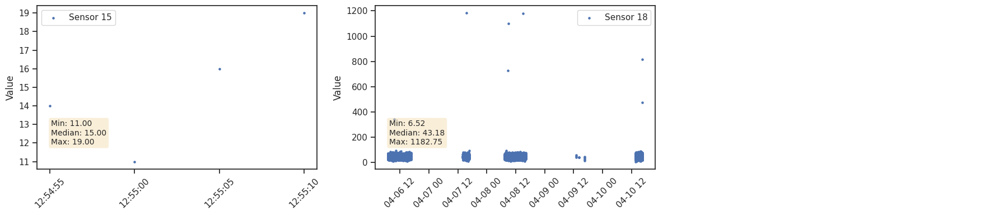

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_30['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_30[df_grid_30['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

grid_30 is safe.

In [ ]:
df_grid_60 = filtered_df_4[filtered_df_4['grid_number'] == 60]
df_grid_60 .loc[:,'Timestamp'] = pd.to_datetime(df_grid_60['Timestamp'])
lst =df_grid_60 ['Sensor-id'].unique()
print(lst)
df_grid_60

[41]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
240997,0.129,-119.911,38.955594,36.691989,2020-04-08 17:47:50,41,0.129202,-119.910378,38.167083,38.955594,36.691989,60,-0.021490,-0.021490
240998,0.129,-119.911,38.955594,36.691989,2020-04-08 17:47:55,41,0.129286,-119.910561,36.406850,38.955594,36.691989,60,-0.069463,-0.069463
240999,0.129,-119.911,38.955594,36.691989,2020-04-08 17:48:00,41,0.129530,-119.910645,35.030989,38.955594,36.691989,60,-0.106961,-0.106961
241000,0.129,-119.911,38.955594,36.691989,2020-04-08 17:48:05,41,0.129592,-119.910848,38.834093,38.955594,36.691989,60,-0.003311,-0.003311
241001,0.129,-119.911,38.955594,36.691989,2020-04-08 17:48:10,41,0.129592,-119.910848,41.892403,38.955594,36.691989,60,0.080040,0.080040
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242137,0.129,-119.911,38.955594,36.691989,2020-04-08 19:22:50,41,0.129592,-119.910848,34.061147,38.955594,36.691989,60,-0.133393,-0.133393
242138,0.129,-119.911,38.955594,36.691989,2020-04-08 19:22:55,41,0.129615,-119.910921,37.448758,38.955594,36.691989,60,-0.041067,-0.041067
242139,0.129,-119.911,38.955594,36.691989,2020-04-08 19:23:00,41,0.129624,-119.910769,40.265055,38.955594,36.691989,60,0.035688,0.035688
242140,0.129,-119.911,38.955594,36.691989,2020-04-08 19:23:05,41,0.129629,-119.910490,39.296429,38.955594,36.691989,60,0.009289,0.009289


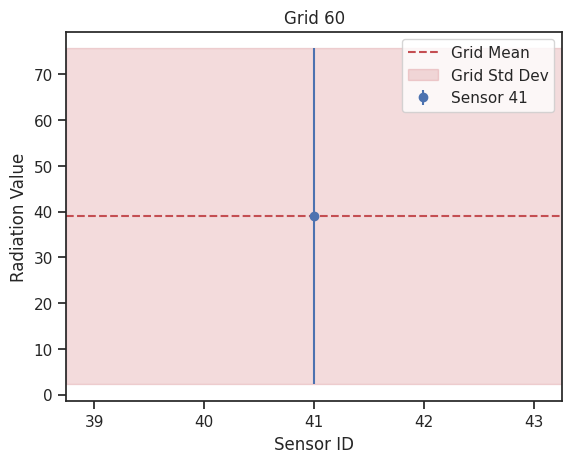

In [ ]:
# for df_grid_60, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID

# Iterate over each unique grid
for grid_number in df_grid_60['grid_number'].unique():
  # Filter data for the current grid
  grid_data = df_grid_60[df_grid_60['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

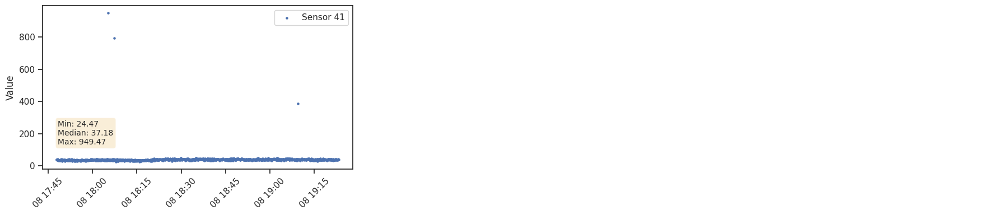

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_60['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_60[df_grid_60['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_64 = filtered_df_4[filtered_df_4['grid_number'] == 64]
df_grid_64 .loc[:,'Timestamp'] = pd.to_datetime(df_grid_64['Timestamp'])
lst =df_grid_64 ['Sensor-id'].unique()
print(lst)
df_grid_64

[16 25  9 27]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
207798,0.132,-119.902,27.535369,22.088266,2020-04-06 07:15:15,16,0.132111,-119.90111,18.000000,31.337843,28.258543,64,-0.471993,-0.431694
207799,0.132,-119.902,27.535369,22.088266,2020-04-06 07:15:20,16,0.132431,-119.90111,19.000000,31.337843,28.258543,64,-0.436606,-0.386421
207800,0.132,-119.902,27.535369,22.088266,2020-04-06 07:15:25,16,0.132714,-119.90111,18.000000,31.337843,28.258543,64,-0.471993,-0.431694
207801,0.132,-119.902,27.535369,22.088266,2020-04-07 07:21:25,16,0.132104,-119.90111,17.000000,31.337843,28.258543,64,-0.507381,-0.476967
207802,0.132,-119.902,27.535369,22.088266,2020-04-07 07:21:30,16,0.132423,-119.90111,13.000000,31.337843,28.258543,64,-0.648931,-0.658058
207803,0.132,-119.902,27.535369,22.088266,2020-04-07 07:21:35,16,0.132705,-119.90111,12.000000,31.337843,28.258543,64,-0.684318,-0.703331
207804,0.132,-119.902,27.535369,22.088266,2020-04-07 12:51:40,25,0.132136,-119.90111,30.000000,29.333333,1.154701,64,0.577350,0.111581
207805,0.132,-119.902,27.535369,22.088266,2020-04-07 12:51:45,25,0.132390,-119.90111,30.000000,29.333333,1.154701,64,0.577350,0.111581
207806,0.132,-119.902,27.535369,22.088266,2020-04-07 12:51:50,25,0.132698,-119.90111,28.000000,29.333333,1.154701,64,-1.154701,0.021035
207807,0.132,-119.902,27.535369,22.088266,2020-04-08 07:18:15,9,0.132924,-119.90111,10.000000,12.000000,1.632993,64,-1.224745,-0.793877


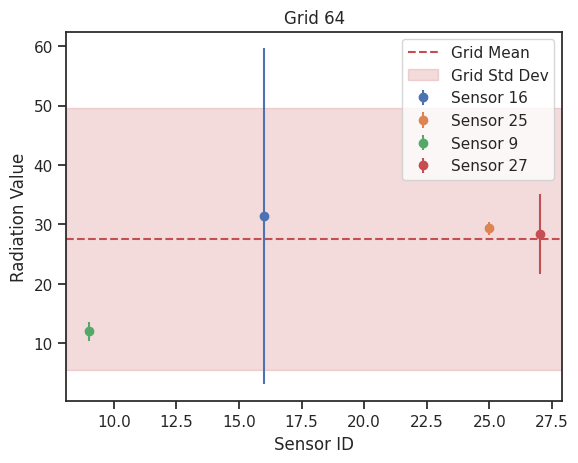

In [ ]:
# for df_grid_64, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID

# Iterate over each unique grid
for grid_number in df_grid_64['grid_number'].unique():
  # Filter data for the current grid
  grid_data = df_grid_64[df_grid_64['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

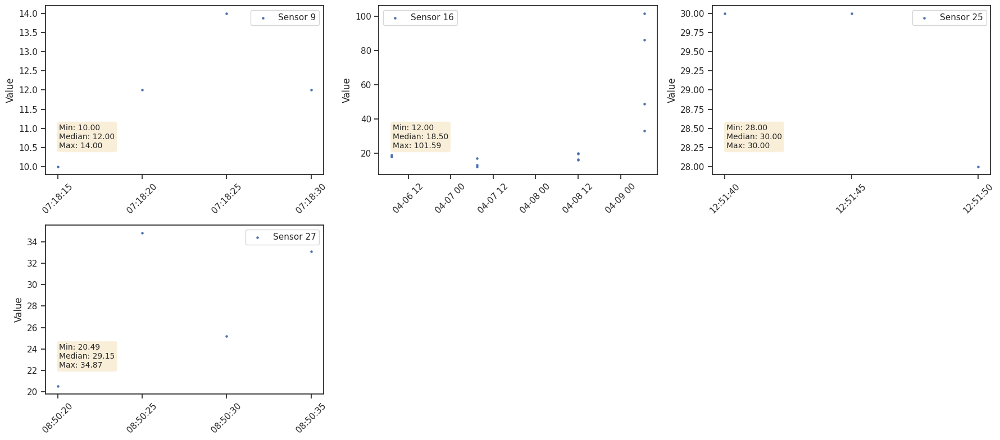

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_64['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_64[df_grid_64['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

Grid_60 and grid_64 are safe

In [ ]:
df_grid_76 = filtered_df_4[filtered_df_4['grid_number'] == 76]
df_grid_76 .loc[:,'Timestamp'] = pd.to_datetime(df_grid_76['Timestamp'])
lst =df_grid_76 ['Sensor-id'].unique()
print(lst)
df_grid_76

[ 7 18 27 13 31 10]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
222450,0.136,-119.912,13.297536,24.606937,2020-04-06 13:28:20,7,0.136972,-119.911550,17.000000,12.00000,4.082483,76,1.224745,0.150464
222451,0.136,-119.912,13.297536,24.606937,2020-04-06 13:28:25,7,0.136714,-119.911550,12.000000,12.00000,4.082483,76,0.000000,-0.052730
222452,0.136,-119.912,13.297536,24.606937,2020-04-06 13:28:30,7,0.136418,-119.911550,12.000000,12.00000,4.082483,76,0.000000,-0.052730
222453,0.136,-119.912,13.297536,24.606937,2020-04-06 13:28:35,7,0.136349,-119.911720,7.000000,12.00000,4.082483,76,-1.224745,-0.255925
222454,0.136,-119.912,13.297536,24.606937,2020-04-06 16:50:10,18,0.136171,-119.911550,31.414790,71.07684,175.826999,76,-0.225574,0.736266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227023,0.136,-119.912,13.297536,24.606937,2020-04-10 06:02:50,10,0.136026,-119.911203,7.317625,13.35266,23.452705,76,-0.257328,-0.243017
227024,0.136,-119.912,13.297536,24.606937,2020-04-10 06:02:55,10,0.136018,-119.911085,8.174869,13.35266,23.452705,76,-0.220776,-0.208180
227025,0.136,-119.912,13.297536,24.606937,2020-04-10 16:38:10,18,0.136209,-119.911550,18.486903,71.07684,175.826999,76,-0.299100,0.210890
227026,0.136,-119.912,13.297536,24.606937,2020-04-10 16:38:15,18,0.136504,-119.911550,705.926622,71.07684,175.826999,76,3.610650,28.147716


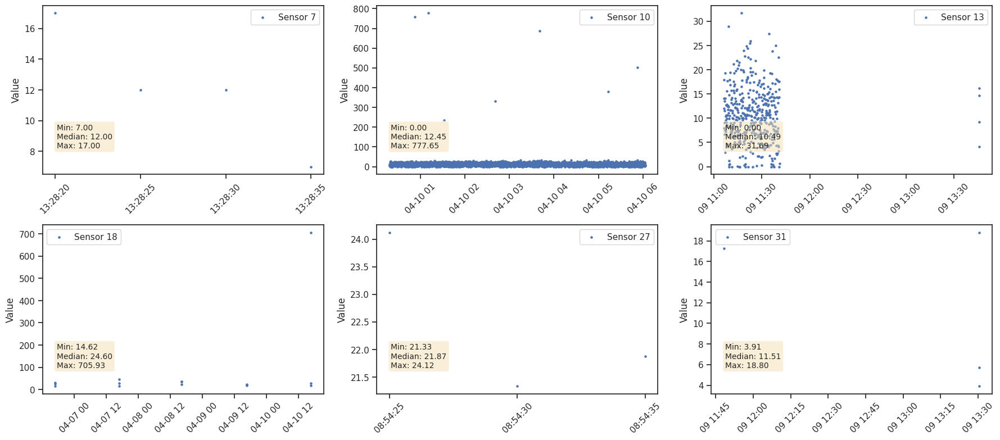

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_76['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_76[df_grid_76['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

Grid 76 is safe

In [ ]:
df_grid_77_93 = filtered_df_4[(filtered_df_4['grid_number'] == 77) | (filtered_df_4['grid_number'] == 93)]
df_grid_77_93 .loc[:,'Timestamp'] = pd.to_datetime(df_grid_77_93['Timestamp'])
lst =df_grid_77_93 ['Sensor-id'].unique()
print(lst)
df_grid_77_93

[19 36 20  5 27  9 23 39 13 31 44 11  6 17 46 15 40]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
185685,0.136,-119.890,34.573470,28.365248,2020-04-06 06:25:15,19,0.136010,-119.889945,6.000000,39.426411,37.309453,77,-0.895923,-1.007341
185686,0.136,-119.890,34.573470,28.365248,2020-04-06 06:25:20,19,0.136010,-119.889621,14.000000,39.426411,37.309453,77,-0.681501,-0.725305
185687,0.136,-119.890,34.573470,28.365248,2020-04-06 06:25:25,19,0.136010,-119.889340,12.000000,39.426411,37.309453,77,-0.735106,-0.795814
185688,0.136,-119.890,34.573470,28.365248,2020-04-06 06:25:30,19,0.136010,-119.889046,20.000000,39.426411,37.309453,77,-0.520683,-0.513779
185689,0.136,-119.890,34.573470,28.365248,2020-04-06 06:57:30,36,0.136010,-119.889077,44.000000,41.000000,3.490246,77,0.859538,0.332327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215518,0.138,-119.891,41.003403,21.844743,2020-04-10 11:42:50,40,0.138517,-119.890670,22.897085,31.721976,7.751768,93,-1.138436,-0.828864
215519,0.138,-119.891,41.003403,21.844743,2020-04-10 11:42:55,40,0.138770,-119.890670,37.430908,31.721976,7.751768,93,0.736468,-0.163540
215520,0.138,-119.891,41.003403,21.844743,2020-04-10 17:04:00,44,0.138189,-119.890090,43.900260,35.505353,7.271000,93,1.154574,0.132611
215521,0.138,-119.891,41.003403,21.844743,2020-04-10 17:04:05,44,0.138483,-119.890090,31.415591,35.505353,7.271000,93,-0.562476,-0.438907


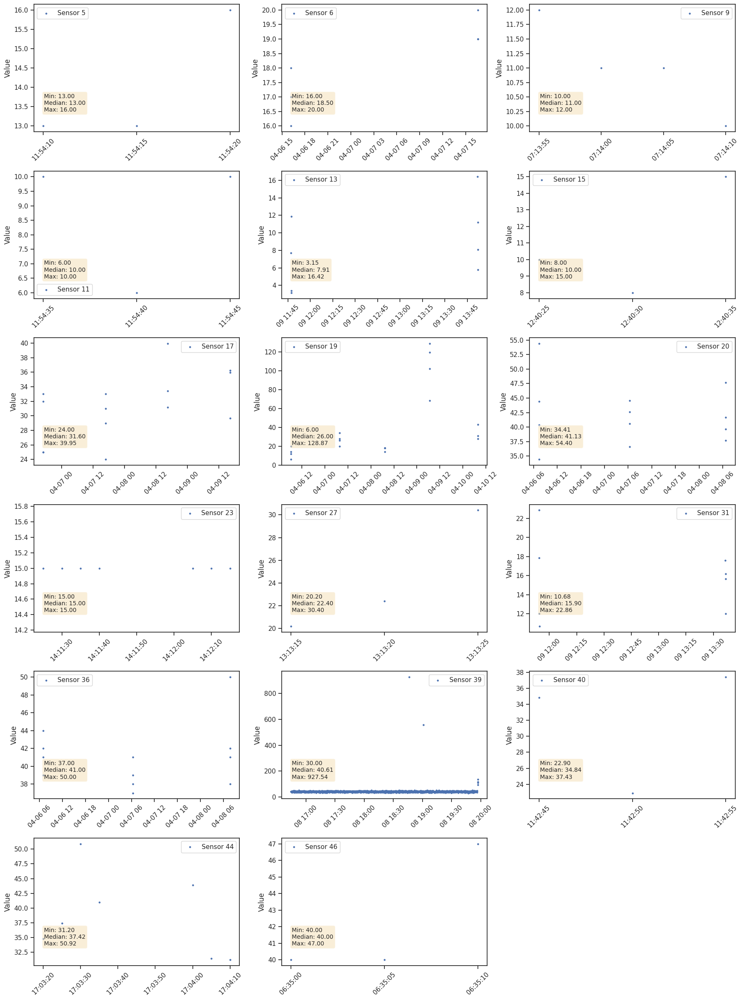

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_77_93['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_77_93[df_grid_77_93['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

grid 77 and 93 are safe

In [ ]:
grid_list = [61, 62, 66, 69,70]
df_grid_61_70 = filtered_df_4[filtered_df_4['grid_number'].isin(grid_list)]
df_grid_61_70.loc[:,'Timestamp'] = pd.to_datetime(df_grid_61_70['Timestamp'])
lst =df_grid_61_70['Sensor-id'].unique()
print(lst)
df_grid_61_70


[ 7  2 17]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
27661,0.133,-119.926,68.546401,63.867703,2020-04-06 14:03:00,7,0.133272,-119.92518,15.000000,14.000000,2.645751,66,0.377964,-0.838396
27662,0.133,-119.926,68.546401,63.867703,2020-04-06 14:03:05,7,0.133613,-119.92518,11.000000,14.000000,2.645751,66,-1.133893,-0.901025
27663,0.133,-119.926,68.546401,63.867703,2020-04-06 14:03:10,7,0.133835,-119.92518,16.000000,14.000000,2.645751,66,0.755929,-0.822738
27664,0.133,-119.926,68.546401,63.867703,2020-04-06 17:00:40,2,0.133038,-119.92547,27.286800,54.963550,45.017217,66,-0.614804,-0.646017
27665,0.133,-119.926,68.546401,63.867703,2020-04-06 17:00:45,2,0.133324,-119.92547,31.287150,54.963550,45.017217,66,-0.525941,-0.583382
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227193,0.134,-119.926,46.533200,35.978719,2020-04-09 21:14:20,2,0.134457,-119.92547,94.472069,48.443035,34.543382,69,1.332499,1.332423
227194,0.134,-119.926,46.533200,35.978719,2020-04-09 21:14:25,2,0.134751,-119.92547,82.892261,48.443035,34.543382,69,0.997274,1.010571
227195,0.134,-119.926,46.533200,35.978719,2020-04-10 05:11:10,17,0.134139,-119.92518,104.713465,78.003563,26.574975,69,1.005077,1.617074
227196,0.134,-119.926,46.533200,35.978719,2020-04-10 05:11:15,17,0.134460,-119.92518,77.731621,78.003563,26.574975,69,-0.010233,0.867135


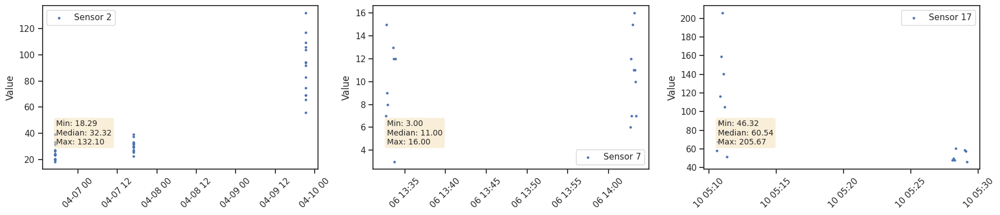

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_61_70['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_61_70[df_grid_61_70['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
grid_list = [100, 101, 107]
df_grid_100_107 = filtered_df_4[filtered_df_4['grid_number'].isin(grid_list)]
df_grid_100_107.loc[:,'Timestamp'] = pd.to_datetime(df_grid_100_107['Timestamp'])
lst =df_grid_100_107['Sensor-id'].unique()
print(lst)
df_grid_100_107

[19 20 46 27 16  5 44 13 31 10]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
185627,0.141,-119.901,33.440748,28.572908,2020-04-06 06:20:30,19,0.141897,-119.90053,22.000000,30.680748,34.503718,101,-0.251589,-0.400405
185628,0.141,-119.901,33.440748,28.572908,2020-04-06 06:20:35,19,0.141604,-119.90053,20.000000,30.680748,34.503718,101,-0.309554,-0.470402
185629,0.141,-119.901,33.440748,28.572908,2020-04-06 06:20:40,19,0.141338,-119.90053,20.000000,30.680748,34.503718,101,-0.309554,-0.470402
185630,0.141,-119.901,33.440748,28.572908,2020-04-06 06:20:45,19,0.141055,-119.90053,28.000000,30.680748,34.503718,101,-0.077694,-0.190416
185631,0.141,-119.901,33.440748,28.572908,2020-04-06 07:16:30,20,0.141929,-119.90053,40.399000,43.324583,6.511180,101,-0.449317,0.243526
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207881,0.142,-119.902,25.961200,21.876953,2020-04-09 13:40:55,13,0.142507,-119.90111,10.709728,8.921819,6.255841,107,0.285798,-0.697148
207882,0.142,-119.902,25.961200,21.876953,2020-04-09 13:41:00,13,0.142218,-119.90111,2.980973,8.921819,6.255841,107,-0.949648,-1.050431
207883,0.142,-119.902,25.961200,21.876953,2020-04-10 00:13:55,10,0.142796,-119.90111,35.804516,36.064391,6.870995,107,-0.037822,0.449940
207884,0.142,-119.902,25.961200,21.876953,2020-04-10 00:14:00,10,0.142486,-119.90111,29.327021,36.064391,6.870995,107,-0.980552,0.153852


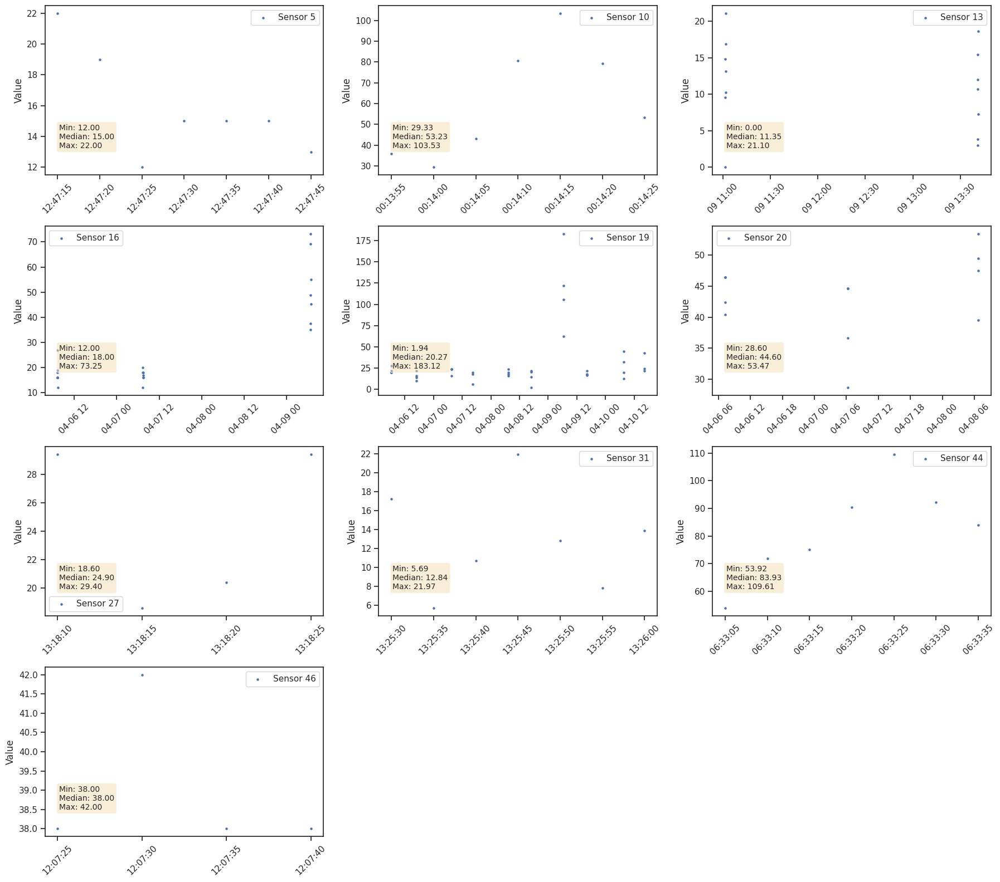

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_100_107['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_100_107[df_grid_100_107['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

grid 61, 62, 66, 69, 70, 100, 101, 107, 167, 169 are safe

In [ ]:
df_grid_24 = filtered_df_4[filtered_df_4['grid_number'] == 24]
df_grid_24.loc[:,'Timestamp'] = pd.to_datetime(df_grid_24['Timestamp'])
lst =df_grid_24['Sensor-id'].unique()
print(lst)
df_grid_24

[23 46]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
237814,0.108,-119.831,32.428553,20.06323,2020-04-07 13:13:25,23,0.108042,-119.83093,14.000000,14.000000,0.816497,24,0.000000,-0.918524
237815,0.108,-119.831,32.428553,20.06323,2020-04-07 13:13:30,23,0.108345,-119.83093,15.000000,14.000000,0.816497,24,1.224745,-0.868681
237816,0.108,-119.831,32.428553,20.06323,2020-04-07 13:13:35,23,0.108621,-119.83093,14.000000,14.000000,0.816497,24,0.000000,-0.918524
237817,0.108,-119.831,32.428553,20.06323,2020-04-07 13:13:40,23,0.108906,-119.83093,13.000000,14.000000,0.816497,24,-1.224745,-0.968366
237818,0.108,-119.831,32.428553,20.06323,2020-04-10 20:48:25,46,0.108852,-119.83093,56.926007,50.857106,5.739915,24,1.057315,1.221012
237819,0.108,-119.831,32.428553,20.06323,2020-04-10 20:48:30,46,0.108571,-119.83093,43.277140,50.857106,5.739915,24,-1.320571,0.540720
237820,0.108,-119.831,32.428553,20.06323,2020-04-10 20:48:35,46,0.108314,-119.83093,50.306734,50.857106,5.739915,24,-0.095885,0.891092
237821,0.108,-119.831,32.428553,20.06323,2020-04-10 20:48:40,46,0.108015,-119.83093,52.918545,50.857106,5.739915,24,0.359141,1.021271


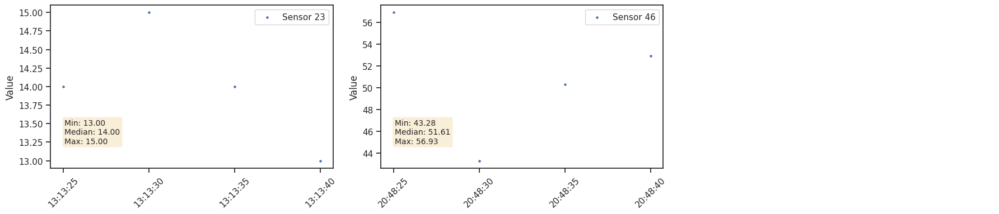

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_24['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_24[df_grid_24['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_25 = filtered_df_4[filtered_df_4['grid_number'] == 25]
df_grid_25.loc[:,'Timestamp'] = pd.to_datetime(df_grid_25['Timestamp'])
lst =df_grid_25['Sensor-id'].unique()
print(lst)
df_grid_25

[24 35 15 43 45]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
215551,0.111,-119.859,40.316105,27.101487,2020-04-06 12:06:15,24,0.111360,-119.858046,24.000000,24.500000,0.577350,25,-0.866025,-0.602037
215552,0.111,-119.859,40.316105,27.101487,2020-04-06 12:06:20,24,0.111360,-119.858412,24.000000,24.500000,0.577350,25,-0.866025,-0.602037
215553,0.111,-119.859,40.316105,27.101487,2020-04-06 12:06:25,24,0.111360,-119.858632,25.000000,24.500000,0.577350,25,0.866025,-0.565139
215554,0.111,-119.859,40.316105,27.101487,2020-04-06 12:06:30,24,0.111360,-119.858936,25.000000,24.500000,0.577350,25,0.866025,-0.565139
215555,0.111,-119.859,40.316105,27.101487,2020-04-06 16:33:35,35,0.111940,-119.858911,34.000000,31.600000,1.776388,25,1.351056,-0.233054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219401,0.111,-119.859,40.316105,27.101487,2020-04-08 16:36:10,35,0.111940,-119.858298,32.000000,31.600000,1.776388,25,0.225176,-0.306851
219402,0.111,-119.859,40.316105,27.101487,2020-04-08 16:36:15,35,0.111940,-119.858041,32.000000,31.600000,1.776388,25,0.225176,-0.306851
219403,0.111,-119.859,40.316105,27.101487,2020-04-08 16:43:25,15,0.111604,-119.858903,18.666277,16.990162,4.107664,25,0.408046,-0.798843
219404,0.111,-119.859,40.316105,27.101487,2020-04-08 16:43:30,15,0.111843,-119.858808,12.760567,16.990162,4.107664,25,-1.029684,-1.016754


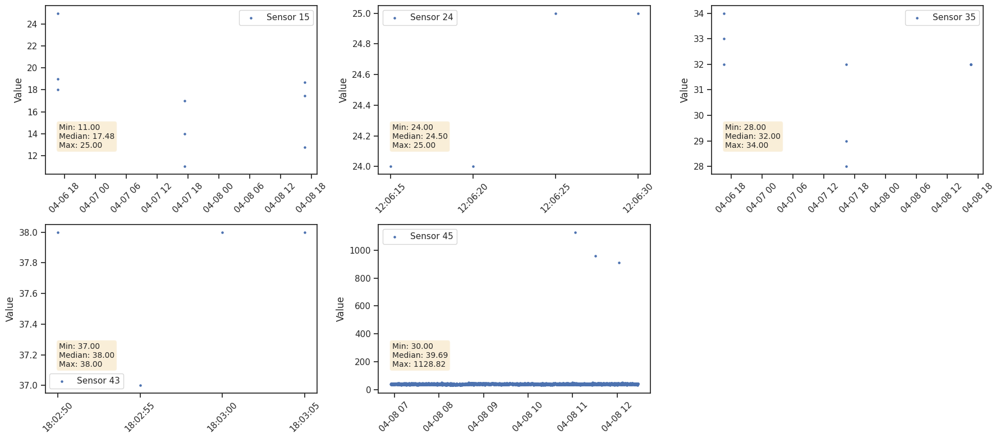

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_25['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_25[df_grid_25['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_51= filtered_df_4[filtered_df_4['grid_number'] == 51]
df_grid_51.loc[:,'Timestamp'] = pd.to_datetime(df_grid_51['Timestamp'])
lst =df_grid_51['Sensor-id'].unique()
print(lst)
df_grid_51

[39 20 33 24 19 43  9 44]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
204694,0.125,-119.865,41.770713,58.879506,2020-04-06 07:07:05,39,0.12586,-119.864984,39.000000,48.202281,19.516562,51,-0.471511,-0.047057
204695,0.125,-119.865,41.770713,58.879506,2020-04-06 07:07:10,39,0.12586,-119.864688,45.000000,48.202281,19.516562,51,-0.164080,0.054846
204696,0.125,-119.865,41.770713,58.879506,2020-04-06 07:07:15,39,0.12586,-119.864406,44.000000,48.202281,19.516562,51,-0.215319,0.037862
204697,0.125,-119.865,41.770713,58.879506,2020-04-06 07:07:20,39,0.12586,-119.864094,42.000000,48.202281,19.516562,51,-0.317796,0.003894
204698,0.125,-119.865,41.770713,58.879506,2020-04-06 07:31:20,20,0.12586,-119.864973,40.304000,43.750250,7.307993,51,-0.471573,-0.024910
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204765,0.125,-119.865,41.770713,58.879506,2020-04-10 09:33:35,44,0.12586,-119.864411,43.290917,45.223654,7.410036,51,-0.260827,0.025819
204766,0.125,-119.865,41.770713,58.879506,2020-04-10 09:33:40,44,0.12586,-119.864081,48.244959,45.223654,7.410036,51,0.407731,0.109958
204767,0.125,-119.865,41.770713,58.879506,2020-04-10 16:06:25,19,0.12557,-119.864190,26.141857,57.170111,130.742120,51,-0.237324,-0.265438
204768,0.125,-119.865,41.770713,58.879506,2020-04-10 16:06:30,19,0.12557,-119.864431,528.442603,57.170111,130.742120,51,3.604596,8.265557


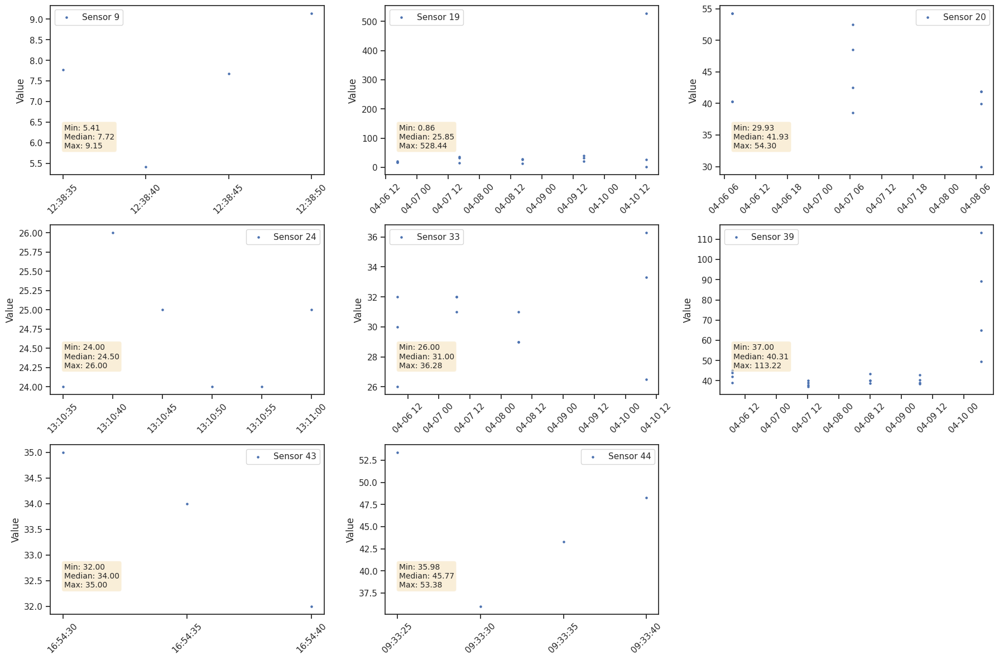

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_51['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_51[df_grid_51['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_54 = filtered_df_4[filtered_df_4['grid_number'] == 54]
df_grid_54.loc[:,'Timestamp'] = pd.to_datetime(df_grid_54['Timestamp'])
lst =df_grid_54['Sensor-id'].unique()
print(lst)
df_grid_54

[37 21 34 13 39 32 23 15 42 44 14]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
207956,0.126,-119.828,29.234882,33.5696,2020-04-06 07:52:45,37,0.126803,-119.827453,37.000000,47.517575,10.962103,54,-0.959449,0.231314
207957,0.126,-119.828,29.234882,33.5696,2020-04-06 07:52:50,37,0.126504,-119.827451,40.000000,47.517575,10.962103,54,-0.685779,0.320681
207958,0.126,-119.828,29.234882,33.5696,2020-04-06 07:52:55,37,0.126223,-119.827450,39.000000,47.517575,10.962103,54,-0.777002,0.290892
207959,0.126,-119.828,29.234882,33.5696,2020-04-06 17:04:20,21,0.126871,-119.827469,50.000000,33.967747,7.980624,54,2.008897,0.618569
207960,0.126,-119.828,29.234882,33.5696,2020-04-06 17:04:25,21,0.126552,-119.827455,28.000000,33.967747,7.980624,54,-0.747780,-0.036786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208773,0.126,-119.828,29.234882,33.5696,2020-04-10 12:30:55,42,0.126553,-119.827450,51.223800,48.134998,2.795700,54,1.104840,0.655025
208774,0.126,-119.828,29.234882,33.5696,2020-04-10 12:31:00,42,0.126273,-119.827450,46.575923,48.134998,2.795700,54,-0.557669,0.516570
208775,0.126,-119.828,29.234882,33.5696,2020-04-10 21:30:15,14,0.126874,-119.827450,28.473313,33.084513,6.060473,54,-0.760865,-0.022686
208776,0.126,-119.828,29.234882,33.5696,2020-04-10 21:30:20,14,0.126557,-119.827450,39.948837,33.084513,6.060473,54,1.132638,0.319156


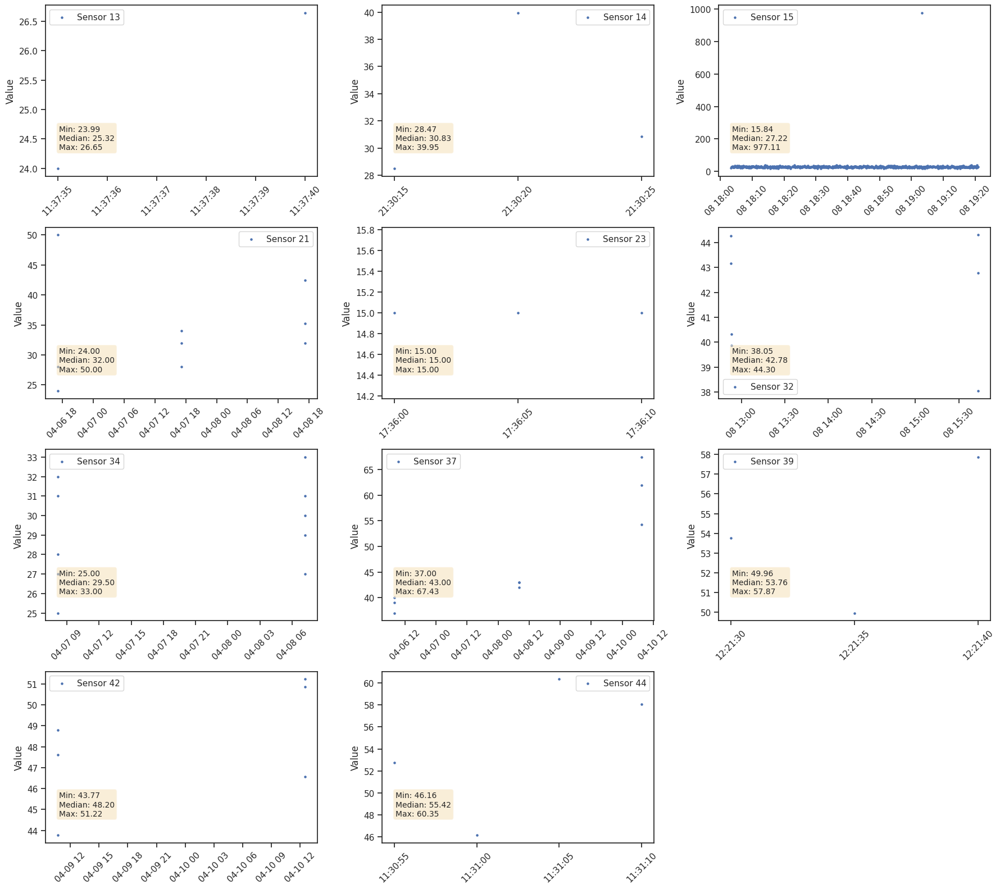

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_54['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_54[df_grid_54['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_136 = filtered_df_4[filtered_df_4['grid_number'] == 136]
df_grid_136.loc[:,'Timestamp'] = pd.to_datetime(df_grid_136['Timestamp'])
lst =df_grid_136['Sensor-id'].unique()
print(lst)
df_grid_136

[37 21 10 23 46 15  9 36 13]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
207886,0.151,-119.849,28.926196,23.042069,2020-04-06 07:39:35,37,0.151186,-119.848947,48.000000,42.166667,4.355074,136,1.339434,0.827782
207887,0.151,-119.849,28.926196,23.042069,2020-04-06 07:59:10,21,0.151659,-119.848187,36.000000,33.483799,7.019393,136,0.358464,0.306995
207888,0.151,-119.849,28.926196,23.042069,2020-04-06 07:59:15,21,0.151865,-119.848285,38.000000,33.483799,7.019393,136,0.643389,0.393793
207889,0.151,-119.849,28.926196,23.042069,2020-04-06 07:59:20,21,0.151927,-119.848503,26.000000,33.483799,7.019393,136,-1.066160,-0.126994
207890,0.151,-119.849,28.926196,23.042069,2020-04-06 07:59:25,21,0.151951,-119.848793,28.000000,33.483799,7.019393,136,-0.781235,-0.040196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207951,0.151,-119.849,28.926196,23.042069,2020-04-10 20:29:20,46,0.151490,-119.848664,60.016799,61.916228,38.417919,136,-0.049441,1.349297
207952,0.151,-119.849,28.926196,23.042069,2020-04-10 20:29:25,46,0.151421,-119.848454,82.111368,61.916228,38.417919,136,0.525670,2.308177
207953,0.151,-119.849,28.926196,23.042069,2020-04-10 20:29:30,46,0.151222,-119.848379,72.681218,61.916228,38.417919,136,0.280208,1.898919
207954,0.151,-119.849,28.926196,23.042069,2020-04-10 20:29:35,46,0.151142,-119.848173,161.034183,61.916228,38.417919,136,2.579993,5.733339


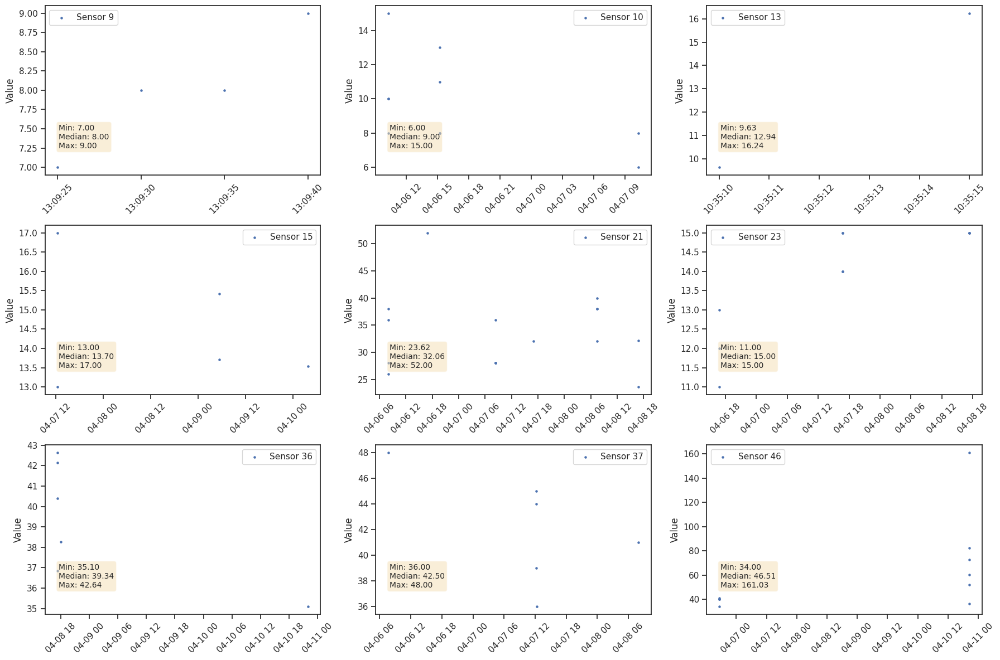

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_136['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_136[df_grid_136['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_161 = filtered_df_4[filtered_df_4['grid_number'] == 161]
df_grid_161.loc[:,'Timestamp'] = pd.to_datetime(df_grid_161['Timestamp'])
lst =df_grid_161['Sensor-id'].unique()
print(lst)
df_grid_161

[46 44 13 36 31]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
227198,0.168,-119.81,14.775037,20.218246,2020-04-06 14:09:25,46,0.168914,-119.809180,40.000000,41.000000,2.708013,161,-0.369274,1.247634
227199,0.168,-119.81,14.775037,20.218246,2020-04-06 14:09:30,46,0.168630,-119.809180,40.000000,41.000000,2.708013,161,-0.369274,1.247634
227200,0.168,-119.81,14.775037,20.218246,2020-04-06 14:09:35,46,0.168320,-119.809180,45.000000,41.000000,2.708013,161,1.477098,1.494935
227201,0.168,-119.81,14.775037,20.218246,2020-04-06 14:09:40,46,0.168044,-119.809180,39.000000,41.000000,2.708013,161,-0.738549,1.198173
227202,0.168,-119.81,14.775037,20.218246,2020-04-08 11:31:40,44,0.168082,-119.809180,38.472203,39.520149,2.740026,161,-0.382458,1.172068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237582,0.168,-119.81,14.775037,20.218246,2020-04-10 20:56:30,13,0.168440,-119.809925,9.145986,14.738310,20.218618,161,-0.276593,-0.278414
237583,0.168,-119.81,14.775037,20.218246,2020-04-10 20:56:35,13,0.168440,-119.809925,17.543611,14.738310,20.218618,161,0.138748,0.136934
237584,0.168,-119.81,14.775037,20.218246,2020-04-10 20:56:40,13,0.168440,-119.809925,34.443360,14.738310,20.218618,161,0.974599,0.972801
237585,0.168,-119.81,14.775037,20.218246,2020-04-10 20:56:45,13,0.168440,-119.809925,12.753681,14.738310,20.218618,161,-0.098158,-0.099977


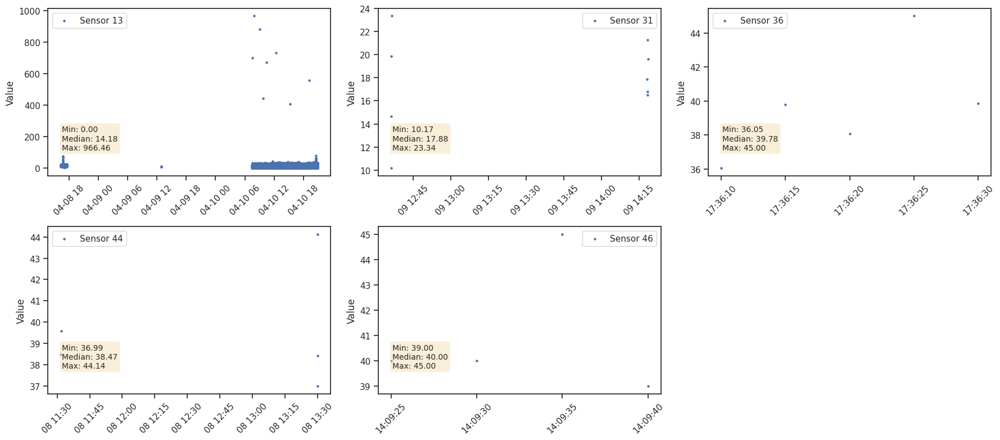

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_161['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_161[df_grid_161['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_153 = filtered_df_4[filtered_df_4['grid_number'] == 153]
df_grid_153.loc[:,'Timestamp'] = pd.to_datetime(df_grid_153['Timestamp'])
lst =df_grid_153['Sensor-id'].unique()
print(lst)
df_grid_153

[ 9 44 13]


,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
237822,0.159,-119.806,41.73412,25.699551,2020-04-07 13:25:15,9,0.159500,-119.805779,10.000000,11.000000,1.000000,153,-1.000000,-1.234812
237823,0.159,-119.806,41.73412,25.699551,2020-04-07 13:25:20,9,0.159500,-119.805552,12.000000,11.000000,1.000000,153,1.000000,-1.156990
237824,0.159,-119.806,41.73412,25.699551,2020-04-07 13:25:25,9,0.159500,-119.805232,11.000000,11.000000,1.000000,153,0.000000,-1.195901
237825,0.159,-119.806,41.73412,25.699551,2020-04-08 06:42:40,44,0.159546,-119.805822,41.000000,41.832432,25.680314,153,-0.032415,-0.028565
237826,0.159,-119.806,41.73412,25.699551,2020-04-08 06:42:45,44,0.159546,-119.805822,41.000000,41.832432,25.680314,153,-0.032415,-0.028565
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
240623,0.159,-119.806,41.73412,25.699551,2020-04-09 12:27:25,13,0.159500,-119.805527,24.317340,11.271243,7.443049,153,1.752789,-0.677708
240624,0.159,-119.806,41.73412,25.699551,2020-04-09 12:27:30,13,0.159500,-119.805245,11.177050,11.271243,7.443049,153,-0.012655,-1.189012
240625,0.159,-119.806,41.73412,25.699551,2020-04-09 14:32:10,13,0.159500,-119.805825,2.246394,11.271243,7.443049,153,-1.212521,-1.536514
240626,0.159,-119.806,41.73412,25.699551,2020-04-09 14:32:15,13,0.159500,-119.805549,7.438901,11.271243,7.443049,153,-0.514889,-1.334468


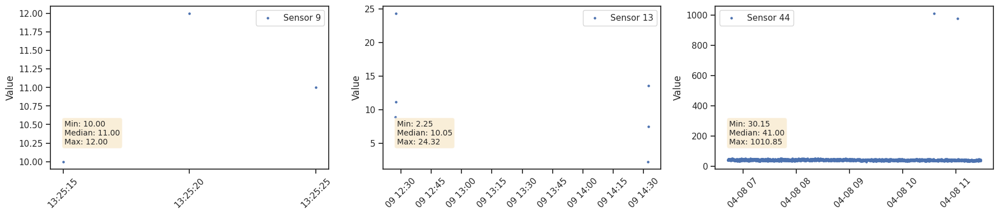

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_153['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_153[df_grid_153['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_79_80 = filtered_df_4[filtered_df_4['grid_number'].isin([79,80])]
df_grid_79_80.loc[:,'Timestamp'] = pd.to_datetime(df_grid_79_80['Timestamp'])
lst =df_grid_79_80['Sensor-id'].unique()
print(lst)

[19  6 15 39 36 10 13 31  4]


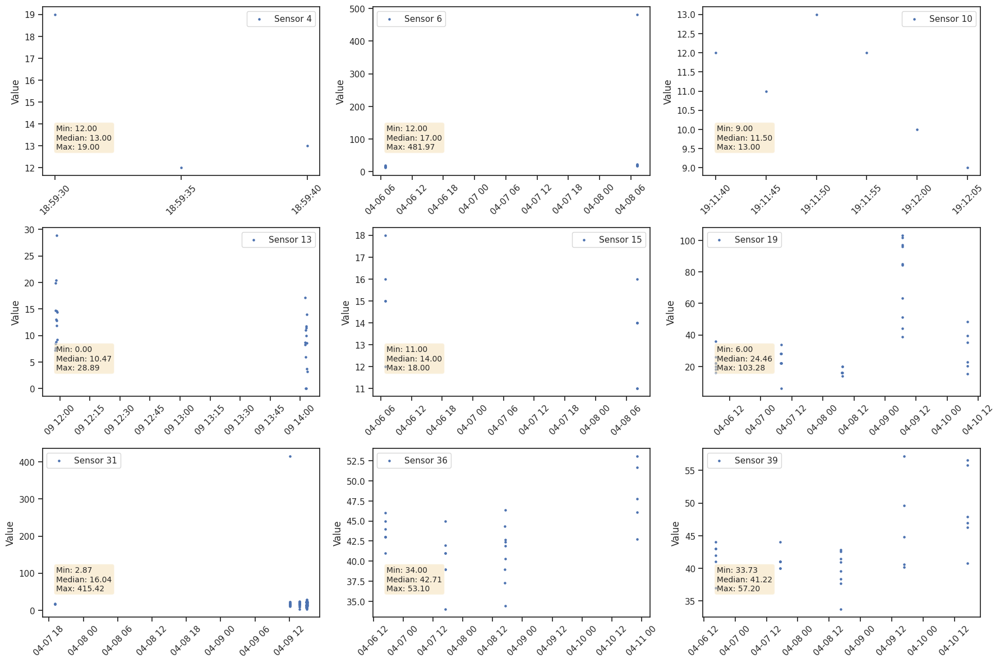

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_79_80['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_79_80[df_grid_79_80['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
df_grid_167 = filtered_df_4[filtered_df_4['grid_number'].isin([167, 168, 169])]
df_grid_167.loc[:,'Timestamp'] = pd.to_datetime(df_grid_167['Timestamp'])
lst =df_grid_167['Sensor-id'].unique()
print(lst)

[ 5 10 47 11  9]


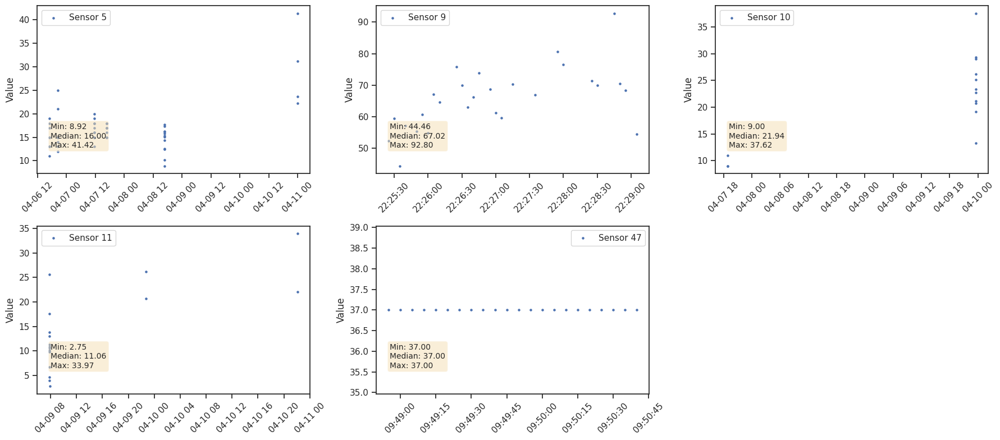

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_167['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_167[df_grid_167['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
selected_df = filtered_df_4[(filtered_df_4['Lat_grid'] > 0.12) & (filtered_df_4['Lat_grid'] < 0.15) & (filtered_df_4['Long_grid'] > -119.87) & (filtered_df_4['Long_grid'] < -119.82)]
print(selected_df['grid_number'].unique())

[79 80 74 89 88 87 86 85 84 83 82 51 54]


In [ ]:
grid_list = [74, 89, 88, 87, 86, 85, 84, 83, 82]
df_grid_74_89 = filtered_df_4[filtered_df_4['grid_number'].isin(grid_list)]
df_grid_74_89.loc[:,'Timestamp'] = pd.to_datetime(df_grid_74_89['Timestamp'])
lst =df_grid_74_89['Sensor-id'].unique()
print(lst)


[19 44 43 23 34 37  6 32 22 15 42 10 21 13 31 39 33]


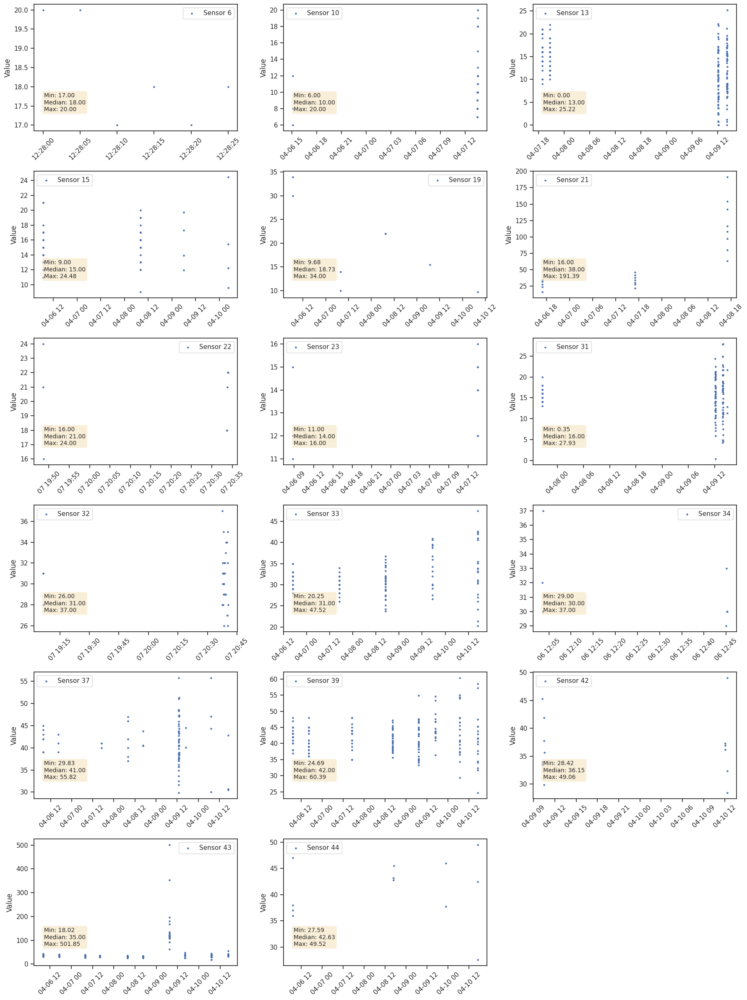

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_74_89['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_74_89[df_grid_74_89['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
selected_df = filtered_df_4[(filtered_df_4['Lat_grid'] > 0.10) & (filtered_df_4['Lat_grid'] < 0.17) & (filtered_df_4['Long_grid'] > -119.825) & (filtered_df_4['Long_grid'] < -119.76)]
grid_list = sorted(selected_df['grid_number'].unique())
print(grid_list)

[34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 52, 53, 55, 56, 57, 58, 59, 65, 68, 71, 91, 92, 94, 95, 96, 97, 98, 99, 102, 103, 104, 105, 106, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 124, 125, 127, 128, 129, 131, 134, 135, 137, 139, 141, 142, 143, 145, 146, 147, 148, 149, 150, 153, 154, 161]


In [ ]:
df_grid_34_161 = filtered_df_4[filtered_df_4['grid_number'].isin(grid_list)]
df_grid_34_161.loc[:,'Timestamp'] = pd.to_datetime(df_grid_34_161['Timestamp'])
lst =df_grid_34_161['Sensor-id'].unique()
print(lst)

[ 9 22 32 13 39 44 45 14 46 36 31]


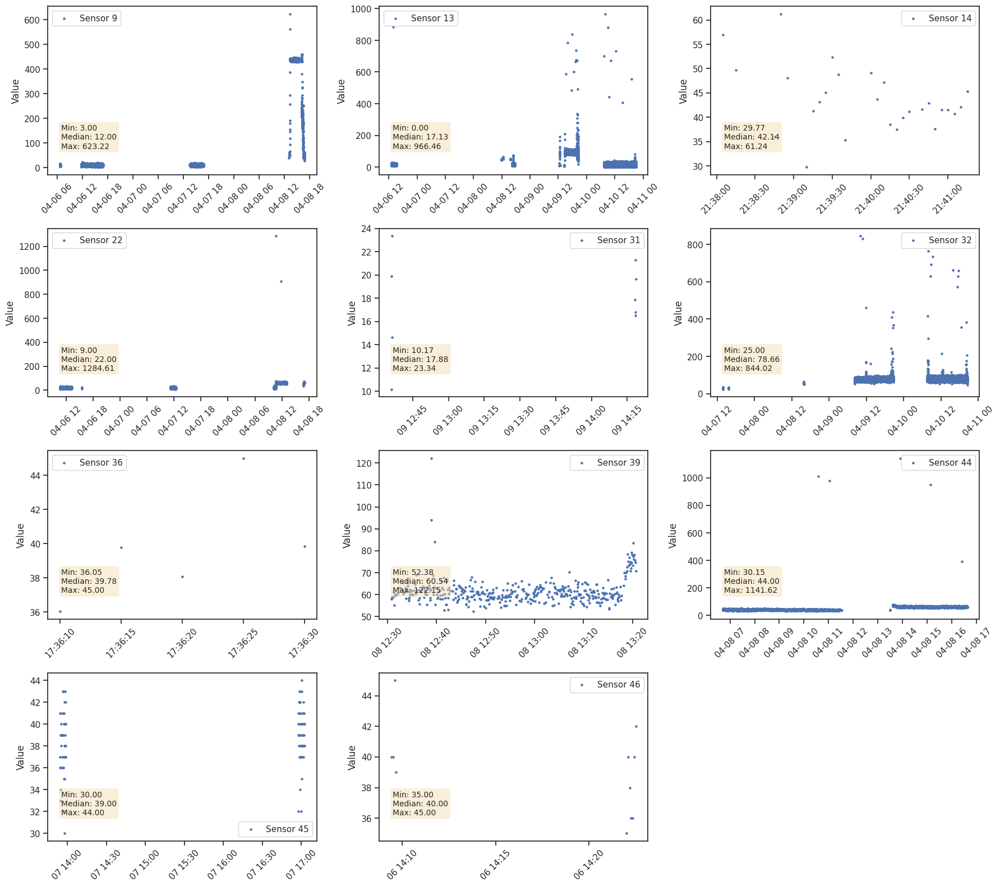

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_34_161['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_34_161[df_grid_34_161['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

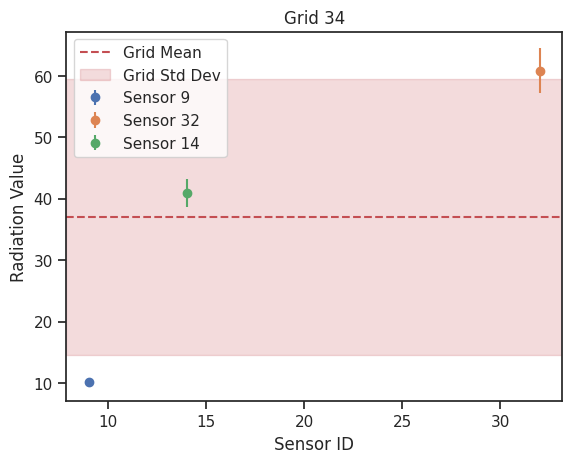

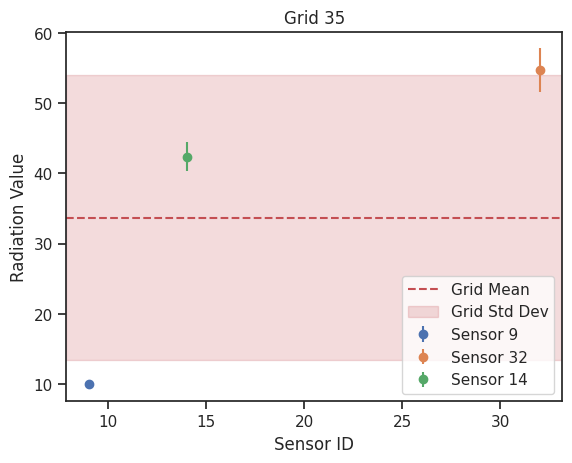

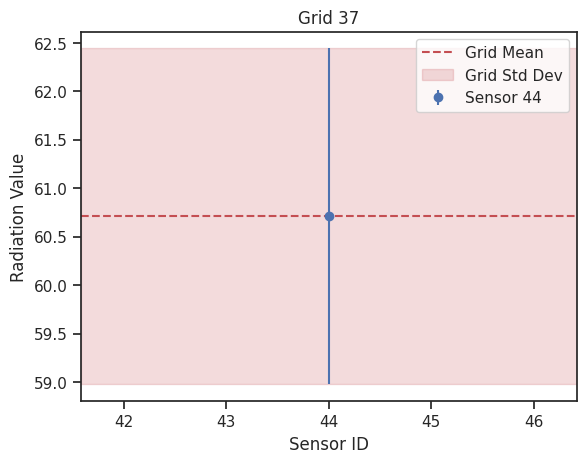

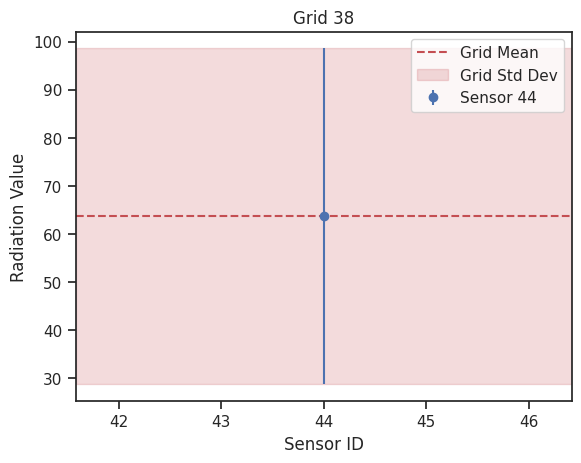

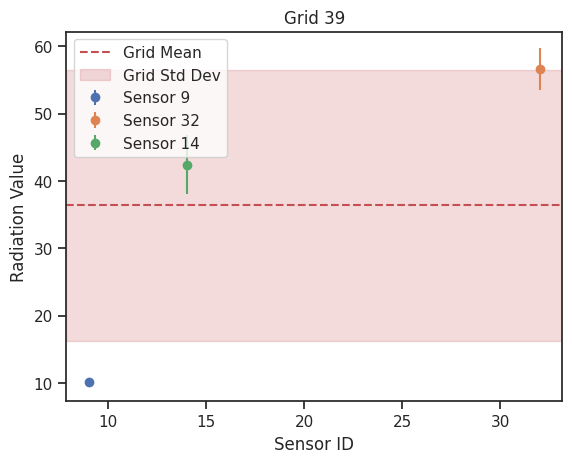

...

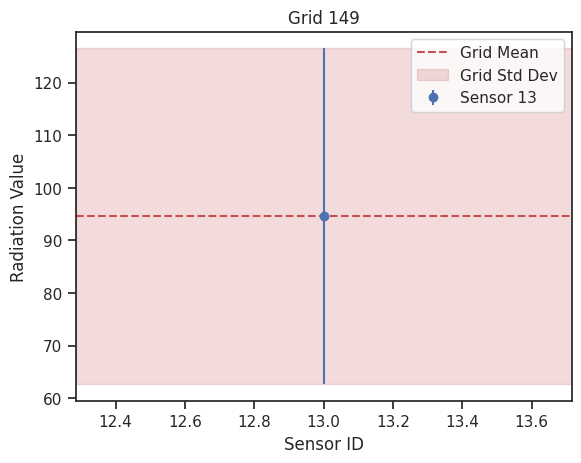

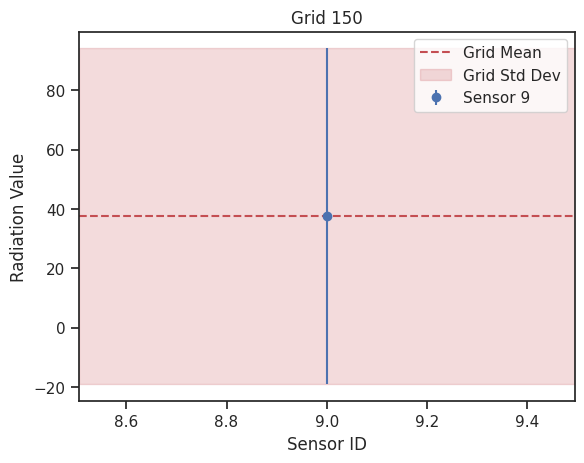

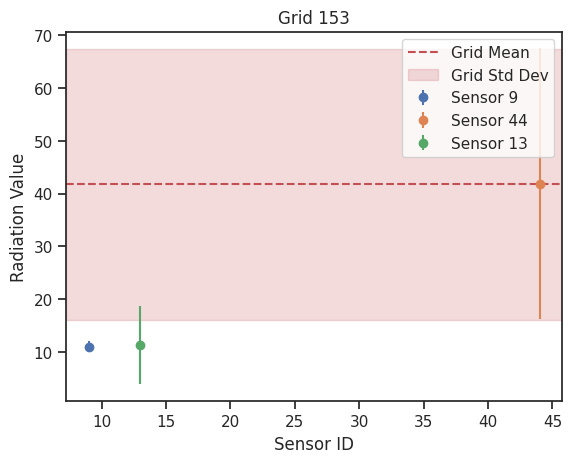

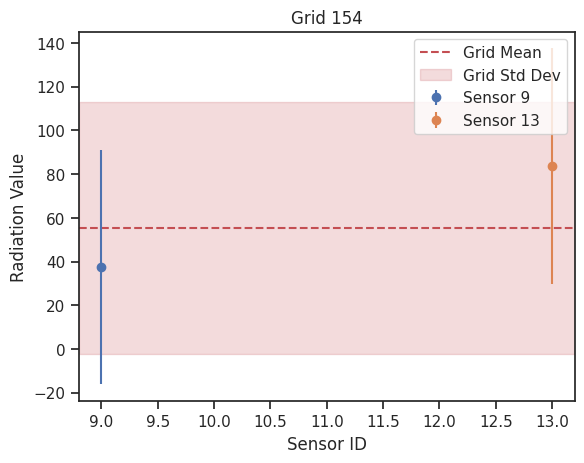

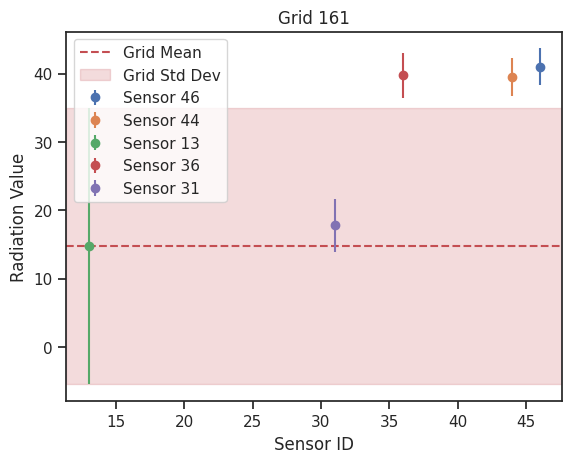

In [ ]:
# for df_grid_34_161, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID

# Iterate over each unique grid
for grid_number in sorted(df_grid_34_161['grid_number'].unique()):
  # Filter data for the current grid
  grid_data = df_grid_34_161[df_grid_34_161['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

In [ ]:
# Based on the visualiziotion: sensor 9 on grid 148, show very high value
df_grid_34_161_sensor9_148 = df_grid_34_161[(df_grid_34_161['Sensor-id'] == 9) & (df_grid_34_161['grid_number'] == 148)]
df_grid_34_161_sensor9_148

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
15284,0.157,-119.788,94.241793,165.254359,2020-04-06 11:55:25,9,0.157842,-119.787455,11.000000,94.241793,165.254359,148,-0.503719,-0.503719
15285,0.157,-119.788,94.241793,165.254359,2020-04-06 11:55:30,9,0.157615,-119.787440,11.000000,94.241793,165.254359,148,-0.503719,-0.503719
15286,0.157,-119.788,94.241793,165.254359,2020-04-06 11:55:35,9,0.157515,-119.787234,12.000000,94.241793,165.254359,148,-0.497668,-0.497668
15287,0.157,-119.788,94.241793,165.254359,2020-04-06 11:55:40,9,0.157515,-119.787234,10.000000,94.241793,165.254359,148,-0.509770,-0.509770
15288,0.157,-119.788,94.241793,165.254359,2020-04-06 11:55:45,9,0.157515,-119.787234,12.000000,94.241793,165.254359,148,-0.497668,-0.497668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22876,0.157,-119.788,94.241793,165.254359,2020-04-08 16:46:10,9,0.157593,-119.787190,40.959834,94.241793,165.254359,148,-0.322424,-0.322424
22877,0.157,-119.788,94.241793,165.254359,2020-04-08 16:46:15,9,0.157553,-119.787174,46.049352,94.241793,165.254359,148,-0.291626,-0.291626
22878,0.157,-119.788,94.241793,165.254359,2020-04-08 16:46:20,9,0.157517,-119.787285,46.342496,94.241793,165.254359,148,-0.289852,-0.289852
22879,0.157,-119.788,94.241793,165.254359,2020-04-08 16:46:25,9,0.157483,-119.787595,55.106452,94.241793,165.254359,148,-0.236819,-0.236819


In [ ]:
df_grid_34_161_sensor9_148.loc[:,'Timestamp'] = pd.to_datetime(df_grid_34_161_sensor9_148['Timestamp'])

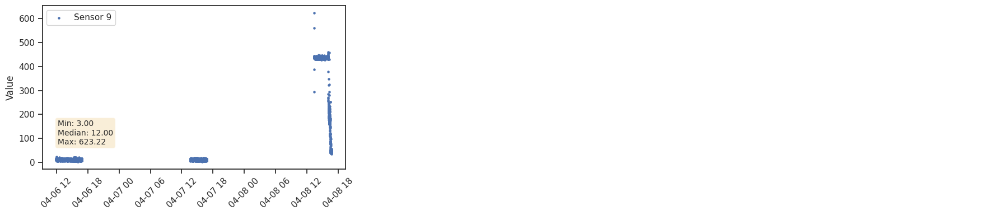

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_34_161_sensor9_148['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_34_161_sensor9_148[df_grid_34_161_sensor9_148['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
grid_148_location = Point(-119.788, 0.157)

danger_location['Grid_number'].append(148)
danger_location['Sensor'].append([9])
danger_location['Location'].append(grid_148_location)
danger_location['Time start'].append('2020-04-08 13:21:55')
danger_location['Time end'].append('2020-04-08 16:08:05')
danger_location['Mean Value'].append(450)
danger_location

{'Grid_number': [1, 8, 148, 148],
 'Sensor': [[20], [21, 22, 24, 25, 27, 28, 29], [9], [9]],
 'Location': [<POINT (-119.771 0.033)>,
  <POINT (-119.728 0.055)>,
  <POINT (-119.788 0.157)>],
 'Time start': ['2020-04-09 15:01:15',
  '2020-04-09 20:00:00',
  '2020-04-08 13:21:55'],
 'Time end': ['2020-04-10 13:03:55',
  '2020-04-10 07:00:00',
  '2020-04-08 16:08:05'],
 'Mean Value': [200, 1500, 450]}

In [ ]:
# Based on the visualiziotion: sensor 13 on grid 149, show very high value
df_grid_34_161_sensor13_149 = df_grid_34_161[(df_grid_34_161['Sensor-id'] == 13) & (df_grid_34_161['grid_number'] == 149)]
df_grid_34_161_sensor13_149.loc[:,'Timestamp'] = pd.to_datetime(df_grid_34_161_sensor13_149['Timestamp'])
df_grid_34_161_sensor13_149

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
88542,0.158,-119.79,94.563015,31.926159,2020-04-09 12:38:35,13,0.158753,-119.789460,165.101512,94.563015,31.926159,149,2.209426,2.209426
88543,0.158,-119.79,94.563015,31.926159,2020-04-09 12:38:40,13,0.158674,-119.789646,115.826545,94.563015,31.926159,149,0.666022,0.666022
88544,0.158,-119.79,94.563015,31.926159,2020-04-09 12:38:45,13,0.158448,-119.789716,93.398999,94.563015,31.926159,149,-0.036460,-0.036460
88545,0.158,-119.79,94.563015,31.926159,2020-04-09 12:38:50,13,0.158406,-119.789730,88.057340,94.563015,31.926159,149,-0.203773,-0.203773
88546,0.158,-119.79,94.563015,31.926159,2020-04-09 12:38:55,13,0.158501,-119.789738,92.649601,94.563015,31.926159,149,-0.059932,-0.059932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92729,0.158,-119.79,94.563015,31.926159,2020-04-09 20:31:50,13,0.158391,-119.789631,53.219942,94.563015,31.926159,149,-1.294959,-1.294959
92730,0.158,-119.79,94.563015,31.926159,2020-04-09 20:31:55,13,0.158391,-119.789631,55.883916,94.563015,31.926159,149,-1.211517,-1.211517
92731,0.158,-119.79,94.563015,31.926159,2020-04-09 20:32:00,13,0.158379,-119.789659,56.531033,94.563015,31.926159,149,-1.191248,-1.191248
92732,0.158,-119.79,94.563015,31.926159,2020-04-09 20:32:05,13,0.158515,-119.789709,58.795412,94.563015,31.926159,149,-1.120323,-1.120323


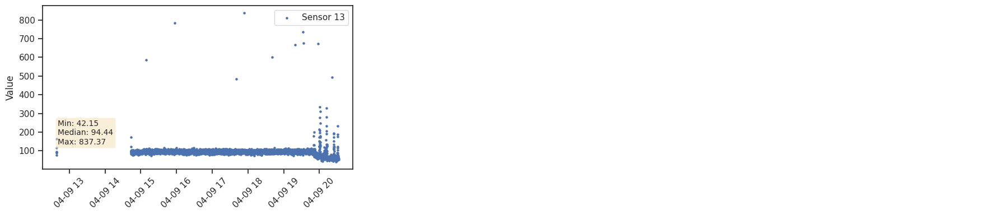

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_34_161_sensor13_149['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_34_161_sensor13_149[df_grid_34_161_sensor13_149['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
grid_149_location = Point(-119.79, 0.158)

danger_location['Grid_number'].append(149)
danger_location['Sensor'].append([13])
danger_location['Location'].append(grid_149_location)
danger_location['Time start'].append('2020-04-09 14:43:25')
danger_location['Time end'].append('2020-04-09 20:32:10')
danger_location['Mean Value'].append(100)
danger_location

{'Grid_number': [1, 8, 148, 149],
 'Sensor': [[20], [21, 22, 24, 25, 27, 28, 29], [9], [13]],
 'Location': [<POINT (-119.771 0.033)>,
  <POINT (-119.728 0.055)>,
  <POINT (-119.788 0.157)>,
  <POINT (-119.79 0.158)>],
 'Time start': ['2020-04-09 15:01:15',
  '2020-04-09 20:00:00',
  '2020-04-08 13:21:55',
  '2020-04-09 14:43:25'],
 'Time end': ['2020-04-10 13:03:55',
  '2020-04-10 07:00:00',
  '2020-04-08 16:08:05',
  '2020-04-09 20:32:10'],
 'Mean Value': [200, 1500, 450, 100]}

In [ ]:
selected_df = filtered_df_4[(filtered_df_4['Lat_grid'] > 0.17) & (filtered_df_4['Long_grid'] > -119.88) & (filtered_df_4['Long_grid'] < -119.75)]
grid_list = sorted(selected_df['grid_number'].unique())
print(grid_list)

[164, 167, 168, 169, 173, 174, 176, 180, 181, 185, 186, 188, 191, 192, 193, 194, 198, 199, 201, 202, 203]


In [ ]:
df_grid_164_203 = filtered_df_4[filtered_df_4['grid_number'].isin(grid_list)]
df_grid_164_203.loc[:,'Timestamp'] = pd.to_datetime(df_grid_164_203['Timestamp'])
lst =df_grid_164_203['Sensor-id'].unique()
print(lst)

[49 10  7  8 12  9  5 36 46 14 11  6 47]


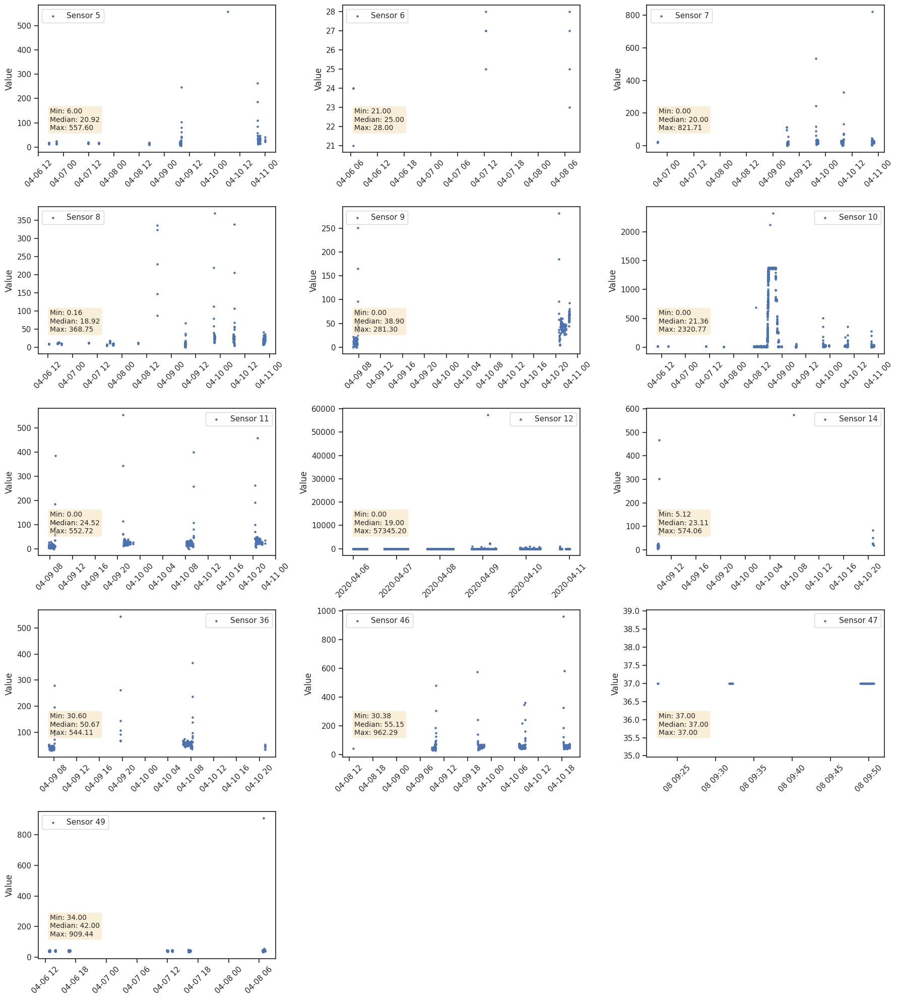

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_164_203 ['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_164_203 [df_grid_164_203 ['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

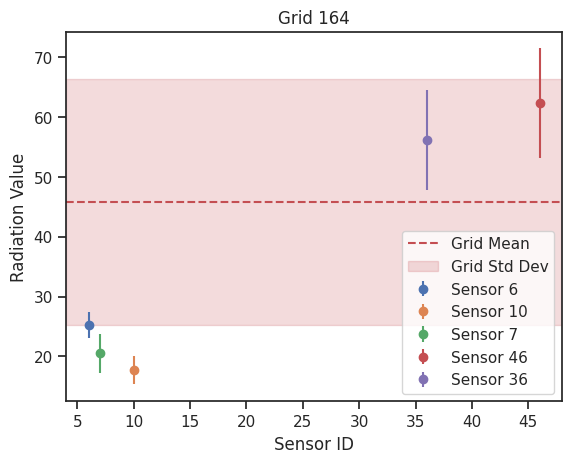

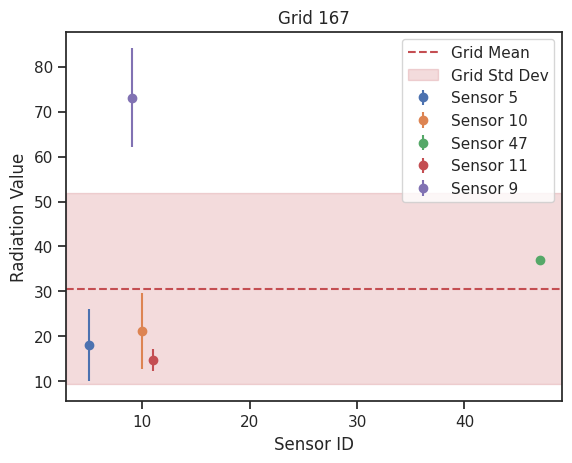

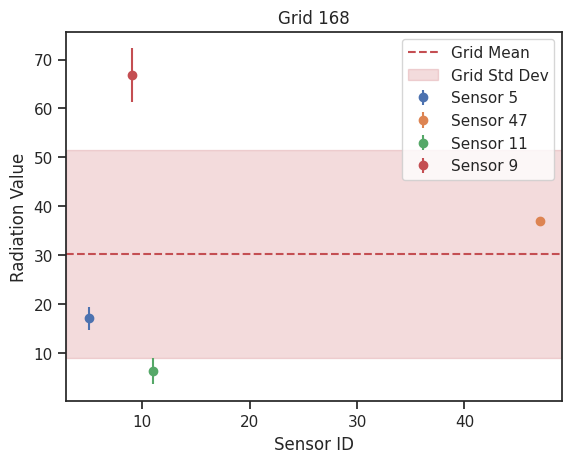

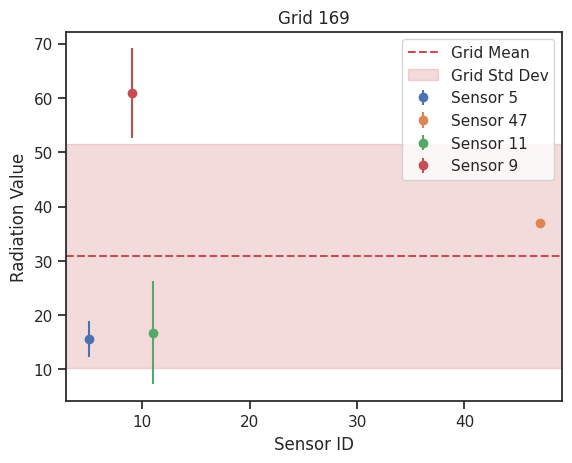

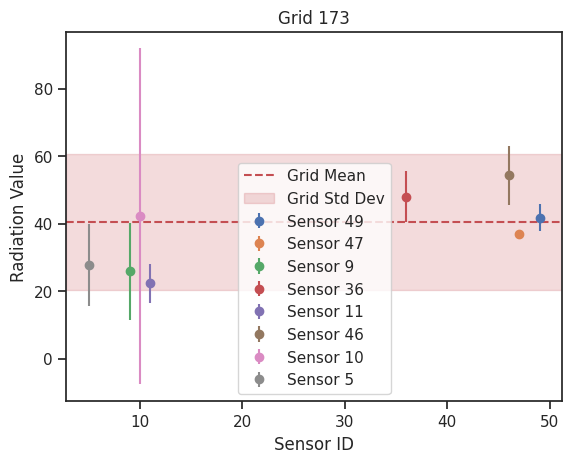

...

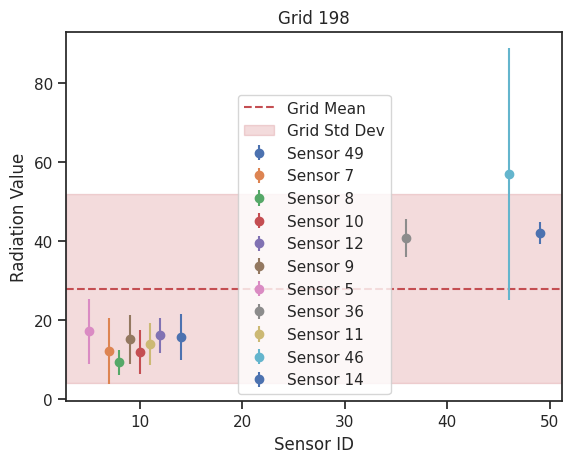

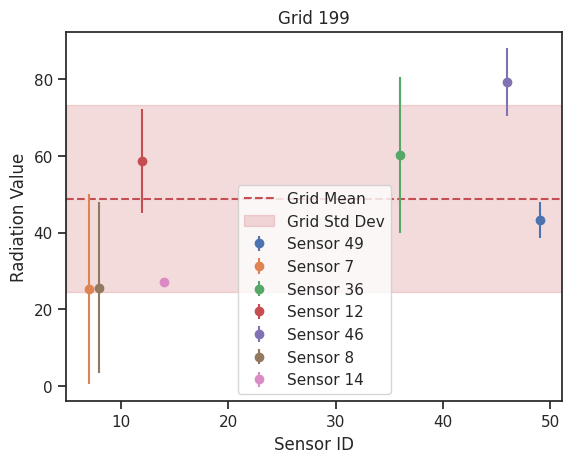

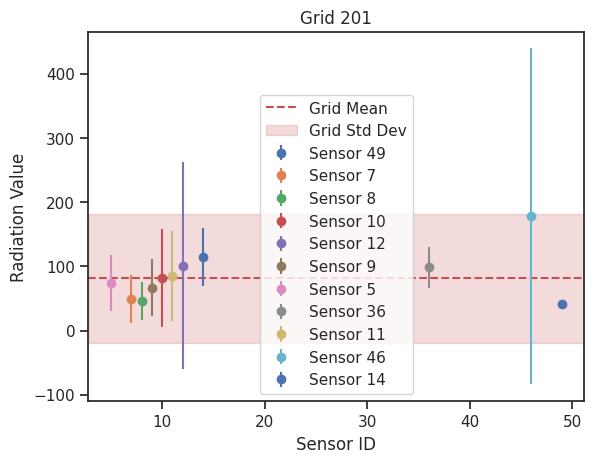

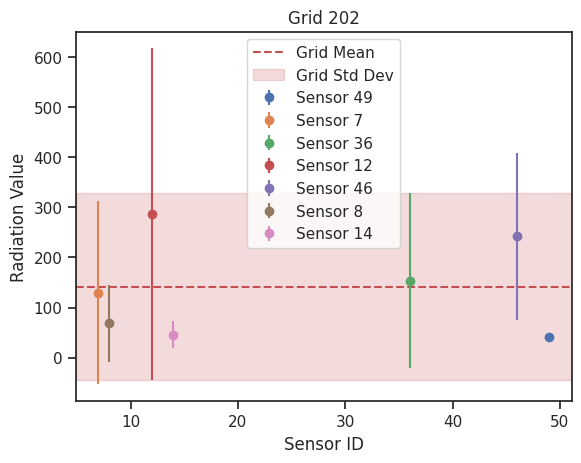

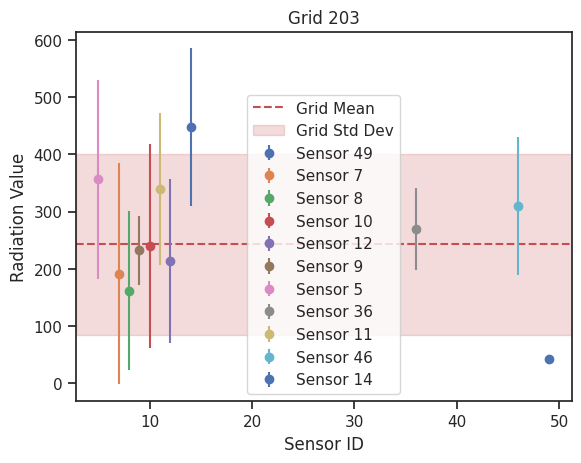

In [ ]:
# for df_grid_164_203, plot  for each grid,  have the grid_mean, grid_std, grid_senser_mean, grid_sensor_std, sensor name and also add sensor ID

# Iterate over each unique grid
for grid_number in sorted(df_grid_164_203['grid_number'].unique()):
  # Filter data for the current grid
  grid_data = df_grid_164_203[df_grid_164_203['grid_number'] == grid_number]

  # Extract relevant information
  grid_mean = grid_data['grid_mean'].iloc[0]
  grid_std = grid_data['grid_std'].iloc[0]
  sensor_ids = grid_data['Sensor-id'].unique()

  # Create a figure and axes
  fig, ax = plt.subplots()

  # Plot grid mean and std
  ax.axhline(y=grid_mean, color='r', linestyle='--', label='Grid Mean')
  ax.axhspan(grid_mean - grid_std, grid_mean + grid_std, alpha=0.2, color='r', label='Grid Std Dev')

  # Plot sensor means and stds
  for sensor_id in sensor_ids:
    sensor_data = grid_data[grid_data['Sensor-id'] == sensor_id]
    sensor_mean = sensor_data['grid_sensor_mean'].iloc[0]
    sensor_std = sensor_data['grid_sensor_std'].iloc[0]
    ax.errorbar(sensor_id, sensor_mean, yerr=sensor_std, fmt='o', label=f'Sensor {sensor_id}')

  # Set title and labels
  ax.set_title(f'Grid {grid_number}')
  ax.set_xlabel('Sensor ID')
  ax.set_ylabel('Radiation Value')
  ax.legend()

  # Display the plot
  plt.show()

In [ ]:
df_grid_194 = df_grid_164_203[(df_grid_164_203['grid_number'] == 194)]
df_grid_194

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
22881,0.21,-119.815,556.998383,623.098776,2020-04-06 12:57:15,49,0.210722,-119.814990,36.000000,42.000000,6.819091,194,-0.879883,-0.836141
22882,0.21,-119.815,556.998383,623.098776,2020-04-06 12:57:20,49,0.210981,-119.814983,39.000000,42.000000,6.819091,194,-0.439941,-0.831326
22883,0.21,-119.815,556.998383,623.098776,2020-04-07 12:04:40,49,0.210688,-119.814995,38.000000,42.000000,6.819091,194,-0.586588,-0.832931
22884,0.21,-119.815,556.998383,623.098776,2020-04-08 06:59:25,49,0.210700,-119.814994,53.000000,42.000000,6.819091,194,1.613118,-0.808858
22885,0.21,-119.815,556.998383,623.098776,2020-04-08 06:59:30,49,0.210979,-119.814985,44.000000,42.000000,6.819091,194,0.293294,-0.823302
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27468,0.21,-119.815,556.998383,623.098776,2020-04-10 20:46:10,9,0.210338,-119.814977,5.713555,6.453064,6.947821,194,-0.106438,-0.884747
27469,0.21,-119.815,556.998383,623.098776,2020-04-10 20:51:25,14,0.210005,-119.814015,19.290324,18.302693,1.396720,194,0.707107,-0.862958
27470,0.21,-119.815,556.998383,623.098776,2020-04-10 21:06:40,7,0.210919,-119.814945,7.976330,10.597041,4.727164,194,-0.554394,-0.881116
27471,0.21,-119.815,556.998383,623.098776,2020-04-10 21:06:45,7,0.210682,-119.814967,14.530663,10.597041,4.727164,194,0.832131,-0.870597


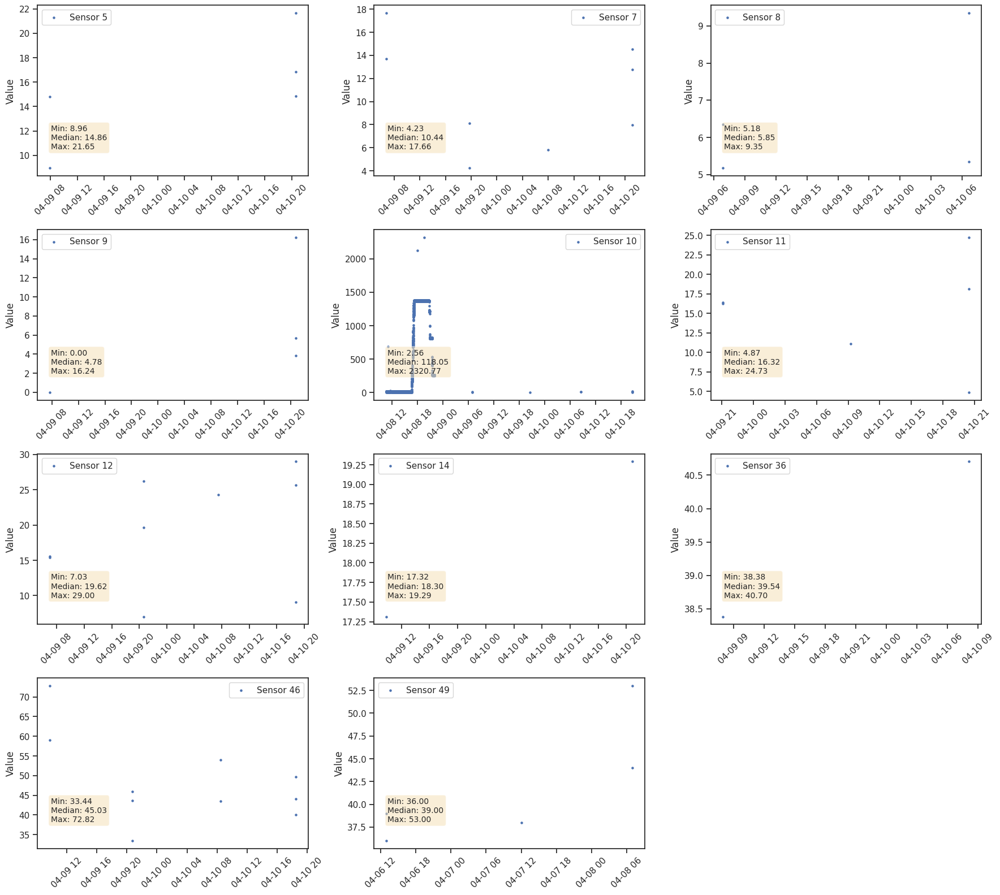

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_194['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data = df_grid_194[df_grid_194['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
grid_194_location = Point(-119.815, 0.21 )

danger_location['Grid_number'].append(194)
danger_location['Sensor'].append([10])
danger_location['Location'].append(grid_194_location)
danger_location['Time start'].append('2020-04-08 16:41:35')
danger_location['Time end'].append('2020-04-08 22:02:15')
danger_location['Mean Value'].append(1300)
danger_location

{'Grid_number': [1, 8, 148, 149, 194],
 'Sensor': [[20], [21, 22, 24, 25, 27, 28, 29], [9], [13], [10]],
 'Location': [<POINT (-119.771 0.033)>,
  <POINT (-119.728 0.055)>,
  <POINT (-119.788 0.157)>,
  <POINT (-119.79 0.158)>,
  <POINT (-119.815 0.21)>],
 'Time start': ['2020-04-09 15:01:15',
  '2020-04-09 20:00:00',
  '2020-04-08 13:21:55',
  '2020-04-09 14:43:25',
  '2020-04-08 16:41:35'],
 'Time end': ['2020-04-10 13:03:55',
  '2020-04-10 07:00:00',
  '2020-04-08 16:08:05',
  '2020-04-09 20:32:10',
  '2020-04-08 22:02:15'],
 'Mean Value': [200, 1500, 450, 100, 1300]}

In [ ]:
df_grid_201_203 = df_grid_164_203[df_grid_164_203['grid_number'].isin([201, 201,203])]
df_grid_201_203

,Lat_grid,Long_grid,grid_mean,grid_std,Timestamp,Sensor-id,Lat,Long,Value,grid_sensor_mean,grid_sensor_std,grid_number,Z_score_sensor,Z_score_grid
27473,0.237,-119.807,81.667939,100.365839,2020-04-06 14:01:45,49,0.237080,-119.806865,41.000000,41.388889,2.546945,201,-0.152688,-0.405197
27474,0.237,-119.807,81.667939,100.365839,2020-04-06 14:01:50,49,0.237155,-119.806708,40.000000,41.388889,2.546945,201,-0.545316,-0.415161
27475,0.237,-119.807,81.667939,100.365839,2020-04-06 14:01:55,49,0.237384,-119.806619,37.000000,41.388889,2.546945,201,-1.723197,-0.445051
27476,0.237,-119.807,81.667939,100.365839,2020-04-06 14:02:00,49,0.237666,-119.806586,44.000000,41.388889,2.546945,201,1.025193,-0.375306
27477,0.237,-119.807,81.667939,100.365839,2020-04-06 14:02:05,49,0.237749,-119.806398,45.000000,41.388889,2.546945,201,1.417821,-0.365343
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27656,0.238,-119.807,243.238973,158.171210,2020-04-10 09:25:40,11,0.238332,-119.806116,399.143376,339.897077,132.572040,203,0.446899,0.985669
27657,0.238,-119.807,243.238973,158.171210,2020-04-10 20:18:55,11,0.238214,-119.806234,261.018521,339.897077,132.572040,203,-0.594986,0.112407
27658,0.238,-119.807,243.238973,158.171210,2020-04-10 20:26:10,5,0.238204,-119.806235,263.531049,356.188877,174.613424,203,-0.530646,0.128292
27659,0.238,-119.807,243.238973,158.171210,2020-04-10 20:29:30,10,0.238226,-119.806219,277.357582,240.406934,178.000265,203,0.207588,0.215707


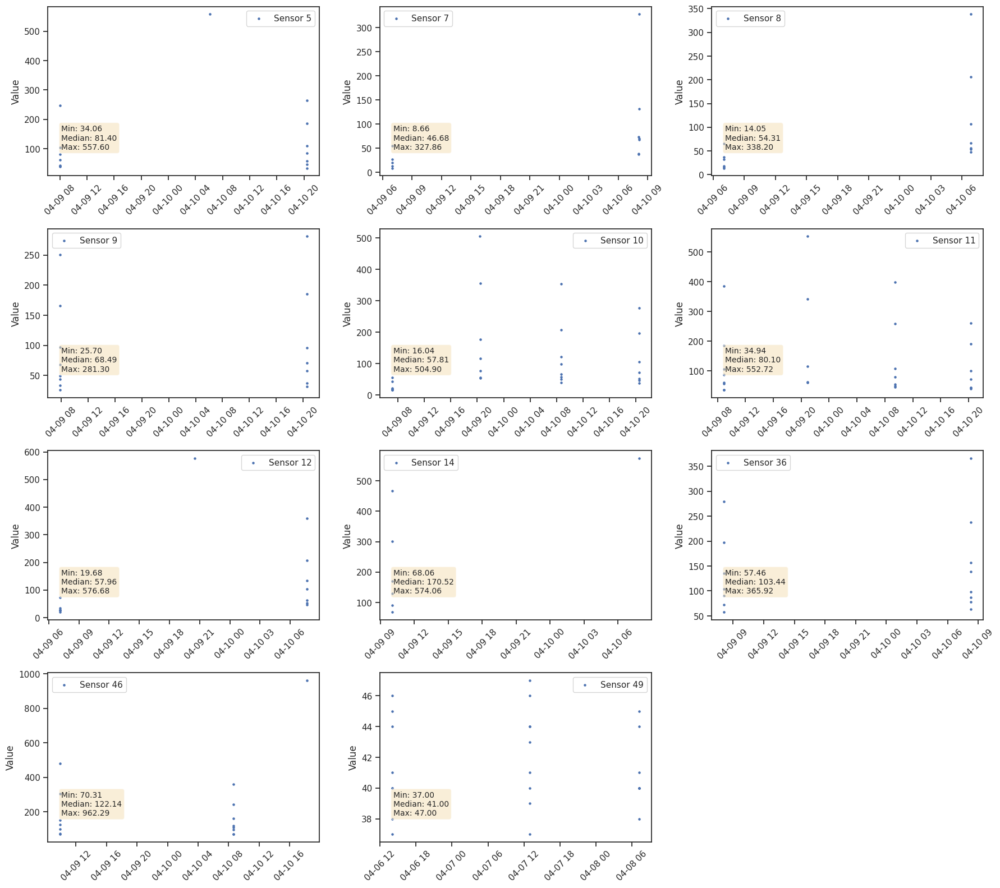

In [ ]:
# Get unique sensor ids
sensor_ids = sorted(df_grid_201_203['Sensor-id'].unique())

nrows = (len(sensor_ids) + 2) // 3
ncols = 3

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 4 * nrows))

# Flatten axes array for easier indexing
axes = axes.flatten()

# Plot each sensor's data
for i, sensor_id in enumerate(sensor_ids):
    # Filter data for this sensor
    sensor_data =df_grid_201_203[df_grid_201_203['Sensor-id'] == sensor_id]
    min_value = sensor_data['Value'].min()
    max_value = sensor_data['Value'].max()
    median_value = sensor_data['Value'].median()

    # Create scatter plot with smaller points
    axes[i].scatter(sensor_data['Timestamp'], sensor_data['Value'], label=f'Sensor {sensor_id}', marker='o', s=5)
    #axes[i].set_xlabel('Timestamp')
    axes[i].set_ylabel('Value')
    #axes[i].set_title(f'Sensor {sensor_id}')
    axes[i].legend()
    axes[i].tick_params(axis='x', rotation=45)
    textstr = '\n'.join((
        f'Min: {min_value:.2f}',
        f'Median: {median_value:.2f}',
        f'Max: {max_value:.2f}'
    ))
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    axes[i].text(0.05, 0.3, textstr, transform=axes[i].transAxes, fontsize=10,
                 verticalalignment='top', bbox=props)

# Hide any unused subplots (if the number of sensors is odd)
for j in range(len(sensor_ids), len(axes)):
    axes[j].axis('off')

# Adjust layout to avoid overlap
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
danger_location_df = pd.DataFrame(danger_location)
danger_location_df

,Grid_number,Sensor,Location,Time start,Time end,Mean Value
0,1,[20],POINT (-119.7709 0.03335),2020-04-09 15:01:15,2020-04-10 13:03:55,200
1,8,"[21, 22, 24, 25, 27, 28, 29]",POINT (-119.72769 0.05481),2020-04-09 20:00:00,2020-04-10 07:00:00,1500
2,148,[9],POINT (-119.788 0.157),2020-04-08 13:21:55,2020-04-08 16:08:05,450
3,149,[13],POINT (-119.79 0.158),2020-04-09 14:43:25,2020-04-09 20:32:10,100
4,194,[10],POINT (-119.815 0.21),2020-04-08 16:41:35,2020-04-08 22:02:15,1300


In [ ]:
danger_location_df.to_csv('danger_location.csv')